## Dataset CSV

In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf

In [3]:
df = pd.read_csv('dataset/characters.csv')
df

,name,height,mass,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,77,blond,fair,blue,19BBY,male,Tatooine,Human
1,C-3PO,167.0,75,NaN,gold,yellow,112BBY,NaN,Tatooine,Droid
2,R2-D2,96.0,32,NaN,"white, blue",red,33BBY,NaN,Naboo,Droid
3,Darth Vader,202.0,136,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,49,brown,light,brown,19BBY,female,Alderaan,Human
...,...,...,...,...,...,...,...,...,...,...
82,Rey,NaN,NaN,brown,light,hazel,NaN,female,NaN,Human
83,Poe Dameron,NaN,NaN,brown,light,brown,NaN,male,NaN,Human
84,BB8,NaN,NaN,none,none,black,NaN,none,NaN,Droid
85,Captain Phasma,NaN,NaN,NaN,NaN,NaN,NaN,female,NaN,NaN


## Question-Answer dataset

In [4]:
df_q = pd.read_csv('dataset/question_answer.csv')
df_q

,Q: What is Luke Skywalker's height?
0,A: Luke Skywalker's height is 172.
1,Q: What is Luke Skywalker's mass?
2,A: Luke Skywalker's mass is 77.
3,Q: What is Luke Skywalker's hair color?
4,A: Luke Skywalker's hair color is blond.
...,...
232,A: Chewbacca is Wookiee.
233,Q: What is Han Solo's height?
234,A: Han Solo's height is 180.
235,Q: What is Han Solo's mass?


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        87 non-null     object 
 1   height      81 non-null     float64
 2   mass        59 non-null     object 
 3   hair_color  81 non-null     object 
 4   skin_color  85 non-null     object 
 5   eye_color   84 non-null     object 
 6   birth_year  43 non-null     object 
 7   gender      84 non-null     object 
 8   homeworld   77 non-null     object 
 9   species     82 non-null     object 
dtypes: float64(1), object(9)
memory usage: 6.9+ KB


## Preprocess

In [6]:
cols = ['mass']
df = df.drop(cols, axis=1)

In [7]:
df

,name,height,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,blond,fair,blue,19BBY,male,Tatooine,Human
1,C-3PO,167.0,NaN,gold,yellow,112BBY,NaN,Tatooine,Droid
2,R2-D2,96.0,NaN,"white, blue",red,33BBY,NaN,Naboo,Droid
3,Darth Vader,202.0,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,brown,light,brown,19BBY,female,Alderaan,Human
...,...,...,...,...,...,...,...,...,...
82,Rey,NaN,brown,light,hazel,NaN,female,NaN,Human
83,Poe Dameron,NaN,brown,light,brown,NaN,male,NaN,Human
84,BB8,NaN,none,none,black,NaN,none,NaN,Droid
85,Captain Phasma,NaN,NaN,NaN,NaN,NaN,female,NaN,NaN


In [8]:
df = df.dropna() # drop all rows in the data that have missing values(Nan)

In [9]:
df

,name,height,hair_color,skin_color,eye_color,birth_year,gender,homeworld,species
0,Luke Skywalker,172.0,blond,fair,blue,19BBY,male,Tatooine,Human
3,Darth Vader,202.0,none,white,yellow,41.9BBY,male,Tatooine,Human
4,Leia Organa,150.0,brown,light,brown,19BBY,female,Alderaan,Human
5,Owen Lars,178.0,"brown, grey",light,blue,52BBY,male,Tatooine,Human
6,Beru Whitesun lars,165.0,brown,light,blue,47BBY,female,Tatooine,Human
8,Biggs Darklighter,183.0,black,light,brown,24BBY,male,Tatooine,Human
9,Obi-Wan Kenobi,182.0,"auburn, white",fair,blue-gray,57BBY,male,Stewjon,Human
10,Anakin Skywalker,188.0,blond,fair,blue,41.9BBY,male,Tatooine,Human
11,Wilhuff Tarkin,180.0,"auburn, grey",fair,blue,64BBY,male,Eriadu,Human
13,Han Solo,180.0,brown,fair,brown,29BBY,male,Corellia,Human


## Data Splitting

In [10]:
import nltk
from sklearn.model_selection import train_test_split

# Assume you have a list of sentences as your corpus
corpus = ["I love NLP.", "This is a sentence.", "NLP is fun!"]

# Assume you have corresponding labels for each sentence
labels = ["positive", "neutral", "positive"]

# Split the data into train and test sets
corpus_train, corpus_test, labels_train, labels_test = train_test_split(corpus, labels, test_size=0.2, random_state=42)

# Now you have the training and testing data ready
print("Training Corpus:", corpus_train)
print("Training Labels:", labels_train)
print("Testing Corpus:", corpus_test)
print("Testing Labels:", labels_test)

Training Corpus: ['This is a sentence.', 'NLP is fun!']
Training Labels: ['neutral', 'positive']
Testing Corpus: ['I love NLP.']
Testing Labels: ['positive']


## Word2Vec

In [11]:
corpus_raw = 'He is the king . The king is royal . She is the royal  queen '
# convert to lower case
corpus_raw = corpus_raw.lower()

words = []
for word in corpus_raw.split():
    if word != '.': # because we don't want to treat . as a word
        words.append(word)

words = set(words) # so that all duplicate words are removed
word2int = {}
int2word = {}
vocab_size = len(words) # gives the total number of unique words

for i,word in enumerate(words):
    word2int[word] = i
    int2word[i] = word

In [12]:
print(word2int['queen'])
print(int2word[6])

6
queen


In [13]:
raw_sentences = corpus_raw.split('.')
sentences = []

for sentence in raw_sentences:
    sentences.append(sentence.split())

print(sentences)

[['he', 'is', 'the', 'king'], ['the', 'king', 'is', 'royal'], ['she', 'is', 'the', 'royal', 'queen']]


## Now, we will generate our training data:

In [14]:
data = []
WINDOW_SIZE = 2

for sentence in sentences:
    for word_index, word in enumerate(sentence):
        for nb_word in sentence[max(word_index - WINDOW_SIZE, 0) : min(word_index + WINDOW_SIZE, len(sentence)) + 1] : 
            if nb_word != word:
                data.append([word, nb_word])

## This basically gives a list of word, word pairs. (we are considering a window size of 2)

In [15]:
print(data)

[['he', 'is'], ['he', 'the'], ['is', 'he'], ['is', 'the'], ['is', 'king'], ['the', 'he'], ['the', 'is'], ['the', 'king'], ['king', 'is'], ['king', 'the'], ['the', 'king'], ['the', 'is'], ['king', 'the'], ['king', 'is'], ['king', 'royal'], ['is', 'the'], ['is', 'king'], ['is', 'royal'], ['royal', 'king'], ['royal', 'is'], ['she', 'is'], ['she', 'the'], ['is', 'she'], ['is', 'the'], ['is', 'royal'], ['the', 'she'], ['the', 'is'], ['the', 'royal'], ['the', 'queen'], ['royal', 'is'], ['royal', 'the'], ['royal', 'queen'], ['queen', 'the'], ['queen', 'royal']]


In [16]:
def to_one_hot(data_point_index, vocab_size):
    temp = np.zeros(vocab_size)
    temp[data_point_index] = 1
    return temp

## Convert these numbers into one hot vectors

In [17]:
x_train = [] # input word
y_train = [] # output word

for data_word in data:
    x_train.append(to_one_hot(word2int[ data_word[0] ], vocab_size))
    y_train.append(to_one_hot(word2int[ data_word[1] ], vocab_size))

# convert them to numpy arrays
x_train = np.asarray(x_train)
y_train = np.asarray(y_train)

In [18]:
print(x_train)

[[0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1.]]


## 34 training points, where each point has 7 dimensions

In [19]:
print(x_train.shape, y_train.shape)

(34, 7) (34, 7)


## training data into the embedded representation.
    - embedding_dim is a hyperparameter

In [32]:
class MyLayer(tf.keras.layers.Layer):
    def __init__(self, embedding_dim, vocab_size):
        super(MyLayer, self).__init__()
        self.embedding_dim = embedding_dim
        self.vocab_size = vocab_size
        self.W1 = self.add_weight(shape=(vocab_size, embedding_dim), initializer='random_normal', trainable=True)
        self.b1 = self.add_weight(shape=(embedding_dim,), initializer='random_normal', trainable=True)
        self.W2 = self.add_weight(shape=(embedding_dim, vocab_size), initializer='random_normal', trainable=True)
        self.b2 = self.add_weight(shape=(vocab_size,), initializer='random_normal', trainable=True)

    def call(self, x):
        hidden_representation = tf.add(tf.matmul(x, self.W1), self.b1)
        prediction = tf.nn.softmax(tf.add(tf.matmul(hidden_representation, self.W2), self.b2))
        return hidden_representation, prediction

In [ ]:
# making placeholders for x_train and y_train
# x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
# y_label = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
    
# EMBEDDING_DIM = 5 # you can choose your own number

## we take what we have in the embedded dimension and make a prediction about the neighbour. To make the prediction we use softmaxm

In [ ]:
# x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
# my_layer = MyLayer(EMBEDDING_DIM, vocab_size)
# hidden_representation, prediction = my_layer(x)

# that’s left is to train it:

In [41]:
# Define the graph
graph = tf.Graph()
with graph.as_default():
    
    # making placeholders for x_train and y_train
    x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
    y_label = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)

    EMBEDDING_DIM = 15 # you can choose your own number

    x = tf.keras.Input(shape=(vocab_size,), dtype=tf.float32)
    my_layer = MyLayer(EMBEDDING_DIM, vocab_size)
    hidden_representation, prediction = my_layer(x)

    # Initialize the variables
    init = tf.compat.v1.global_variables_initializer()

# Create a TensorFlow session and run the initialization
with tf.compat.v1.Session(graph=graph) as sess:
    sess.run(init)
    cross_entropy_loss = tf.reduce_mean(-tf.reduce_sum(y_label * tf.math.log(prediction), axis=1))

    # Define the training step
    optimizer = tf.compat.v1.train.GradientDescentOptimizer(0.1)
    train_step = optimizer.minimize(cross_entropy_loss)

    n_iters = 10000
    for _ in range(n_iters):
        feed_dict = {x: x_train, y_label: y_train}
        sess.run(train_step, feed_dict=feed_dict)

        # Display of loss
        print('loss is : ', sess.run(cross_entropy_loss, feed_dict={x: x_train, y_label: y_train}))
        
        # Hidden representations.
        print(sess.run(my_layer.W1))
        print('----------')
        print(sess.run(my_layer.b1))
        print('----------')

loss is :  1.9351876
[[-0.10586611 -0.03675437  0.00978027 -0.04671894 -0.03763733  0.01959611
   0.08842404 -0.01428086  0.02287081 -0.09551551 -0.0096544   0.03124587
   0.02288633  0.07744041 -0.01985046]
 [ 0.01019386 -0.02306899  0.00287625  0.09465852  0.02948018 -0.02392142
  -0.01765385 -0.01247957 -0.00405425 -0.0007373   0.05264409 -0.03880982
  -0.04515288  0.08334608  0.02376312]
 [ 0.00369044  0.08587423 -0.05567384  0.06362475  0.00723345  0.0299364
   0.03218481  0.04330146 -0.03454499  0.0275483  -0.00657179 -0.05208623
  -0.0449494  -0.0806115   0.04203236]
 [-0.00202836  0.03493484 -0.01168421  0.05658499 -0.04285467 -0.00142753
  -0.03237584  0.00649305  0.00384244  0.01347521  0.03182475 -0.00008397
   0.07615418 -0.02625591 -0.01773071]
 [ 0.00372487  0.02448763  0.00354929 -0.03479929  0.03442027 -0.03073466
  -0.00721986 -0.00866648  0.08900688 -0.04366127  0.05866129  0.07638738
  -0.00310305 -0.02743841 -0.03045087]
 [-0.04437605 -0.00350824  0.00204929  0.0334

loss is :  1.7798586
[[-0.10357259 -0.09143776  0.03573174 -0.10245689 -0.03686386  0.0463702
   0.09805586  0.00666564  0.0261562  -0.129904   -0.0023975   0.07013418
   0.05280999  0.10897575  0.00660952]
 [ 0.0092896  -0.00463199 -0.00357947  0.13341554  0.07192209 -0.02222342
  -0.02975413 -0.01428823 -0.00928101  0.00636498  0.04975745 -0.06483576
  -0.07426237  0.05105015  0.00561074]
 [-0.00618801  0.10707295 -0.07734115  0.06104141 -0.00072736  0.02047557
   0.04494332  0.02566053 -0.02327043  0.01710198  0.00281003 -0.06717195
  -0.05610902 -0.07823081  0.02077509]
 [-0.0299232   0.04673398 -0.04071715  0.04459669 -0.05973022 -0.02541022
  -0.01044104 -0.02057841  0.0253198  -0.00980481  0.05167329 -0.03055661
   0.07284749 -0.01413865 -0.05715957]
 [-0.00601691  0.04601493 -0.01823862 -0.03701701  0.02648898 -0.04012019
   0.00538776 -0.02635424  0.10017133 -0.05384164  0.06804977  0.06117362
  -0.01456152 -0.0253308  -0.05178232]
 [-0.05647753  0.03719416 -0.02480415  0.0397

[-0.21141934  0.1222635  -0.10018153 -0.20548753 -0.03129923 -0.09138303
  0.12842713 -0.10300201  0.05703931 -0.11466209  0.08821166 -0.17228924
  0.02253994  0.09122626 -0.17158653]
----------
loss is :  1.73011
[[-0.09854393 -0.1798068   0.09335396 -0.1760268  -0.05029907  0.09604117
   0.11062112  0.04566615  0.02378334 -0.17092556 -0.01912221  0.1440341
   0.10585453  0.1633681   0.05516782]
 [ 0.04228546 -0.00363041  0.00491744  0.2188858   0.13782373 -0.01555558
  -0.07248085 -0.00243596 -0.03585066  0.05065993  0.04118807 -0.08332203
  -0.12331299  0.00625189  0.02059881]
 [-0.02170523  0.1394765  -0.10336234  0.05325141 -0.01203829  0.00799711
   0.05914023  0.00649569 -0.01176619  0.008455    0.0166275  -0.08769352
  -0.06398471 -0.08092831 -0.00586279]
 [-0.06719485  0.07444218 -0.07181351  0.02125681 -0.08554048 -0.05197714
   0.01303579 -0.04765516  0.04623552 -0.03062736  0.07631387 -0.0674416
   0.08080723 -0.00567828 -0.10401506]
 [-0.02121333  0.07913086 -0.04465591 -0

[-0.23228924  0.12670247 -0.10819253 -0.22147706 -0.02478714 -0.09983304
  0.13953982 -0.1103782   0.06480485 -0.13346255  0.09816862 -0.18901281
  0.0252505   0.09644989 -0.18906824]
----------
loss is :  1.6810181
[[-0.09123155 -0.28709993  0.1659646  -0.25158766 -0.06690342  0.15764832
   0.12447435  0.09148382  0.0182994  -0.21546729 -0.04763981  0.23279303
   0.16344847  0.2321515   0.11386888]
 [ 0.09306156 -0.01744183  0.02292523  0.33157182  0.2214891  -0.00564438
  -0.1300485   0.01572261 -0.07491149  0.11230449  0.02859135 -0.09726835
  -0.1885234  -0.03852365  0.05678886]
 [-0.03667162  0.1772489  -0.13197713  0.04447209 -0.02616622 -0.00634322
   0.07257573 -0.01269701  0.00064761  0.00222327  0.031241   -0.10876428
  -0.06952561 -0.08937258 -0.03416975]
 [-0.10146509  0.10870523 -0.10359786 -0.00407764 -0.11721949 -0.07869577
   0.03428296 -0.0730244   0.0679789  -0.04799916  0.09991518 -0.10222962
   0.09475408 -0.00303281 -0.15154517]
 [-0.03558888  0.11848578 -0.0742719

loss is :  1.6226078
[[-0.07754226 -0.4030264   0.24526408 -0.31204125 -0.07124113  0.22638136
   0.13277327  0.14058681  0.00635065 -0.2546893  -0.08034652  0.32360312
   0.20970498  0.30336106  0.18032302]
 [ 0.15411666 -0.05534898  0.05706891  0.45593968  0.32124212  0.01394161
  -0.19546707  0.04328867 -0.12451273  0.17905506  0.00895044 -0.09988688
  -0.26137647 -0.07389839  0.11432494]
 [-0.0532724   0.2234929  -0.16627054  0.0319447  -0.04652834 -0.0241166
   0.08801922 -0.03445198  0.01631466 -0.00392301  0.04783662 -0.13176098
  -0.07233374 -0.10250624 -0.0675528 ]
 [-0.13627523  0.15052548 -0.13927655 -0.0334892  -0.15806808 -0.10866339
   0.05614672 -0.09997103  0.09343156 -0.06493199  0.12474241 -0.13837232
   0.11528374 -0.0037608  -0.20460396]
 [-0.05111991  0.16772883 -0.11053155 -0.05716415 -0.01493883 -0.08691601
   0.04526138 -0.08821063  0.13836887 -0.06982437  0.11453938 -0.00868635
  -0.03715135 -0.05524044 -0.14190513]
 [-0.04921356  0.18211944 -0.1071614   0.1425

[-0.23667169  0.1045977  -0.09469848 -0.2226703   0.00195384 -0.09263661
  0.13881843 -0.10291335  0.05893134 -0.14411435  0.09545774 -0.18754558
  0.02038439  0.1058334  -0.1792594 ]
----------
loss is :  1.5631161
[[-0.05474627 -0.51160234  0.32017487 -0.34312442 -0.05417809  0.2951039
   0.13131765  0.18775377 -0.01356681 -0.27945969 -0.1122423   0.40515578
   0.23099999  0.36264864  0.25048798]
 [ 0.21682155 -0.11823038  0.1071705   0.5730747   0.42411357  0.04476271
  -0.25991553  0.07921341 -0.17842084  0.23955372 -0.01668881 -0.08762465
  -0.32914892 -0.09240707  0.18652396]
 [-0.07273788  0.27806014 -0.2064753   0.01345528 -0.07470651 -0.04548429
   0.10681391 -0.05923669  0.03613693 -0.01156925  0.06661473 -0.15654597
  -0.07126597 -0.11879337 -0.10687694]
 [-0.17073332  0.19642907 -0.17697117 -0.06270905 -0.20444769 -0.14179748
   0.07663025 -0.12787464  0.12115214 -0.0802291   0.15061523 -0.17718263
   0.1403099  -0.00653359 -0.26189497]
 [-0.06889606  0.22655672 -0.15356632

loss is :  1.5125818
[[-0.0282551  -0.6023211   0.3828516  -0.35772994 -0.02657418  0.35961515
   0.12728482  0.22889158 -0.03572067 -0.29459384 -0.14085495  0.4775781
   0.23316808  0.40722597  0.31798053]
 [ 0.2718013  -0.18193421  0.15551072  0.6760746   0.5129829   0.07488231
  -0.31713894  0.11222019 -0.22617646  0.29163697 -0.03870434 -0.0750544
  -0.38609156 -0.10146827  0.25115743]
 [-0.09462813  0.33753452 -0.2503273  -0.01049414 -0.10868952 -0.06894729
   0.12855135 -0.08587912  0.05912254 -0.02112995  0.08676533 -0.18190342
  -0.06687456 -0.13623603 -0.15007634]
 [-0.20048672  0.2367838  -0.20999952 -0.08123949 -0.24600004 -0.17525102
   0.08978195 -0.1531045   0.1459893  -0.0898524   0.17546573 -0.21847871
   0.16463253 -0.00913876 -0.31678313]
 [-0.08845628  0.29083288 -0.20063081 -0.08157054 -0.06695799 -0.13644984
   0.07916393 -0.14270224  0.17811222 -0.07703271  0.15630381 -0.06908666
  -0.04440339 -0.09962337 -0.22682495]
 [-0.02453808  0.24195658 -0.13315035  0.21576

loss is :  1.4777459
[[-0.00543622 -0.66905427  0.4284696  -0.3722623  -0.00234913  0.4158276
   0.12845574  0.2609119  -0.053517   -0.30747753 -0.16437766  0.5415136
   0.22723702  0.43845373  0.37545326]
 [ 0.3118711  -0.22625819  0.1875496   0.7596219   0.57253367  0.09315526
  -0.36278903  0.13306974 -0.25866807  0.3342222  -0.0491279  -0.07488471
  -0.4261418  -0.10670206  0.2897125 ]
 [-0.11598122  0.39437348 -0.29241884 -0.03599116 -0.14251795 -0.09086329
   0.1505692  -0.11109497  0.08191702 -0.03134871  0.1058628  -0.20465647
  -0.06160403 -0.15254776 -0.19113375]
 [-0.22110729  0.2616549  -0.2312242  -0.08132695 -0.27411422 -0.20489115
   0.09075139 -0.17160062  0.16311328 -0.09090725  0.19658336 -0.25966704
   0.18441129 -0.00854035 -0.36179742]
 [-0.10711497  0.35222536 -0.24579217 -0.09587859 -0.0942878  -0.16095087
   0.09688544 -0.16942675  0.19883332 -0.08109868  0.17691547 -0.09768759
  -0.04673632 -0.12195973 -0.2687503 ]
 [-0.01058337  0.24655189 -0.12714593  0.23415

[-0.2500311   0.09351835 -0.08924163 -0.2391132  -0.0005524  -0.09444669
  0.14571647 -0.10299338  0.06400358 -0.15976295  0.09805378 -0.19135796
  0.03453131  0.12125365 -0.18677066]
----------
loss is :  1.4540739
[[ 0.01186315 -0.7148524   0.4591215  -0.39073396  0.0157517   0.4629587
   0.13549072  0.2846655  -0.06606625 -0.3203452  -0.18327436  0.5975139
   0.21827571  0.45885786  0.4222987 ]
 [ 0.3382911  -0.25503495  0.20646368  0.82413757  0.6040489   0.10091637
  -0.39825866  0.14372979 -0.27664435  0.36718124 -0.04923601 -0.08569758
  -0.44806543 -0.10594109  0.30441117]
 [-0.13429141  0.4440637  -0.32942778 -0.05925133 -0.17164162 -0.10891122
   0.17060336 -0.13278292  0.10193899 -0.04061847  0.12225513 -0.22291064
  -0.05789444 -0.16710211 -0.22587143]
 [-0.23399298  0.27126428 -0.24090593 -0.06762561 -0.2918385  -0.22988193
   0.08194935 -0.18369544  0.17369804 -0.08594027  0.21397522 -0.29891637
   0.20172723 -0.00284165 -0.39744386]
 [-0.12286718  0.40569106 -0.28537226 

loss is :  1.4361906
[[ 0.02488693 -0.7460256   0.47944754 -0.4107187   0.02986363  0.50201017
   0.14565508  0.30246612 -0.07507274 -0.33253342 -0.1987672   0.64605665
   0.20787953  0.47126505  0.46085426]
 [ 0.35604674 -0.27808952  0.21999231  0.87465936  0.61737925  0.10359556
  -0.42727003  0.14945774 -0.2854571   0.39240575 -0.04364784 -0.10161225
  -0.4561007  -0.09782735  0.30542395]
 [-0.14888172  0.48614228 -0.36094224 -0.07869067 -0.19475515 -0.12288982
   0.18787806 -0.15070203  0.11845835 -0.04815782  0.13568345 -0.23674215
  -0.05674444 -0.18030995 -0.25356695]
 [-0.24279492  0.27078208 -0.24292642 -0.04930787 -0.3057999  -0.2508919
   0.06879547 -0.19159095  0.18111913 -0.0793097   0.22868638 -0.33482975
   0.21977675  0.00796671 -0.42718598]
 [-0.13538471  0.45055297 -0.31880137 -0.11995765 -0.13597737 -0.19705334
   0.1268102  -0.21124786  0.23194186 -0.08771574  0.20917526 -0.1392069
  -0.05390809 -0.15891877 -0.33237046]
 [ 0.01192299  0.2453773  -0.10649212  0.23630

[-0.26915118  0.09210955 -0.08967909 -0.2596307  -0.02128491 -0.10757168
  0.1527704  -0.10873314  0.07545077 -0.17509824  0.10547305 -0.20629723
  0.06182066  0.13756983 -0.20907757]
----------
loss is :  1.4174838
[[ 0.03760064 -0.77315027  0.49664488 -0.43510926  0.04466429  0.54274625
   0.15968564  0.3197099  -0.08370013 -0.34624735 -0.21514648  0.6987446
   0.19409016  0.4799429   0.5015369 ]
 [ 0.37255737 -0.30700096  0.23595381  0.9273177   0.6211802   0.10490374
  -0.4595425   0.15460557 -0.29028326  0.41758776 -0.03332542 -0.12365139
  -0.45454362 -0.07925668  0.29845273]
 [-0.16300379  0.53123146 -0.39488342 -0.09827371 -0.21677718 -0.13620964
   0.20637889 -0.16928089  0.1352138  -0.05535036  0.14938734 -0.24962683
  -0.05871754 -0.19604114 -0.28071743]
 [-0.25161397  0.26249942 -0.2396349  -0.02731983 -0.3234001  -0.27311018
   0.05114415 -0.19824365  0.18914524 -0.07199159  0.24480605 -0.37502533
   0.24509262  0.02693267 -0.46007568]
 [-0.14761607  0.4979488  -0.354342  

[-0.27795795  0.09425458 -0.09139545 -0.2689836  -0.02904927 -0.11419374
  0.15651661 -0.1119155   0.08017872 -0.18187104  0.1085507  -0.21333191
  0.07208947  0.14234407 -0.2188498 ]
----------
loss is :  1.4031383
[[ 0.04661123 -0.7907541   0.50756013 -0.45430768  0.05574994  0.5724881
   0.17133912  0.33183268 -0.08981019 -0.35654542 -0.22735174  0.73825276
   0.18259972  0.4842393   0.5317342 ]
 [ 0.38479993 -0.33391473  0.25069246  0.9680023   0.6194235   0.10613787
  -0.4858895   0.15900974 -0.29215026  0.43623775 -0.02356957 -0.14245564
  -0.44786236 -0.05843499  0.29011914]
 [-0.17245533  0.56542534 -0.42072955 -0.11168788 -0.23108003 -0.14515945
   0.22015877 -0.1829043   0.14704745 -0.05988585  0.15926343 -0.25815234
  -0.06286822 -0.20933469 -0.29935685]
 [-0.25845465  0.25203785 -0.2342703  -0.01155083 -0.3398378  -0.28931335
   0.0368817  -0.20234407  0.19595087 -0.06742559  0.2572199  -0.4054516
   0.2686845   0.04613893 -0.48583525]
 [-0.15594655  0.5333716  -0.38104036 

[-0.28437406  0.09756843 -0.09372149 -0.27587608 -0.03365324 -0.11918809
  0.1597462  -0.1145941   0.08337992 -0.18668525  0.11063537 -0.21832351
  0.07801656  0.14410082 -0.22562206]
----------
loss is :  1.3930311
[[ 0.05273236 -0.8025262   0.5147993  -0.4675033   0.06332425  0.5926816
   0.17942317  0.34005743 -0.0939624  -0.36350524 -0.2357364   0.7653231
   0.1746119   0.48683718  0.55243117]
 [ 0.39387518 -0.35571972  0.26272696  0.99768317  0.6171198   0.10762441
  -0.50563747  0.16273443 -0.2931768   0.44952428 -0.01621448 -0.15610163
  -0.44141206 -0.04092941  0.28383788]
 [-0.1784385   0.5895003  -0.43898022 -0.12014682 -0.23984109 -0.15096281
   0.2295987  -0.19228117  0.15489809 -0.06249057  0.16600117 -0.26370424
  -0.06719196 -0.21941584 -0.3115529 ]
 [-0.2634706   0.24316707 -0.2294928  -0.00181296 -0.35313115 -0.3001301
   0.02705868 -0.20485136  0.2012487  -0.06507068  0.26594257 -0.42619342
   0.28723508  0.06167522 -0.50418246]
 [-0.16131055  0.5580677  -0.3997162  -

loss is :  1.3794594
[[ 0.06103713 -0.81936264  0.525169   -0.48451674  0.07315324  0.6195339
   0.18961407  0.35130197 -0.09955045 -0.37251037 -0.24690081  0.8011724
   0.16466954  0.49107075  0.57999545]
 [ 0.4076353  -0.38941455  0.281547    1.0406321   0.6142036   0.11097964
  -0.5345473   0.16899693 -0.29496405  0.4685096  -0.00603732 -0.17464387
  -0.43177846 -0.01419145  0.2759923 ]
 [-0.18584834  0.62277234 -0.4642846  -0.13023761 -0.25029576 -0.15851746
   0.24211276 -0.20502889  0.16515315 -0.06518679  0.1751717  -0.27115422
  -0.07490803 -0.23420916 -0.32744956]
 [-0.27073964  0.22953783 -0.22201407  0.00904947 -0.3736587  -0.31401548
   0.01440732 -0.20788054  0.20927061 -0.06325062  0.27779192 -0.4532603
   0.31494185  0.0852104  -0.529452  ]
 [-0.1680808   0.59193206 -0.42540926 -0.1555289  -0.18269357 -0.23583354
   0.17450391 -0.26714113  0.27564117 -0.09597334  0.25056294 -0.18120708
  -0.08195604 -0.22008008 -0.40683696]
 [ 0.02584274  0.32470062 -0.11811762  0.172200

[-0.3007755   0.11297286 -0.10434399 -0.2933508  -0.0409555  -0.13223474
  0.17006676 -0.12304753  0.09083658 -0.19847947  0.11591947 -0.23078111
  0.08637135  0.14195192 -0.24188809]
----------
loss is :  1.369584
[[ 0.06751501 -0.83403796  0.5342743  -0.49639037  0.08009534  0.639763
   0.1962834   0.36023518 -0.10382473 -0.37897584 -0.25520495  0.8276871
   0.15843743  0.49581185  0.60058254]
 [ 0.4196793  -0.418023    0.29775926  1.0759395   0.6133775   0.11483204
  -0.5582819   0.17487319 -0.2971827   0.48408785  0.00144108 -0.18828902
  -0.424938    0.00753528  0.271478  ]
 [-0.19102143  0.6487474  -0.48412088 -0.13671198 -0.25733948 -0.16421059
   0.25135165 -0.21488798  0.17277923 -0.0665319   0.18236242 -0.2771008
  -0.08211381 -0.24629036 -0.33938816]
 [-0.27670234  0.21804851 -0.2156442   0.01522189 -0.3912012  -0.32391477
   0.00549214 -0.20991     0.21603772 -0.06305359  0.28677118 -0.47284704
   0.3379271   0.10489659 -0.5488953 ]
 [-0.17290844  0.6182101  -0.4454223  -0.

[-0.3082644   0.12228242 -0.11103304 -0.30091256 -0.04246159 -0.1379306
  0.17550115 -0.1275629   0.09415492 -0.20371415  0.11878593 -0.23659089
  0.08737364  0.1389737  -0.24921124]
----------
loss is :  1.3608508
[[ 0.07394031 -0.85046756  0.5445377  -0.506673    0.08618885  0.65916234
   0.20148279  0.36932027 -0.10796779 -0.38486466 -0.26297688  0.85242975
   0.15399322  0.50229526  0.62000275]
 [ 0.43271196 -0.44726005  0.3145866   1.1120816   0.61473775  0.11959665
  -0.58232164  0.18143974 -0.30045304  0.500158    0.00797692 -0.20060298
  -0.41979676  0.02838967  0.2690627 ]
 [-0.19566637  0.6741611  -0.5036134  -0.14189684 -0.26354158 -0.16972451
   0.25992227 -0.22451931  0.18003564 -0.06724724  0.1895396  -0.28322858
  -0.08992007 -0.25838688 -0.35092676]
 [-0.2827542   0.20610452 -0.20896697  0.01948708 -0.4094328  -0.33285478
  -0.00248937 -0.21160716  0.222996   -0.06380319  0.29530293 -0.49077147
   0.3614109   0.12512285 -0.5676151 ]
 [-0.17732309  0.6438298  -0.4650091 

loss is :  1.3537536
[[ 0.07999796 -0.8678289   0.55542964 -0.51512545  0.09126499  0.67700684
   0.20515041  0.37815282 -0.11179763 -0.39005008 -0.2699041   0.87448674
   0.1513842   0.51015973  0.6374993 ]
 [ 0.44584566 -0.4747157   0.33068687  1.1469012   0.61843276  0.12462545
  -0.605134    0.18813236 -0.30468157  0.51586103  0.0130831  -0.21102387
  -0.41695377  0.04645763  0.26886317]
 [-0.19970345  0.69765514 -0.5217156  -0.14587969 -0.26890457 -0.174815
   0.2675079  -0.23344475  0.1866663  -0.06749765  0.19634883 -0.28920376
  -0.09758344 -0.26967123 -0.36161786]
 [-0.2884765   0.19441636 -0.20238219  0.02232275 -0.42703068 -0.34061092
  -0.00945708 -0.21294177  0.22964148 -0.0651041   0.30302715 -0.506548
   0.38388938  0.14459877 -0.5847266 ]
 [-0.18122035  0.6674665  -0.48315018 -0.1697899  -0.1996267  -0.2520637
   0.19948371 -0.2954987   0.29644796 -0.09739262  0.27140224 -0.19914526
  -0.1064023  -0.25698945 -0.44008934]
 [ 0.01566706  0.42034993 -0.15693226  0.11706   

loss is :  1.3478898
[[ 0.0858788  -0.88639253  0.56709373 -0.5225399   0.09572656  0.6941995
   0.20782644  0.38703266 -0.11547363 -0.39494377 -0.27636418  0.8951347
   0.15010324  0.51933897  0.65400577]
 [ 0.45924053 -0.5007383   0.3462895   1.18135     0.6243537   0.12962534
  -0.6273491   0.1949431  -0.30990773  0.5316718   0.01698157 -0.220248
  -0.4161543   0.06202817  0.27050248]
 [-0.20344093  0.7200833  -0.5390675  -0.14926851 -0.2738957  -0.1796611
   0.27458596 -0.2419956   0.1930093  -0.06753716  0.20299938 -0.2951066
  -0.10510692 -0.280428   -0.37190607]
 [-0.29397506  0.18277626 -0.19580126  0.02457425 -0.44430286 -0.34774595
  -0.01599559 -0.21407479  0.23611467 -0.06661485  0.31036475 -0.52127165
   0.40585926  0.16374928 -0.6010256 ]
 [-0.1848683   0.69001174 -0.5005129  -0.17335874 -0.20427011 -0.25675136
   0.20671593 -0.3039638   0.30261523 -0.09747041  0.27780434 -0.20464271
  -0.11426451 -0.26809296 -0.449946  ]
 [ 0.01013079  0.45212716 -0.17144723  0.1004234  

loss is :  1.343386
[[ 0.09115259 -0.9044001   0.57840043 -0.5289256   0.09947276  0.7097904
   0.20977628  0.39530188 -0.11875758 -0.3994172  -0.2820537   0.9134585
   0.14977534  0.52874506  0.6686958 ]
 [ 0.47171223 -0.5234121   0.36021477  1.2129086   0.631537    0.13393489
  -0.64742666  0.2012313  -0.3155251   0.54640615  0.01962912 -0.22806746
  -0.41694698  0.07426805  0.27330324]
 [-0.20675988  0.7400387  -0.5545553  -0.15223473 -0.2783656  -0.18393561
   0.28088504 -0.24962464  0.19871347 -0.06756042  0.20900524 -0.30040556
  -0.11183807 -0.2899263  -0.3811277 ]
 [-0.29884407  0.17226347 -0.18988007  0.02658053 -0.45990288 -0.35402584
  -0.0218539  -0.21506728  0.24195597 -0.06796779  0.31696606 -0.53437436
   0.42559424  0.18103    -0.61562175]
 [-0.18812644  0.7100701  -0.516001   -0.17658305 -0.20843779 -0.26086414
   0.21320094 -0.31150517  0.3081609  -0.09757601  0.28355646 -0.20951366
  -0.1212816  -0.27790603 -0.45874596]
 [ 0.004477    0.4804283  -0.1848906   0.086031

loss is :  1.3402385
[[ 0.09534889 -0.9196053   0.58792835 -0.5340903   0.10234801  0.7224926
   0.21121058  0.40212083 -0.12137039 -0.4031632  -0.28658503  0.9281974
   0.14993791  0.536955    0.6804872 ]
 [ 0.48191607 -0.54106903  0.37129104  1.2385957   0.6384237   0.13713638
  -0.6636137   0.20633249 -0.32059422  0.5585527   0.02123059 -0.23417944
  -0.41845304  0.08294868  0.27627552]
 [-0.20944355  0.7559417  -0.5669233  -0.15471555 -0.28200287 -0.18730147
   0.28597605 -0.2557132   0.2033181  -0.0676481   0.21382478 -0.30459145
  -0.11716722 -0.29742667 -0.38850948]
 [-0.3026954   0.16400895 -0.18528074  0.02831215 -0.47240567 -0.35905927
  -0.02655735 -0.21592472  0.24666697 -0.06896356  0.322327   -0.5449286
   0.44126987  0.19477847 -0.6273762 ]
 [-0.19076464  0.726061   -0.5283691  -0.17929205 -0.21182644 -0.26409745
   0.21845299 -0.31752086  0.31263417 -0.09773914  0.2881615  -0.21333934
  -0.12684381 -0.28566986 -0.46577603]
 [-0.00038819  0.5027634  -0.19578017  0.074976

loss is :  1.3376743
[[ 0.09915823 -0.9340581   0.59696096 -0.5390056   0.10490834  0.7343628
   0.21253791  0.40851432 -0.12374359 -0.4067865  -0.2907456   0.9418775
   0.15033656  0.5449301   0.69137686]
 [ 0.4913786  -0.55690116  0.38138914  1.2624391   0.6455021   0.1398418
  -0.67853904  0.21103328 -0.32562205  0.56991804  0.0223638  -0.23975857
  -0.42038935  0.0901507   0.2794387 ]
 [-0.21194327  0.77048296 -0.57824755 -0.15712935 -0.2854046  -0.19034386
   0.29071152 -0.26128426  0.20757802 -0.06780953  0.21824491 -0.3083643
  -0.12199108 -0.3042271  -0.39527726]
 [-0.30620044  0.15672983 -0.18128899  0.0300075  -0.48384655 -0.3637149
  -0.03084369 -0.21681076  0.25102523 -0.0697883   0.32732475 -0.5546893
   0.45544395  0.20719586 -0.63823706]
 [-0.19322015  0.7406901  -0.53969616 -0.18190879 -0.21498841 -0.26702073
   0.22333458 -0.3230256   0.31676856 -0.09796531  0.29238132 -0.21678224
  -0.13189197 -0.2927243  -0.47221562]
 [-0.00502546  0.52296185 -0.20578584  0.06525175 

loss is :  1.3356504
[[ 0.10247286 -0.9471249   0.6051039  -0.54354787  0.10711157  0.74501586
   0.21377632  0.41424525 -0.12580866 -0.41015574 -0.29442495  0.9541115
   0.15083864  0.5522571   0.7010532 ]
 [ 0.49975625 -0.57060343  0.39023718  1.2836311   0.6522563   0.14205086
  -0.69173723  0.215177   -0.3302966   0.58006465  0.02315552 -0.24469545
  -0.42245775  0.0959999   0.282485  ]
 [-0.21417795  0.7832638  -0.58821166 -0.15936668 -0.28845367 -0.19299324
   0.29493636 -0.26618397  0.2113595  -0.06801581  0.2221381  -0.3116384
  -0.12618978 -0.31016108 -0.40123895]
 [-0.3092786   0.1506461  -0.17801867  0.03155311 -0.49388722 -0.36785716
  -0.03455547 -0.21769607  0.25490153 -0.07045197  0.33179379 -0.5633427
   0.46771124  0.21790835 -0.647871  ]
 [-0.19541176  0.7535545  -0.5496658  -0.18430996 -0.21781519 -0.26956943
   0.22768214 -0.327868    0.32043508 -0.09822009  0.29609787 -0.21977197
  -0.1362991  -0.2988923  -0.47788695]
 [-0.00919533  0.5405476  -0.21457763  0.057020

loss is :  1.3342644
[[ 0.10493485 -0.95712274  0.6113172  -0.54711694  0.10873837  0.75314957
   0.21477172  0.41860738 -0.12734172 -0.41280627 -0.29720184  0.9634369
   0.15128991  0.5579279   0.70838374]
 [ 0.50606024 -0.5807744   0.39685598  1.2996532   0.6576113   0.14361934
  -0.701677    0.21828641 -0.33393157  0.58774894  0.02365608 -0.24843335
  -0.4242042   0.10014862  0.28489456]
 [-0.21587496  0.79285324 -0.5956937  -0.16110334 -0.2907735  -0.1949695
   0.29813793 -0.26986262  0.21421735 -0.06820333  0.22506566 -0.31407645
  -0.12931766 -0.3145887  -0.40572202]
 [-0.31159303  0.14631303 -0.17573643  0.03272146 -0.50140303 -0.370996
  -0.03728272 -0.21843404  0.25783962 -0.07092126  0.33518982 -0.5698674
   0.4767745   0.22579078 -0.655147  ]
 [-0.19707331  0.76320994 -0.5571538  -0.1861581  -0.21996072 -0.2714733
   0.23097074 -0.33150452  0.3232039  -0.09843751  0.29889327 -0.22200207
  -0.1395906  -0.3035017  -0.4821518 ]
 [-0.01235749  0.553653   -0.22115618  0.05103352 

loss is :  1.3328116
[[ 0.10771849 -0.9687273   0.61850995 -0.551376    0.11057128  0.76259136
   0.21599135  0.42365092 -0.12907366 -0.4159672  -0.30039185  0.9742509
   0.15187095  0.5645738   0.7168342 ]
 [ 0.5132682  -0.5922986   0.40439278  1.3180673   0.663998    0.14533672
  -0.71306     0.221834   -0.33819276  0.59658164  0.02415874 -0.25274616
  -0.42638338  0.10468461  0.28774616]
 [-0.21783073  0.8038081  -0.6042484  -0.16312894 -0.29345113 -0.19721964
   0.30181855 -0.2740687   0.21750146 -0.06844205  0.2284201  -0.3168533
  -0.13287246 -0.31962344 -0.4108573 ]
 [-0.31424743  0.14162561 -0.17332122  0.03404252 -0.5099653  -0.37461165
  -0.04032068 -0.21935731  0.26122755 -0.07143691  0.33910877 -0.5773407
   0.48696893  0.23461558 -0.6635017 ]
 [-0.1989853   0.77424353 -0.5657169  -0.18829864 -0.22243217 -0.27364358
   0.23474547 -0.33566338  0.32638326 -0.09870351  0.30209747 -0.22454734
  -0.14333932 -0.30875006 -0.4870376 ]
 [-0.01598668  0.56854206 -0.22863938  0.044380

loss is :  1.331603
[[ 0.11022547 -0.97945493  0.62514055 -0.55542785  0.1122187   0.77132916
   0.21718435  0.42829713 -0.13063164 -0.41897053 -0.30331287  0.9842513
   0.1524536   0.5707743   0.7246008 ]
 [ 0.5198315  -0.60271895  0.41123033  1.334929    0.6700417   0.1468481
  -0.7234452   0.22505717 -0.3421563   0.6046625   0.02457352 -0.25671655
  -0.42852753  0.10866084  0.2904145 ]
 [-0.21962403  0.8137854  -0.61204696 -0.16499525 -0.29591078 -0.19926561
   0.3051839  -0.27790412  0.2205086  -0.06867345  0.23148797 -0.31938466
  -0.13609749 -0.32418907 -0.41555053]
 [-0.31667784  0.13760485 -0.17130119  0.03521927 -0.51773816 -0.37793046
  -0.04300718 -0.22027226  0.26434153 -0.07189426  0.34270963 -0.58415645
   0.49610305  0.24248011 -0.67114437]
 [-0.20073578  0.78429496 -0.5735244  -0.19025871 -0.22469784 -0.27561954
   0.23819147 -0.33945647  0.32929254 -0.09895369  0.30502933 -0.22687307
  -0.14674689 -0.3135152  -0.4915037 ]
 [-0.01929547  0.5820314  -0.23541456  0.038482

loss is :  1.330585
[[ 0.1124988  -0.98941433  0.6312802  -0.55928594  0.11371161  0.77945274
   0.21834823  0.4325979  -0.13204284 -0.42182702 -0.30600226  0.9935428
   0.15302852  0.57657695  0.7317768 ]
 [ 0.525843   -0.61221445  0.41747177  1.3504543   0.6757561   0.1482007
  -0.73297375  0.22800264 -0.34584656  0.6120919   0.02493169 -0.26039222
  -0.43062025  0.11219696  0.29290694]
 [-0.2212753   0.8229309  -0.61920214 -0.16671164 -0.29817963 -0.20114063
   0.3082735  -0.28142452  0.22327745 -0.06889095  0.23431355 -0.3217142
  -0.13904645 -0.32835847 -0.41986877]
 [-0.31891757  0.1341239  -0.16959646  0.03626991 -0.5248395  -0.38099274
  -0.04540028 -0.22117072  0.26721734 -0.07230664  0.34603342 -0.59040684
   0.5043508   0.24954475 -0.67817336]
 [-0.20234554  0.79351    -0.5806885  -0.19205286 -0.22678441 -0.27743253
   0.24135132 -0.34293854  0.33196986 -0.09918395  0.30773044 -0.22901791
  -0.14986715 -0.31787083 -0.49561366]
 [-0.02232353  0.5943361  -0.24158251  0.0331991

loss is :  1.3296939
[[ 0.11463402 -0.9989736   0.6371588  -0.5630723   0.11511417  0.7872617
   0.21951474  0.43671477 -0.13336685 -0.42462817 -0.30856365  1.0024674
   0.15360802  0.5821872   0.73863566]
 [ 0.5315424  -0.6211802   0.42336947  1.3652458   0.6813227   0.14946242
  -0.7420218   0.23078863 -0.3493914   0.6191588   0.02526057 -0.2639126
  -0.43271515  0.11546906  0.29530564]
 [-0.22284736  0.8316112  -0.62599915 -0.168338   -0.3003439  -0.20292136
   0.31120646 -0.28477058  0.22591573 -0.06909838  0.23700896 -0.32393762
  -0.14184073 -0.33230224 -0.42398342]
 [-0.3210537   0.13099456 -0.16810296  0.03724172 -0.53155696 -0.383916
  -0.04761152 -0.2220737   0.269964   -0.07269304  0.3492056  -0.5963399
   0.51207095  0.25612524 -0.6848619 ]
 [-0.20387653  0.802257   -0.58749425 -0.19374673 -0.22877213 -0.2791562
   0.24434778 -0.34624854  0.33451965 -0.09940005  0.31030786 -0.23106901
  -0.15282707 -0.3219939  -0.49953035]
 [-0.02518834  0.6059567  -0.2473922   0.02828781  

[-0.3736488   0.1859634  -0.1664175  -0.35739568 -0.03936533 -0.17029263
  0.22247438 -0.16493447  0.12415981 -0.25406778  0.15496503 -0.28884706
  0.08250213  0.1302631  -0.31330755]
----------
loss is :  1.3290272
[[ 0.11633533 -1.0067356   0.6419217  -0.56620336  0.11623268  0.7936099
   0.22049594  0.44004965 -0.13442081 -0.4269433  -0.3106289   1.0097175
   0.15409684  0.58677065  0.7441839 ]
 [ 0.53612167 -0.62835944  0.42809296  1.37718     0.68589497  0.15046465
  -0.74930066  0.23302177 -0.35226908  0.62485236  0.02552101 -0.26676646
  -0.43447495  0.11804666  0.29725456]
 [-0.22411454  0.8385926  -0.63147104 -0.1696411  -0.30209178 -0.20435491
   0.3135643  -0.2874655   0.228045   -0.06926439  0.23918742 -0.32573673
  -0.14408559 -0.33546457 -0.4273048 ]
 [-0.32277885  0.12859547 -0.16698556  0.03800683 -0.5369422  -0.38627893
  -0.04934974 -0.22283375  0.27218387 -0.0730002   0.35176843 -0.6011126
   0.5182063   0.2613327  -0.69025254]
 [-0.20510963  0.8092926  -0.5929732  -

loss is :  1.328412
[[ 0.11799634 -1.0144387   0.64664024 -0.56935793  0.11732595  0.7999175
   0.22149837  0.4433526  -0.13544872 -0.42927536 -0.31266582  1.0169165
   0.15459698  0.5913444   0.74967265]
 [ 0.54062617 -0.63540006  0.4327251   1.3889612   0.69047445  0.15144211
  -0.75646794  0.23521332 -0.3551229   0.63046557  0.02577602 -0.26959538
  -0.4362714   0.12054021  0.299188  ]
 [-0.22536439  0.84546643 -0.6368626  -0.17091829 -0.30381855 -0.20576768
   0.31588405 -0.2901223   0.2301477  -0.06942641  0.24134195 -0.32751802
  -0.14629392 -0.33856976 -0.43058628]
 [-0.32448313  0.12633163 -0.16595493  0.03874771 -0.54222804 -0.38861558
  -0.05102823 -0.22361009  0.27437767 -0.07329907  0.35430098 -0.6058127
   0.5241843   0.266388   -0.6955687 ]
 [-0.20632501  0.8162194  -0.5983717  -0.196424   -0.23195888 -0.28191364
   0.24912126 -0.3515425   0.3386074  -0.09973606  0.31445247 -0.23437923
  -0.15754952 -0.32855165 -0.50581676]
 [-0.029735    0.6243756  -0.25656193  0.0206420

loss is :  1.3278704
[[ 0.11954138 -1.021718    0.65109026 -0.57237947  0.1183444   0.8058833
   0.22247066  0.4464672  -0.13640389 -0.43150884 -0.31457847  1.0237198
   0.15508224  0.59568745  0.7548424 ]
 [ 0.5448471  -0.6419778   0.4370519   1.4000372   0.69483733  0.15235113
  -0.7631897   0.23726176 -0.35781655  0.63573617  0.02601511 -0.2722655
  -0.43801165  0.12284064  0.30101347]
 [-0.22653839  0.85191274 -0.6419229  -0.17211033 -0.3054435  -0.20709383
   0.3180578  -0.29261702  0.23212546 -0.06957683  0.24337153 -0.32919845
  -0.14836338 -0.341474   -0.43367407]
 [-0.326086    0.12429314 -0.16504814  0.03943333 -0.5471702  -0.39081624
  -0.05257479 -0.22436233  0.27644163 -0.07357558  0.35668394 -0.6102227
   0.5297361   0.27106658 -0.7005618 ]
 [-0.20746598  0.82271594 -0.6034384  -0.19765729 -0.23344766 -0.28319943
   0.2513377  -0.3540103   0.340517   -0.09988809  0.31639436 -0.23593545
  -0.15974586 -0.33159253 -0.50875705]
 [-0.03183738  0.6328844  -0.2607804   0.0171617

loss is :  1.3273535
[[ 0.12109795 -1.0291625   0.6556335  -0.5755083   0.11937214  0.81199044
   0.22348917  0.44964606 -0.13736506 -0.4338219  -0.31652257  1.0306787
   0.15559027  0.6001506   0.7601134 ]
 [ 0.5491301  -0.6486334   0.4414285   1.4113116   0.6993315   0.15326737
  -0.7700153   0.23933518 -0.36056796  0.64109504  0.02625859 -0.27499363
  -0.43983316  0.12514058  0.3028779 ]
 [-0.22773254  0.85845923 -0.64706624 -0.17331506 -0.30709937 -0.20844184
   0.3202637  -0.2951538   0.23413981 -0.06972805  0.24544188 -0.33091468
  -0.1504635  -0.34441566 -0.43682045]
 [-0.32771808  0.12230331 -0.16418394  0.04012222 -0.5521733  -0.39306054
  -0.05411988 -0.22514918  0.27854344 -0.07385217  0.3591115  -0.61470366
   0.53532165  0.27575836 -0.70563936]
 [-0.20862591  0.82931334 -0.6085878  -0.19890177 -0.23496386 -0.28450695
   0.2535857  -0.35651967  0.34246147 -0.10003974  0.3183754  -0.23752649
  -0.16197568 -0.33467373 -0.51175326]
 [-0.03396313  0.6414829  -0.26503113  0.0136

[-0.38621294  0.1942295  -0.17474079 -0.36768588 -0.03779585 -0.17491557
  0.2308335  -0.17108986  0.12949951 -0.26433432  0.16211063 -0.298559
  0.08219689  0.13171753 -0.32489464]
----------
loss is :  1.3269167
[[ 0.122485   -1.0358902   0.6597317  -0.57836753  0.12028955  0.81751484
   0.22442977  0.45251337 -0.13822055 -0.4359361  -0.3182689   1.036968
   0.15605867  0.6042021   0.7648631 ]
 [ 0.55297244 -0.65458804  0.4453431   1.421456    0.7034192   0.15408425
  -0.77614367  0.2411908  -0.36305127  0.6459122   0.02647826 -0.27745718
  -0.44151357  0.12717552  0.30456024]
 [-0.22880635  0.8643373  -0.6516882  -0.17439194 -0.30859107 -0.20965314
   0.32224303 -0.29743436  0.23595373 -0.06986259  0.24730892 -0.33246407
  -0.15234801 -0.34705022 -0.4396548 ]
 [-0.3291869   0.12058294 -0.16345459  0.04073592 -0.5566517  -0.3950836
  -0.05548684 -0.2258746   0.28043485 -0.07409649  0.36129752 -0.61873025
   0.540293    0.27992138 -0.7102039 ]
 [-0.2096685   0.8352371  -0.6132149  -0.

loss is :  1.3265265
[[ 0.12378626 -1.0422823   0.6636191  -0.581111    0.12115171  0.82276833
   0.2253405   0.45523298 -0.13902192 -0.437965   -0.31991884  1.0429438
   0.15651123  0.6080669   0.7693642 ]
 [ 0.5565997  -0.66019523  0.44902813  1.4310576   0.7073247   0.15485112
  -0.78193223  0.24293856 -0.36540797  0.6504673   0.02668704 -0.27979657
  -0.4431391   0.12907256  0.30615622]
 [-0.22982247  0.8698908  -0.65605795 -0.17540511 -0.3100047  -0.2107982
   0.32411194 -0.29959175  0.23767199 -0.06998874  0.24907985 -0.33393496
  -0.15412717 -0.34953326 -0.4423405 ]
 [-0.3305771   0.11901298 -0.16280432  0.04131252 -0.5608706  -0.397002
  -0.05676166 -0.2265757   0.28222495 -0.0743235   0.3633677  -0.6225373
   0.5449525   0.28381252 -0.7145206 ]
 [-0.21065462  0.8408336  -0.61759    -0.20105635 -0.23762263 -0.2867939
   0.25750518 -0.360909    0.3458699  -0.10029846  0.321857   -0.24033009
  -0.16586725 -0.34003666 -0.5170104 ]
 [-0.03765128  0.6563881  -0.27236935  0.00770003 

[[ 0.12499189 -1.0482737   0.6672572  -0.58370465  0.1219519   0.82769644
   0.22620848  0.4577781  -0.13976331 -0.4398839  -0.32145715  1.0485452
   0.15694141  0.61170304  0.77357304]
 [ 0.55997986 -0.66540796  0.45245296  1.440027    0.71100336  0.15556219
  -0.78732944  0.2445637  -0.36761415  0.65471864  0.02688301 -0.281988
  -0.44468725  0.13082016  0.30764982]
 [-0.23077141  0.8750699  -0.660136   -0.17634673 -0.31132698 -0.21186651
   0.32585403 -0.3016056   0.23927842 -0.07010567  0.2507375  -0.33531272
  -0.15578526 -0.35184354 -0.44485208]
 [-0.33187577  0.11759568 -0.16223064  0.04184822 -0.5647934  -0.39879712
  -0.0579368  -0.22724283  0.28389668 -0.0745317   0.3653025  -0.6260904
   0.5492659   0.28740543 -0.7185501 ]
 [-0.21157528  0.84605265 -0.6216721  -0.20202537 -0.23883218 -0.28783128
   0.25927827 -0.36290088  0.34741974 -0.10041352  0.32344365 -0.24161038
  -0.16762912 -0.34245867 -0.51940244]
 [-0.03931174  0.6630927  -0.27565727  0.00503862  0.973468   -0.1400

loss is :  1.3258839
[[ 0.12607695 -1.0537221   0.6705611  -0.58608127  0.12267322  0.83218205
   0.22700958  0.46008906 -0.14042951 -0.44164255 -0.32284915  1.0536392
   0.15733722  0.61502063  0.77739227]
 [ 0.5630378  -0.67011386  0.4555436   1.4481581   0.71436304  0.15620255
  -0.7922146   0.24603085 -0.36961818  0.6585703   0.02706165 -0.28398022
  -0.44611493  0.13238461  0.30900598]
 [-0.23163176  0.87975883 -0.6638304  -0.17719652 -0.31252733 -0.2128341
   0.3274307  -0.30343062  0.24073616 -0.07021102  0.25224334 -0.33656514
  -0.15728551 -0.35393068 -0.4471315 ]
 [-0.33305317  0.11635022 -0.16173756  0.04233201 -0.5683352  -0.40042743
  -0.05898987 -0.22785747  0.28541195 -0.07471716  0.3670574  -0.6293097
   0.5531451   0.2906294  -0.722201  ]
 [-0.21240968  0.8507775  -0.6253701  -0.20289908 -0.23993003 -0.2887711
   0.26088238 -0.36470595  0.34882587 -0.10051666  0.3248851  -0.24277481
  -0.16922358 -0.34464717 -0.52157366]
 [-0.04080929  0.669136   -0.27861378  0.0026530

loss is :  1.3256085
[[ 0.12712379 -1.0590297   0.6737754  -0.588412    0.12337033  0.836555
   0.22780038  0.46233737 -0.14107136 -0.44336787 -0.3241989   1.0586008
   0.15772654  0.61826235  0.7811052 ]
 [ 0.56600255 -0.6746672   0.45853344  1.4560571   0.71764827  0.15682098
  -0.796953    0.24745074 -0.37156835  0.6623095   0.02723611 -0.2859202
  -0.44752312  0.13388705  0.31032532]
 [-0.23246758  0.88430756 -0.6674172  -0.17801875 -0.31369507 -0.21377315
   0.32895988 -0.30520296  0.24215366 -0.07031287  0.25370902 -0.33778483
  -0.15874027 -0.35595158 -0.4493485 ]
 [-0.33419698  0.11517499 -0.1612822   0.04280077 -0.5717628  -0.4020138
  -0.06000229 -0.2284632   0.28688338 -0.07489427  0.36876303 -0.6324357
   0.5568859   0.2937317  -0.7257456 ]
 [-0.21322009  0.85536116 -0.62895995 -0.20374376 -0.24099788 -0.28968334
   0.26243788 -0.3664589   0.350193   -0.10061595  0.3262882  -0.24390939
  -0.1707699  -0.34676662 -0.5236855 ]
 [-0.04225703  0.67497456 -0.2814638   0.00035972 

loss is :  1.325345
[[ 0.12816732 -1.0643687   0.67700434 -0.59077144  0.12406623  0.84095716
   0.22860597  0.4645961  -0.14171    -0.44511512 -0.3255503   1.0635922
   0.15812165  0.621533    0.7848329 ]
 [ 0.5689715  -0.6792184   0.46152076  1.4639817   0.7209651   0.1574379
  -0.8017      0.24886997 -0.37352812  0.66605866  0.02741215 -0.2878711
  -0.44895643  0.13537778  0.31165048]
 [-0.2333063   0.8888665  -0.6710137  -0.17884064 -0.3148684  -0.21471432
   0.33049196 -0.3069807   0.2435773  -0.07041464  0.25518245 -0.33901113
  -0.16019727 -0.3579726  -0.4515754 ]
 [-0.3353444   0.11402909 -0.1608479   0.0432702  -0.57518876 -0.4036081
  -0.06100808 -0.22907916  0.28835905 -0.0750689   0.37047496 -0.6355705
   0.5606123   0.29681578 -0.72929984]
 [-0.21403314  0.8599547  -0.6325596  -0.2045874  -0.24207065 -0.29059792
   0.2639959  -0.368217    0.35156578 -0.10071473  0.3276987  -0.2450509
  -0.1723188  -0.34888667 -0.5258068 ]
 [-0.04370259  0.680801   -0.28430143 -0.00191784  

loss is :  1.3251047
[[ 0.12915884 -1.0694861   0.6800953  -0.59304625  0.12472846  0.84517986
   0.22938722  0.46675825 -0.14231572 -0.44680014 -0.32683972  1.068376
   0.15850323  0.6246766   0.7883991 ]
 [ 0.571805   -0.6835542   0.4643656   1.4715585   0.724155    0.15802461
  -0.8062323   0.2502221  -0.37540466  0.6696412   0.02758152 -0.28974056
  -0.4503455   0.13678804  0.31291893]
 [-0.2341084   0.8932207  -0.6744509  -0.17962374 -0.3159919  -0.2156133
   0.33195505 -0.30868012  0.24493977 -0.07051161  0.25659397 -0.34018636
  -0.16158806 -0.35989904 -0.453707  ]
 [-0.3364415   0.11296339 -0.16045307  0.04371844 -0.5784525  -0.40513495
  -0.06196084 -0.22967558  0.2897692  -0.07523302  0.3721124  -0.6385669
   0.56415087  0.29973873 -0.7326964 ]
 [-0.21481054  0.8643419  -0.63599926 -0.20539068 -0.24309777 -0.2914717
   0.26548326 -0.3698977   0.3528796  -0.10080849  0.3290501  -0.24614537
  -0.17379747 -0.3509079  -0.5278376 ]
 [-0.0450783   0.6863424  -0.2869942  -0.00407415

loss is :  1.3248911
[[ 0.13007356 -1.0742451   0.6829663  -0.5951729   0.12534037  0.8491097
   0.2301216   0.46876666 -0.14287347 -0.4483762  -0.3280336   1.0728247
   0.1588604   0.62760794  0.79170996]
 [ 0.5744296  -0.6875638   0.4669959   1.478589    0.7271307   0.15856645
  -0.8104323   0.2514724  -0.37714818  0.6729633   0.02773961 -0.2914787
  -0.4516502   0.13808389  0.31409705]
 [-0.23485294  0.89725703 -0.677639   -0.18034816 -0.317036   -0.21644674
   0.33331117 -0.3102568   0.24620548 -0.07060137  0.25790632 -0.34127915
  -0.16287665 -0.36168152 -0.45568725]
 [-0.33745947  0.11199991 -0.1601039   0.04413404 -0.58147067 -0.40655386
  -0.06283749 -0.23023534  0.29107705 -0.07538281  0.37363225 -0.64134663
   0.56741375  0.3024291  -0.7358465 ]
 [-0.21553199  0.8684087  -0.6391897  -0.20613323 -0.2440522  -0.2922819
   0.26686165 -0.37145698  0.3541     -0.10089499  0.33030653 -0.24716347
  -0.1751676  -0.35277826 -0.52972406]
 [-0.04634936  0.6914588  -0.2894752  -0.0060568

loss is :  1.3246821
[[ 0.13100332 -1.0791193   0.6859034  -0.5973618   0.12596321  0.8531378
   0.23088133  0.47082135 -0.14343932 -0.44999906 -0.32925123  1.0773811
   0.15922813  0.63061786  0.7950953 ]
 [ 0.5771079  -0.69164884  0.4696746   1.4857742   0.7301872   0.15911782
  -0.8147195   0.2527464  -0.37893233  0.67635685  0.02790214 -0.29325846
  -0.45299911  0.13939609  0.3153022 ]
 [-0.23561415  0.90137887 -0.68089634 -0.18108658 -0.31810468 -0.21729779
   0.33469597 -0.3118682   0.24750057 -0.07069295  0.25925016 -0.3423983
  -0.16419189 -0.36349842 -0.4577136 ]
 [-0.3384998   0.11103958 -0.15976353  0.04455871 -0.5845455  -0.40800646
  -0.06372643 -0.23081353  0.29241303 -0.07553343  0.37518603 -0.6441873
   0.5707288   0.3051576  -0.7390646 ]
 [-0.21626946  0.87256134 -0.64244926 -0.20688963 -0.24502914 -0.29310942
   0.2682688  -0.37305045  0.35534856 -0.10098302  0.33159322 -0.24820659
  -0.17656605 -0.35468498 -0.5316546 ]
 [-0.04764302  0.6966632  -0.29199383 -0.0080656

loss is :  1.3244928
[[ 0.13187717 -1.0837342   0.6886807  -0.5994437   0.12654947  0.8569542
   0.23160736  0.4727644  -0.14397012 -0.45154312 -0.33039916  1.0816941
   0.15957789  0.63347423  0.79829526]
 [ 0.57963455 -0.695497    0.4721972   1.4925624   0.7330886   0.15963663
  -0.81876534  0.2539464  -0.3806201   0.6795615   0.02805666 -0.29494312
  -0.4542875   0.14062507  0.3164417 ]
 [-0.23633377  0.90527046 -0.6839734  -0.18178248 -0.31911594 -0.21810123
   0.3360033  -0.31339064  0.24872561 -0.07077943  0.26052225 -0.34345782
  -0.16543299 -0.36521053 -0.45963037]
 [-0.3394828   0.11015415 -0.15945673  0.04495995 -0.5874415  -0.4093811
  -0.06456005 -0.2313653   0.2936746  -0.0756735   0.37665454 -0.6468709
   0.573843    0.30771655 -0.7421036 ]
 [-0.21696651  0.8764819  -0.64552814 -0.20760207 -0.24595357 -0.2938907
   0.2695969  -0.37455595  0.3565295  -0.10106583  0.3328113  -0.24919447
  -0.17788577 -0.35648212 -0.53348094]
 [-0.04886043  0.70155746 -0.29435736 -0.00994776

loss is :  1.3243393
[[ 0.13261053 -1.0876318   0.69102395 -0.6012088   0.12704206  0.8601795
   0.2322256   0.47440386 -0.14441471 -0.45285287 -0.33136502  1.085337
   0.15987436  0.6358918   0.8009943 ]
 [ 0.5817621  -0.6987327   0.4743178   1.4982857   0.735545    0.16007254
  -0.82217276  0.25495547 -0.38204452  0.6822618   0.02818767 -0.2963659
  -0.455384    0.14165315  0.31740317]
 [-0.23694082  0.9085492  -0.6865671  -0.18236794 -0.3199698  -0.21877803
   0.3371049  -0.31467432  0.24975957 -0.07085229  0.26159668 -0.34435272
  -0.16647825 -0.36665073 -0.46124816]
 [-0.34031165  0.10942368 -0.15920892  0.04529835 -0.5898762  -0.41054168
  -0.06525837 -0.23183449  0.29473764 -0.07578991  0.377893   -0.6491334
   0.57645553  0.30986002 -0.74466515]
 [-0.21755439  0.8797848  -0.64812326 -0.20820113 -0.2467341  -0.29454896
   0.27071562 -0.37582532  0.3575262  -0.10113543  0.33384013 -0.25002912
  -0.1789973  -0.35799396 -0.53502244]
 [-0.04988324  0.70566684 -0.29633817 -0.01152288

loss is :  1.3241663
[[ 0.13346478 -1.0921998   0.6937675  -0.6032854   0.12761664  0.86396223
   0.23295596  0.47632346 -0.14493151 -0.45439425 -0.33249274  1.0896063
   0.16022292  0.6387312   0.80415297]
 [ 0.58424795 -0.70250905  0.47679195  1.5049824   0.73843044  0.1605809
  -0.82615554  0.25613308 -0.38371256  0.6854203   0.02834184 -0.2980329
  -0.45667863  0.14284714  0.3185288 ]
 [-0.23765145  0.9123832  -0.6896017  -0.18305165 -0.32097033 -0.21956937
   0.338393   -0.31617653  0.25097072 -0.07093754  0.26285607 -0.3454016
  -0.16770001 -0.36833227 -0.46314317]
 [-0.34128153  0.10858713 -0.15893117  0.04569451 -0.5927173  -0.4119016
  -0.06607042 -0.23238803  0.2959808  -0.07592423  0.3793424  -0.6517807
   0.5794974   0.3123523  -0.7476612 ]
 [-0.21824254  0.8836471  -0.65115935 -0.20890035 -0.24764875 -0.29531878
   0.2720237  -0.3773106   0.35869372 -0.10121669  0.33504626 -0.25100774
  -0.18029656 -0.35975915 -0.5368283 ]
 [-0.05107586  0.7104555  -0.29864216 -0.01335256 

[[ 0.13421153 -1.096217    0.6961776  -0.60511816  0.12811959  0.8672913
   0.23360321  0.47800997 -0.14538234 -0.45575532 -0.33348072  1.0933608
   0.16053021  0.64123356  0.8069272 ]
 [ 0.58642775 -0.7058163   0.47895813  1.5108613   0.7409738   0.16102587
  -0.82964885  0.25716445 -0.38517854  0.6881919   0.028478   -0.2994988
  -0.4578254   0.14388773  0.3195178 ]
 [-0.2382758   0.91574764 -0.69226605 -0.18365082 -0.32185018 -0.22026363
   0.3395235  -0.31749564  0.2520354  -0.07101245  0.26396394 -0.34632418
  -0.16877162 -0.36980537 -0.4648089 ]
 [-0.34213322  0.10786825 -0.15869775  0.04604255 -0.595205   -0.41309732
  -0.066779   -0.23287797  0.29707164 -0.07604047  0.3806152  -0.6541052
   0.5821555   0.31452686 -0.7502908 ]
 [-0.21884707  0.88703614 -0.6538247  -0.20951284 -0.24845305 -0.29599422
   0.27317142 -0.37861484  0.35971993 -0.10128792  0.3361071  -0.25186878
  -0.18143617 -0.36130577 -0.5384157 ]
 [-0.05211939  0.71464294 -0.3006531  -0.01494746  1.0271419  -0.1546

loss is :  1.32388
[[ 0.13495253 -1.1002256   0.69858015 -0.60695285  0.12861924  0.8706153
   0.23425351  0.47969136 -0.14582883 -0.45711833 -0.33446306  1.0971068
   0.16083744  0.6437354   0.80969185]
 [ 0.58859694 -0.7091037   0.48111084  1.5167185   0.7435166   0.161468
  -0.8331259   0.25818962 -0.38664028  0.6909523   0.02861444 -0.3009613
  -0.4589772   0.14491762  0.32050374]
 [-0.23889825  0.9190978  -0.69492054 -0.18424682 -0.32272813 -0.22095484
   0.34064934 -0.3188102   0.25309741 -0.07108715  0.26506957 -0.34724492
  -0.16983847 -0.37127    -0.46647042]
 [-0.34298182  0.10716618 -0.15847471  0.04638954 -0.5976773  -0.41429037
  -0.06748116 -0.23336965  0.2981579  -0.07615476  0.3818836  -0.65642136
   0.58479226  0.316681   -0.7529101 ]
 [-0.21944965  0.8904107  -0.65648    -0.21012184 -0.24925563 -0.2966668
   0.2743143  -0.37991452  0.36074352 -0.1013588   0.33716592 -0.25272822
  -0.18257062 -0.3628437  -0.539999  ]
 [-0.05315582  0.71879923 -0.30264556 -0.01652606  1

loss is :  1.3237492
[[ 0.13566539 -1.1041019   0.7009012  -0.6087325   0.12910052  0.87383187
   0.23488657  0.48131603 -0.14625745 -0.45844105 -0.3354097   1.1007293
   0.16113508  0.6461591   0.81236213]
 [ 0.59068936 -0.7122717   0.48318455  1.5223745   0.7459807   0.16189389
  -0.8364806   0.25917736 -0.388053    0.6936168   0.02874696 -0.30237544
  -0.46009794  0.14590581  0.32145637]
 [-0.23949982  0.92233187 -0.697484   -0.18482152 -0.32357708 -0.22162184
   0.34173632 -0.32007992  0.2541242  -0.07115939  0.26613915 -0.34813547
  -0.1708679  -0.3726816  -0.46807668]
 [-0.3438015   0.1065013  -0.15826802  0.04672488 -0.600059   -0.415444
  -0.06815566 -0.23384774  0.29920635 -0.07626373  0.38310868 -0.65865815
   0.5873277   0.31874973 -0.75543875]
 [-0.22003189  0.8936682  -0.65904427 -0.21070883 -0.2500318  -0.29731596
   0.27541742 -0.3811698   0.36173305 -0.1014272   0.3381903  -0.25355977
  -0.1836653  -0.36432603 -0.5415299 ]
 [-0.05415364  0.72279835 -0.3045593  -0.018040

loss is :  1.3236252
[[ 0.13636254 -1.1079117   0.70318043 -0.6104866   0.12957172  0.8769952
   0.2355127   0.4829115  -0.14667568 -0.45974532 -0.33633685  1.1042893
   0.16142793  0.64854556  0.81498367]
 [ 0.59274083 -0.71537447  0.48521513  1.5279261   0.748407    0.16231096
  -0.8397706   0.2601448  -0.38944066  0.69623095  0.02887773 -0.30376512
  -0.461206    0.1468699   0.32239184]
 [-0.24009061  0.92550504 -0.7000001  -0.18538488 -0.3244116  -0.22227609
   0.34280297 -0.32132635  0.2551332  -0.07123039  0.26719072 -0.34901094
  -0.17187755 -0.37406453 -0.46965507]
 [-0.3446061   0.10586081 -0.15807326  0.04705437 -0.6023913  -0.41657776
  -0.06881444 -0.23432003  0.3002348  -0.07636935  0.38431132 -0.6608539
   0.58980644  0.32076955 -0.75791985]
 [-0.22060372  0.8968642  -0.6615614  -0.21128397 -0.25079477 -0.2979527
   0.27649972 -0.382402    0.36270538 -0.10149431  0.33919746 -0.25437745
  -0.18473896 -0.36577848 -0.54303414]
 [-0.0551302   0.7267097  -0.30642784 -0.0195183

[-0.41920495  0.2118476  -0.19420525 -0.39453825 -0.03333842 -0.18528819
  0.25225458 -0.18617693  0.1432291  -0.29195046  0.18106951 -0.3234361
  0.0823807   0.13901705 -0.35457   ]
----------
loss is :  1.323511
[[ 0.13702427 -1.1115451   0.70535207 -0.61216384  0.13001952  0.88001406
   0.23611331  0.48443183 -0.14707185 -0.4609928  -0.33721805  1.1076841
   0.16170742  0.65082526  0.81748074]
 [ 0.59469277 -0.7183242   0.4871449   1.5332133   0.75072503  0.16270742
  -0.8429017   0.26106438 -0.39076325  0.69872004  0.02900296 -0.30509028
  -0.46226865  0.14778295  0.3232833 ]
 [-0.24065372  0.92852646 -0.702397   -0.18592082 -0.3252076  -0.22289878
   0.34381872 -0.3225139   0.2560954  -0.07129809  0.26819405 -0.349846
  -0.17283863 -0.3753794  -0.47116005]
 [-0.34537265  0.10526162 -0.157895    0.04736846 -0.6046077  -0.41765907
  -0.06943901 -0.23477262  0.30121383 -0.07646872  0.38545695 -0.6629456
   0.5921585   0.32268378 -0.7602826 ]
 [-0.2211487   0.8999072  -0.66395885 -0.2

loss is :  1.323409
[[ 0.13763359 -1.1149057   0.7073587  -0.6137188   0.1304323   0.8828076
   0.23667176  0.48583686 -0.1474359  -0.46214983 -0.33803052  1.1108239
   0.16196601  0.652937    0.819788  ]
 [ 0.5964941  -0.72104424  0.48892385  1.5380975   0.75287247  0.163073
  -0.8457919   0.26191235 -0.39198577  0.7010184   0.02911924 -0.30631575
  -0.46325642  0.14862199  0.3241072 ]
 [-0.2411743   0.9313166  -0.70461154 -0.18641542 -0.32594395 -0.2234737
   0.34475708 -0.32361126  0.25698522 -0.07136079  0.26912233 -0.35061857
  -0.17372587 -0.37659213 -0.47255176]
 [-0.34608087  0.10471732 -0.1577364   0.04765883 -0.6066509  -0.4186592
  -0.07001349 -0.23519303  0.30211774 -0.07655957  0.38651535 -0.66487813
   0.5943237   0.32444403 -0.7624647 ]
 [-0.22165243  0.9027173  -0.6661737  -0.21233553 -0.25219598 -0.29911852
   0.278482   -0.38466072  0.36449006 -0.10161729  0.34104759 -0.25587934
  -0.1867044  -0.3684333  -0.54579526]
 [-0.05691246  0.73384196 -0.30982697 -0.02220307  

[-0.42225313  0.21322371 -0.19586073 -0.3970023  -0.0328921  -0.18612939
  0.25420326 -0.18750562  0.14447846 -0.29454198  0.18283896 -0.3256968
  0.08244102  0.13990766 -0.3572625 ]
----------
loss is :  1.3233051
[[ 0.13827087 -1.1184347   0.7094645  -0.6153553   0.1308644   0.8857432
   0.2372613   0.48731136 -0.14781582 -0.46336806 -0.33888113  1.1141207
   0.16223763  0.6551579   0.8222085 ]
 [ 0.5983821  -0.72389275  0.49078634  1.543221    0.7551312   0.16345592
  -0.8488216   0.26280025 -0.3932691   0.70342857  0.02924183 -0.30760252
  -0.46429884  0.14949782  0.3249719 ]
 [-0.24172078  0.9342429  -0.70693505 -0.1869338  -0.32671738 -0.2240764
   0.34574133 -0.32476276  0.25791967 -0.07142669  0.27009767 -0.35143
  -0.17465614 -0.37786222 -0.47401324]
 [-0.34682402  0.10415564 -0.15757622  0.04796379 -0.60879    -0.41970962
  -0.07061376 -0.23563641  0.30306548 -0.0766538   0.38762578 -0.66690564
   0.5965875   0.3262824  -0.76475334]
 [-0.22218123  0.9056643  -0.6684974  -0.21

[-0.4236807   0.2138559  -0.19662918 -0.398155   -0.0326806  -0.18651743
  0.25511456 -0.18812478  0.14506252 -0.29575756  0.1836688  -0.32675382
  0.08247057  0.14033543 -0.358521  ]
----------
loss is :  1.3232133
[[ 0.13884996 -1.121654    0.7113839  -0.61685145  0.13125747  0.88842267
   0.23780175  0.4886556  -0.14816034 -0.46448225 -0.3396547   1.1171284
   0.16248544  0.657187    0.8244147 ]
 [ 0.60010105 -0.72648454  0.4924805   1.5478901   0.7571948   0.16380437
  -0.8515806   0.26360804 -0.39443922  0.70562404  0.02935411 -0.30877635
  -0.46525428  0.15029219  0.32576016]
 [-0.24221916  0.93690914 -0.70905274 -0.18740577 -0.32742321 -0.22462535
   0.3466382  -0.3258124   0.25877225 -0.07148691  0.2709879  -0.3521704
  -0.17550349 -0.37901792 -0.4753465 ]
 [-0.34750134  0.10365187 -0.15743558  0.04824194 -0.61073554 -0.420668
  -0.07115862 -0.23604253  0.3039287  -0.0767388   0.38863778 -0.66875374
   0.59864384  0.32795054 -0.76683843]
 [-0.22266345  0.9083494  -0.6706152  -0

loss is :  1.323124
[[ 0.139429   -1.1248852   0.7133086  -0.61835575  0.13165087  0.8911134
   0.23834658  0.49000368 -0.14850411 -0.46560305 -0.34042892  1.1201466
   0.162734    0.6592263   0.8266267 ]
 [ 0.60182315 -0.72907925  0.4941761   1.552571    0.7592689   0.16415323
  -0.85434484  0.26441666 -0.3956131   0.7078247   0.02946724 -0.3099543
  -0.46621737  0.15108502  0.32655087]
 [-0.24271925  0.9395819  -0.7111766  -0.18787873 -0.32813182 -0.2251754
   0.34753746 -0.32686526  0.259628   -0.07154745  0.27188188 -0.35291374
  -0.1763527  -0.38017505 -0.47668454]
 [-0.3481806   0.10315431 -0.15729956  0.04852108 -0.61268264 -0.42162997
  -0.07170296 -0.2364516   0.3047938  -0.07682317  0.38965255 -0.670607
   0.6006994   0.3296163  -0.7689289 ]
 [-0.22314723  0.91104096 -0.672739   -0.21382742 -0.25419718 -0.30077544
   0.28130156 -0.3878772   0.36703682 -0.10179272  0.34369096 -0.2580249
  -0.18949735 -0.37219724 -0.54973483]
 [-0.05943352  0.7439157  -0.31460977 -0.02597479  1

loss is :  1.3230411
[[ 0.13998146 -1.127979    0.7151502  -0.6197988   0.13202652  0.89369124
   0.23887056  0.49129373 -0.1488314  -0.46667862 -0.34116802  1.1230363
   0.16297185  0.6611815   0.82874316]
 [ 0.6034694  -0.73155767  0.49579537  1.5570489   0.7612576   0.16448662
  -0.85698754  0.26518902 -0.3967366   0.70992905  0.02957597 -0.3110821
  -0.46714336  0.15184025  0.3273076 ]
 [-0.24319795  0.9421381  -0.7132085  -0.18833081 -0.32881054 -0.22570127
   0.34839782 -0.32787266  0.2604475  -0.0716055   0.27273828 -0.35362566
  -0.1771647  -0.38128045 -0.47796577]
 [-0.3488306   0.10268527 -0.15717399  0.04878839 -0.61454195 -0.4225512
  -0.07222186 -0.23684464  0.305621   -0.07690313  0.39062336 -0.67238003
   0.6026602   0.33120367 -0.7709281 ]
 [-0.22361034  0.91361505 -0.67477095 -0.21428815 -0.25481802 -0.30128753
   0.28217375 -0.38887295  0.36782646 -0.10184716  0.34451133 -0.25869066
  -0.19036068 -0.37335855 -0.5509563 ]
 [-0.06021005  0.7470149  -0.31607696 -0.027130

[-0.42787522  0.21566977 -0.19886276 -0.40153706 -0.03204992 -0.18763606
  0.2577865  -0.18993258  0.14677446 -0.2993353   0.18611082 -0.3298539
  0.08256142  0.14162968 -0.3622093 ]
----------
loss is :  1.3229603
[[ 0.14053425 -1.1310856   0.71699774 -0.62125015  0.1324028   0.8962809
   0.23939882  0.49258807 -0.14915821 -0.4677608  -0.34190798  1.1259377
   0.16321056  0.6631471   0.83086616]
 [ 0.60511917 -0.73404044  0.497417    1.5615406   0.7632569   0.16482066
  -0.85963684  0.2659627  -0.39786422  0.71203923  0.02968553 -0.31221431
  -0.46807683  0.15259479  0.32806692]
 [-0.24367853  0.9447019  -0.7152472  -0.1887841  -0.32949224 -0.22622849
   0.34926087 -0.32888356  0.26127046 -0.07166395  0.27359864 -0.35434067
  -0.17797898 -0.38238782 -0.47925228]
 [-0.34948283  0.10222144 -0.1570524   0.04905676 -0.6164038  -0.4234764
  -0.07274061 -0.23724058  0.30645025 -0.0769826   0.39159724 -0.6741591
   0.60462165  0.33279    -0.7729331 ]
 [-0.22407523  0.9161967  -0.67680955 -0.

loss is :  1.3228827
[[ 0.14107868 -1.134155    0.71882206 -0.6226865   0.13277373  0.898841
   0.23992296  0.4938663  -0.14947934 -0.4688322  -0.34263706  1.1288046
   0.16344617  0.66509193  0.83296216]
 [ 0.6067468  -0.73648816  0.49901542  1.5659748   0.76523495  0.16515017
  -0.86225075  0.2667254  -0.3989779   0.7141219   0.02979418 -0.31333292
  -0.4690028   0.1533368   0.32881686]
 [-0.24415329  0.9472328  -0.7172604  -0.18923137 -0.3301661  -0.22674869
   0.3501131  -0.3298819   0.26208383 -0.07172178  0.2744493  -0.35504735
  -0.17878264 -0.38347962 -0.48052356]
 [-0.35012692  0.10176995 -0.15693665  0.04932193 -0.61823887 -0.42439076
  -0.07325112 -0.23763312  0.30726856 -0.07706038  0.39255875 -0.6759158
   0.6065527   0.3343504  -0.77491224]
 [-0.22453451  0.918745   -0.6788226  -0.21520543 -0.25605834 -0.3023077
   0.28391236 -0.39085886  0.36940315 -0.10195591  0.34615046 -0.2600205
  -0.19208063 -0.3756691  -0.553395  ]
 [-0.06175332  0.7531692  -0.318984   -0.02941931 

[-0.43021858  0.21665582 -0.20009549 -0.40342325 -0.03169123 -0.1882477
  0.2592759  -0.19093558  0.14772825 -0.30133808  0.1874776  -0.33158207
  0.08261424  0.14237623 -0.3642639 ]
----------
loss is :  1.3228289
[[ 0.1414645  -1.1363361   0.7201174  -0.62370855  0.13303679  0.90066135
   0.24029666  0.49477413 -0.14970653 -0.4695948  -0.3431539   1.1308413
   0.16361344  0.66647536  0.8344505 ]
 [ 0.6079018  -0.7382243   0.5001489   1.5691234   0.7666421   0.16538398
  -0.86410594  0.26726633 -0.399769    0.7156003   0.02987162 -0.3141277
  -0.46966293  0.15386195  0.3293496 ]
 [-0.24449065  0.9490297  -0.7186903  -0.18954882 -0.3306451  -0.2271179
   0.35071826 -0.33059102  0.2626619  -0.07176297  0.27505416 -0.35554966
  -0.1793531  -0.38425407 -0.481427  ]
 [-0.35058436  0.10145316 -0.15685686  0.04951036 -0.6195398  -0.4250406
  -0.07361265 -0.23791282  0.30784935 -0.07711519  0.39324155 -0.67716336
   0.6079208   0.335455   -0.7763174 ]
 [-0.22486082  0.9205542  -0.68025225 -0.

[[ 0.14193536 -1.1390043   0.72170115 -0.62496036  0.133358    0.90288895
   0.24075525  0.49588412 -0.14998326 -0.47052923 -0.34378478  1.1333327
   0.16381782  0.66816956  0.8362701 ]
 [ 0.6093129  -0.74034494  0.5015329   1.5729727   0.7683654   0.16566962
  -0.8663728   0.26792696 -0.40073657  0.7174072   0.02996665 -0.3151
  -0.4704729   0.15450212  0.33000112]
 [-0.24490337  0.9512264  -0.72043884 -0.18993679 -0.33123136 -0.22756909
   0.35145825 -0.3314582   0.26336926 -0.07181348  0.2757944  -0.3561643
  -0.18005039 -0.38519987 -0.48253247]
 [-0.35114378  0.10107004 -0.15676208  0.04974088 -0.62112856 -0.42583576
  -0.0740536  -0.23825583  0.30855912 -0.07718178  0.3940763  -0.67868894
   0.60959     0.3368017  -0.77803516]
 [-0.22526002  0.92276615 -0.68200034 -0.21592368 -0.25703317 -0.30310687
   0.28527552 -0.39241675  0.37064177 -0.10204151  0.34743902 -0.26106557
  -0.19342819 -0.37747666 -0.5553105 ]
 [-0.06295899  0.7579722  -0.3212472  -0.03119987  1.0730332  -0.167640

loss is :  1.3227022
[[ 0.14240164 -1.1416537   0.72327256 -0.626205    0.13367635  0.90510184
   0.24121201  0.49698567 -0.1502568  -0.47145852 -0.34440964  1.1358067
   0.16402057  0.66985345  0.83807564]
 [ 0.6107121  -0.7424466   0.50290453  1.5767916   0.7700782   0.16595289
  -0.8686212   0.2685817  -0.40169695  0.7191997   0.03006131 -0.3160653
  -0.4712797   0.15513521  0.33064774]
 [-0.24531317  0.9534058  -0.72217417 -0.19032162 -0.3318137  -0.2280165
   0.3521926  -0.33231893  0.2640718  -0.07186371  0.27652982 -0.35677475
  -0.18074211 -0.3861374  -0.48363024]
 [-0.35169896  0.10069438 -0.15667094  0.04996978 -0.6227026  -0.4266255
  -0.07448995 -0.23859727  0.30926308 -0.07724739  0.3949045  -0.6802029
   0.6112424   0.33813387 -0.77973914]
 [-0.22565636  0.9249605  -0.6837353  -0.21631536 -0.2575661  -0.3035428
   0.2860196  -0.39326745  0.37131867 -0.10208835  0.34814367 -0.26163688
  -0.19416337 -0.37846172 -0.55635726]
 [-0.06361548  0.76058555 -0.3224765  -0.03216663 

[[ 0.14286335 -1.1442837   0.7248316  -0.62744194  0.13399182  0.9072995
   0.24166691  0.49807867 -0.1505271  -0.4723825  -0.3450285   1.1382624
   0.16422151  0.6715269   0.8398666 ]
 [ 0.61209935 -0.74452937  0.5042634   1.5805802   0.77178055  0.16623373
  -0.87085027  0.26923043 -0.40264994  0.7209773   0.03015557 -0.31702352
  -0.4720831   0.1557614   0.33128944]
 [-0.24571997  0.9555677  -0.723896   -0.1907033  -0.33239207 -0.22846016
   0.3529213  -0.3331731   0.26476938 -0.0719137   0.27726036 -0.357381
  -0.18142815 -0.3870664  -0.4847202 ]
 [-0.3522499   0.10032608 -0.15658344  0.05019704 -0.6242619  -0.42740968
  -0.07492171 -0.23893712  0.30996105 -0.07731199  0.39572614 -0.681705
   0.61287826  0.33945158 -0.78142947]
 [-0.22604981  0.92713714 -0.68545675 -0.2167038  -0.25809547 -0.30397505
   0.28675783 -0.39411163  0.37199086 -0.10213494  0.34884363 -0.26220432
  -0.19489251 -0.37943795 -0.55739653]
 [-0.06426574  0.7631725  -0.32369205 -0.03312234  1.0786015  -0.169242

loss is :  1.3225799
[[ 0.1433491  -1.1470578   0.72647506 -0.62874824  0.13432392  0.9096189
   0.24214827  0.49923095 -0.15081085 -0.47335857 -0.3456796   1.1408525
   0.16443317  0.6732938   0.84175444]
 [ 0.6135607  -0.7467224   0.5056939   1.5845735   0.7735779   0.16652964
  -0.8731987   0.2699135  -0.40365493  0.7228505   0.03025533 -0.31803405
  -0.4729331   0.15641943  0.3319661 ]
 [-0.24614914  0.9578465  -0.72571164 -0.19110556 -0.3330024  -0.22892758
   0.35368958 -0.33407387  0.26550546 -0.07196657  0.27803147 -0.35802057
  -0.18215118 -0.38804463 -0.4858701 ]
 [-0.35283077  0.0999424  -0.15649408  0.05043679 -0.62590325 -0.428237
  -0.07537565 -0.23929647  0.31069645 -0.07737959  0.39659223 -0.68328875
   0.6145988   0.34083647 -0.7832109 ]
 [-0.22646484  0.9294314  -0.6872718  -0.21711302 -0.25865412 -0.30443048
   0.28753608 -0.3950017   0.37270012 -0.10218419  0.34958237 -0.26280308
  -0.19566089 -0.38046592 -0.5584931 ]
 [-0.06495003  0.76589346 -0.32496896 -0.0341260

loss is :  1.3225244
[[ 0.14379394 -1.1496046   0.7279829  -0.6299489   0.13462833  0.9117492
   0.24259156  0.5002883  -0.15107024 -0.47425604 -0.34627593  1.1432303
   0.16462713  0.6749177   0.8434864 ]
 [ 0.6149007  -0.7487326   0.5070048   1.5882373   0.77522993  0.16680104
  -0.87535226  0.27053952 -0.40457737  0.72456867  0.03034719 -0.3189619
  -0.47371596  0.15702137  0.33258706]
 [-0.24654315  0.9599373  -0.7273781  -0.19147463 -0.333563   -0.22935623
   0.35439458 -0.33490056  0.26618153 -0.07201526  0.27873978 -0.35860798
  -0.18281446 -0.38894123 -0.4869261 ]
 [-0.3533639   0.09959447 -0.15641475  0.05065693 -0.6274071  -0.42899674
  -0.07579114 -0.23962723  0.31137085 -0.07744115  0.39738685 -0.68474203
   0.616174    0.3421034  -0.78484493]
 [-0.22684586  0.93153614 -0.68893754 -0.21748835 -0.25916737 -0.30484816
   0.28825024 -0.3958187   0.3733515  -0.10222948  0.35026106 -0.26335305
  -0.19636573 -0.38140815 -0.55950004]
 [-0.06557688  0.76838475 -0.32613665 -0.035043

loss is :  1.3224683
[[ 0.14425497 -1.1522508   0.72954834 -0.6311977   0.13494408  0.91396356
   0.24305345  0.50138634 -0.15133853 -0.4751898  -0.34689397  1.1457005
   0.16482836  0.6766065   0.84528464]
 [ 0.6162911  -0.7508177   0.50836426  1.5920413   0.7769479   0.16708273
  -0.87758714  0.27118877 -0.4055354   0.7263521   0.03044295 -0.31992564
  -0.47453162  0.15764461  0.33323207]
 [-0.24695255  0.96210814 -0.7291086  -0.19185767 -0.3341457  -0.22980109
   0.35512683 -0.3357592   0.26688412 -0.07206596  0.27947623 -0.3592184
  -0.18350302 -0.38987115 -0.4880234 ]
 [-0.3539175   0.09923724 -0.156335    0.05088565 -0.6289664  -0.42978632
  -0.07622149 -0.23997164  0.31207076 -0.07750467  0.39821187 -0.6862513
   0.6178062   0.34341517 -0.7865414 ]
 [-0.22724172  0.9337214  -0.6906673  -0.21787792 -0.2597009  -0.30528167
   0.28899178 -0.3966672   0.37402853 -0.10227662  0.35096666 -0.26392463
  -0.19709736 -0.38238543 -0.56054646]
 [-0.06622673  0.7709661  -0.32734504 -0.035993

loss is :  1.3224163
[[ 0.14469093 -1.1547588   0.73103124 -0.6323826   0.13524279  0.9160633
   0.24349256  0.50242645 -0.15159164 -0.47607607 -0.34747833  1.1480417
   0.16501872  0.67820877  0.846988  ]
 [ 0.61760736 -0.7527908   0.5096504   1.5956442   0.7785778   0.16734946
  -0.8797033   0.27180323 -0.40644318  0.728041    0.03053399 -0.32083902
  -0.47530696  0.15823333  0.33384323]
 [-0.24734066  0.9641643  -0.7307483  -0.1922205  -0.33469826 -0.23022223
   0.35582066 -0.33657283  0.26755032 -0.07211415  0.28017464 -0.35979715
  -0.18415514 -0.39075115 -0.48906368]
 [-0.35444215  0.09890268 -0.15626189  0.05110242 -0.63044137 -0.43053496
  -0.07662817 -0.24029888  0.3127334  -0.07756444  0.39899337 -0.6876812
   0.6193493   0.34465432 -0.78814816]
 [-0.22761701  0.93579125 -0.6923062  -0.21824685 -0.2602069  -0.30569208
   0.28969446 -0.39747128  0.37467048 -0.10232139  0.3516359  -0.2644667
  -0.19779024 -0.3833103  -0.5615387 ]
 [-0.06684139  0.77340657 -0.32848614 -0.0368897

loss is :  1.3223667
[[ 0.1451163  -1.1572112   0.7324803  -0.6335421   0.13553445  0.91811734
   0.24392308  0.503443   -0.15183811 -0.47694376 -0.34804848  1.1503305
   0.16520451  0.6797769   0.8486525 ]
 [ 0.6188929  -0.7547175   0.510906    1.5991652   0.78017306  0.16761008
  -0.88177013  0.27240306 -0.40733054  0.7296909   0.03062326 -0.32173204
  -0.47606713  0.15880719  0.3344406 ]
 [-0.24772021  0.96617365 -0.7323511  -0.19257504 -0.33523878 -0.23063357
   0.35649884 -0.3373682   0.26820195 -0.07216138  0.280858   -0.3603632
  -0.18479234 -0.39161032 -0.4900812 ]
 [-0.35495496  0.09857916 -0.15619263  0.05131441 -0.6318812  -0.43126717
  -0.07702475 -0.24061951  0.31338072 -0.07762247  0.39975706 -0.6890788
   0.62085444  0.34586215 -0.7897184 ]
 [-0.22798401  0.9378139  -0.69390833 -0.21860722 -0.26070192 -0.306093
   0.29038116 -0.3982573   0.3752984  -0.10236528  0.35229075 -0.26499695
  -0.19846718 -0.38421324 -0.5625091 ]
 [-0.06744123  0.7757868  -0.3295979  -0.03776301

loss is :  1.3223186
[[ 0.14553782 -1.1596464   0.73391837 -0.6346946   0.13582368  0.92015797
   0.24435171  0.50445205 -0.15208192 -0.47780648 -0.34861332  1.1526035
   0.16538864  0.68133557  0.85030454]
 [ 0.62016827 -0.756628    0.5121509   1.6026598   0.7817588   0.16786873
  -0.8838208   0.27299786 -0.40821162  0.731328    0.03071221 -0.32261887
  -0.47682396  0.1593754   0.33503374]
 [-0.24809715  0.968168   -0.73394245 -0.1929269  -0.33577588 -0.23104165
   0.35717225 -0.33815795  0.26884937 -0.07220845  0.28153712 -0.36092559
  -0.18542475 -0.3924623  -0.4910919 ]
 [-0.35546416  0.09826135 -0.15612605  0.05152494 -0.63330853 -0.4319945
  -0.07741752 -0.24093857  0.3140229  -0.07767975  0.40051502 -0.6904663
   0.6223457   0.34705794 -0.7912765 ]
 [-0.22834852  0.93982154 -0.69549894 -0.21896487 -0.2611939  -0.30649072
   0.2910629  -0.3990377   0.3759222  -0.10240898  0.35294148 -0.26552373
  -0.19913898 -0.38510865 -0.56347317]
 [-0.06803575  0.77814484 -0.33069804 -0.038627

loss is :  1.322272
[[ 0.14595556 -1.1620646   0.73534554 -0.6358401   0.13611044  0.9221852
   0.24477845  0.5054536  -0.15232302 -0.47866422 -0.34917292  1.1548605
   0.16557112  0.6828847   0.8519439 ]
 [ 0.62143314 -0.75852257  0.513385    1.6061279   0.783335    0.1681254
  -0.88585496  0.27358758 -0.40908626  0.73295236  0.0308008  -0.32349935
  -0.4775774   0.15993793  0.33562264]
 [-0.24847153  0.97014713 -0.7355222  -0.19327618 -0.33630955 -0.23144644
   0.35784066 -0.33894202  0.26949248 -0.07225531  0.2822119  -0.36148414
  -0.1860523  -0.3933071  -0.49209574]
 [-0.3559697   0.09794924 -0.156062    0.05173395 -0.63472337 -0.4327169
  -0.0778065  -0.24125604  0.31465992 -0.0777363   0.40126723 -0.6918434
   0.6238228   0.34824178 -0.79282266]
 [-0.22871052  0.94181395 -0.6970778  -0.21931982 -0.26168266 -0.30688533
   0.2917396  -0.39981246  0.37654188 -0.10245247  0.35358813 -0.26604697
  -0.1998056  -0.38599652 -0.56443065]
 [-0.06862502  0.7804807  -0.33178663 -0.039482   

[[ 0.14635138 -1.1643605   0.7366998  -0.63692844  0.13638237  0.9241109
   0.24518457  0.5064041  -0.15255103 -0.47947955 -0.34970316  1.1570033
   0.16574411  0.68435687  0.8534996 ]
 [ 0.622633   -0.76031923  0.5145551   1.6094189   0.7848326   0.168369
  -0.88778466  0.27414677 -0.40991652  0.73449355  0.03088514 -0.32433528
  -0.47829455  0.16047056  0.33618158]
 [-0.2488271   0.97202563 -0.7370218  -0.19360755 -0.33681643 -0.23183043
   0.3584752  -0.33968633  0.27010334 -0.07229992  0.28285304 -0.36201468
  -0.18664777 -0.3941081  -0.49304911]
 [-0.3564495   0.09765589 -0.15600307  0.05193243 -0.63606447 -0.4334031
  -0.07817493 -0.24155806  0.31526423 -0.07778964  0.40198103 -0.6931506
   0.6252223   0.34936258 -0.7942898 ]
 [-0.22905429  0.94370466 -0.69857657 -0.21965654 -0.26214704 -0.30725962
   0.29238194 -0.40054798  0.3771305  -0.10249387  0.35420248 -0.266544
  -0.20043813 -0.38683835 -0.56534016]
 [-0.06918351  0.78269345 -0.33281684 -0.04029092  1.0996305  -0.17533405

loss is :  1.3221878
[[ 0.14673251 -1.166575    0.7380054  -0.637979    0.13664435  0.92596895
   0.24557711  0.5073205  -0.15277018 -0.48026672 -0.35021347  1.1590697
   0.16591056  0.68577796  0.8549992 ]
 [ 0.62378895 -0.7620499   0.5156819   1.6125915   0.78627825  0.16860382
  -0.88964415  0.27468532 -0.41071716  0.7359788   0.03096671 -0.32514146
  -0.47898787  0.16098295  0.33672065]
 [-0.24917011  0.9738365  -0.738468   -0.19392708 -0.33730555 -0.23220044
   0.35908714 -0.34040418  0.27069283 -0.07234306  0.28347176 -0.36252654
  -0.18722183 -0.39487967 -0.49396893]
 [-0.3569123   0.09737571 -0.15594792  0.05212392 -0.63735586 -0.4340651
  -0.07852947 -0.24184985  0.31584653 -0.07784081  0.4026691  -0.69441104
   0.62656945  0.35044062 -0.79570395]
 [-0.22938593  0.9455273  -0.70002186 -0.21998116 -0.26259518 -0.30762035
   0.29300135 -0.4012573   0.37769848 -0.10253391  0.3547955  -0.2670236
  -0.20104785 -0.38764933 -0.56621754]
 [-0.06972129  0.7848231  -0.3338072  -0.041068

loss is :  1.3221483
[[ 0.14710535 -1.1687452   0.7392841  -0.6390095   0.13690081  0.92779064
   0.24596283  0.5082182  -0.15298413 -0.48103902 -0.35071254  1.1610949
   0.16607328  0.6871719   0.85646814]
 [ 0.62492096 -0.7637442   0.51678497  1.6156992   0.78769624  0.16883391
  -0.891465    0.2752126  -0.41150168  0.73743343  0.03104688 -0.32593152
  -0.4796689   0.16148391  0.33724883]
 [-0.24950637  0.9756106  -0.7398851  -0.19424012 -0.33778518 -0.23256275
   0.3596867  -0.3411076   0.27127075 -0.0723855   0.2840786  -0.36302832
  -0.18778414 -0.39563492 -0.49487066]
 [-0.35736588  0.09710375 -0.15589546  0.05231152 -0.6386196  -0.43471408
  -0.07887613 -0.24213637  0.31641674 -0.07789072  0.40334314 -0.6956461
   0.62788695  0.35149443 -0.7970892 ]
 [-0.22971103  0.94731295 -0.7014381  -0.22029911 -0.26303464 -0.30797356
   0.29360825 -0.40195242  0.37825537 -0.10257325  0.35537708 -0.2674938
  -0.2016451  -0.38844314 -0.5670777 ]
 [-0.07024753  0.78690606 -0.33477488 -0.041828

[[ 0.14749284 -1.1710047   0.7406146  -0.64008284  0.13716745  0.92968804
   0.24636522  0.50915253 -0.15320608 -0.48184383 -0.35123107  1.1632031
   0.16624232  0.68862414  0.85799664]
 [ 0.62609833 -0.76550597  0.5179317   1.6189333   0.7891738   0.16907331
  -0.8933591   0.27576083 -0.41231823  0.7389468   0.03113054 -0.3267539
  -0.4803794   0.16200414  0.33779863]
 [-0.24985652  0.9774568  -0.7413602  -0.19456586 -0.3382848  -0.2329396
   0.36031085 -0.34183997  0.27187267 -0.07242982  0.28471074 -0.36355075
  -0.18836927 -0.39642024 -0.49580976]
 [-0.35783798  0.09682332 -0.15584259  0.05250685 -0.63993335 -0.43538994
  -0.07923623 -0.24243513  0.31700993 -0.07794238  0.40404454 -0.69693136
   0.62925583  0.3525887  -0.7985305 ]
 [-0.23004952  0.94917125 -0.7029123  -0.22062995 -0.2634925  -0.308341
   0.29424    -0.40267602  0.3788354  -0.10261428  0.35598293 -0.26798353
  -0.2022665  -0.38926852 -0.56797355]
 [-0.07079449  0.78907007 -0.3357792  -0.04261703  1.1065445  -0.17735

[-0.44673175  0.22311106 -0.20851034 -0.41663826 -0.02902711 -0.19231021
  0.26970914 -0.1978781   0.1543944  -0.31551751  0.19715802 -0.34370142
  0.08300237  0.14805955 -0.37862936]
----------
loss is :  1.322075
[[ 0.1478221  -1.1729276   0.7417464  -0.6409969   0.1373942   0.9313035
   0.24670827  0.5099473  -0.1533943  -0.4825295  -0.3516715   1.1649971
   0.16638589  0.68986106  0.85929686]
 [ 0.6270995  -0.76700383  0.5189065   1.6216843   0.79043216  0.16927704
  -0.89496976  0.27622688 -0.41301307  0.74023396  0.03120193 -0.32745373
  -0.48098534  0.16244592  0.33826643]
 [-0.25015455  0.9790275  -0.74261546 -0.19484301 -0.3387102  -0.23326005
   0.36084208 -0.34246317  0.2723852  -0.07246762  0.28524914 -0.36399558
  -0.18886705 -0.39708784 -0.49660915]
 [-0.35823965  0.09658681 -0.15579881  0.05267314 -0.6410498  -0.43596542
  -0.07954209 -0.24268982  0.31751427 -0.07798611  0.40464112 -0.698025
   0.63041884  0.35351774 -0.79975665]
 [-0.23033768  0.950752   -0.70416677 -0.

[[ 0.14816685 -1.1749439   0.7429326  -0.64195585  0.13763167  0.9329979
   0.24706867  0.51078045 -0.15359105 -0.48324898 -0.35213247  1.1668783
   0.16653611  0.691159    0.86065966]
 [ 0.62814856 -0.7685729   0.5199274   1.6245675   0.79175264  0.1694906
  -0.89665747  0.27671498 -0.41374156  0.7415828   0.03127698 -0.3281875
  -0.48162192  0.16290812  0.33875683]
 [-0.25046718  0.9806738  -0.7439315  -0.19513357 -0.33915645 -0.23359579
   0.361399   -0.34311655  0.27292284 -0.07250735  0.285814   -0.36446208
  -0.18938878 -0.3977871  -0.4974476 ]
 [-0.35866076  0.09634085 -0.15575418  0.05284752 -0.6422189  -0.43656895
  -0.07986218 -0.24295726  0.31804273 -0.07803178  0.40526643 -0.69917166
   0.6316361   0.3544897  -0.80104154]
 [-0.23063987  0.95240897 -0.7054818  -0.2212064  -0.26429147 -0.3089808
   0.29534104 -0.40393737  0.37984735 -0.10268608  0.35704023 -0.26883787
  -0.20334908 -0.39070523 -0.56953615]
 [-0.07174602  0.792832   -0.33752263 -0.04398587  1.1106341  -0.17854

loss is :  1.3220072
[[ 0.14851013 -1.1769543   0.7441148  -0.6429127   0.13786821  0.93468803
   0.24742875  0.51161087 -0.15378658 -0.48396704 -0.35259122  1.1687542
   0.16668561  0.692454    0.86201775]
 [ 0.6291935  -0.770136    0.5209442   1.6274414   0.7930701   0.1697035
  -0.89833903  0.2772012  -0.41446775  0.74292684  0.03135201 -0.3289191
  -0.4822579   0.163368    0.33924583]
 [-0.25077897  0.9823148  -0.7452437  -0.19542322 -0.3396016  -0.23393027
   0.36195436 -0.34376803  0.27345914 -0.07254712  0.28637755 -0.3649274
  -0.18990879 -0.39848357 -0.4982839 ]
 [-0.35908067  0.09609769 -0.155711    0.05302136 -0.6433831  -0.43717086
  -0.08018075 -0.24322434  0.31856933 -0.07807714  0.40588966 -0.7003146
   0.6328479   0.3554567  -0.8023222 ]
 [-0.23094131  0.9540605  -0.70679307 -0.22150043 -0.26469955 -0.30930698
   0.29590288 -0.40458104  0.38036418 -0.10272291  0.35758036 -0.2692741
  -0.20390116 -0.39143723 -0.5703341 ]
 [-0.07223066  0.79474676 -0.33840886 -0.04468169 

loss is :  1.3219748
[[ 0.1488466  -1.1789279   0.7452747  -0.64385253  0.13810018  0.9363478
   0.24778292  0.5124257  -0.15397787 -0.48467252 -0.35304078  1.1705952
   0.16683199  0.6937261   0.8633503 ]
 [ 0.63021857 -0.7716689   0.5219412   1.6302615   0.79436445  0.16991246
  -0.89998865  0.27767807 -0.41518053  0.74424547  0.03142583 -0.32963726
  -0.48288342  0.16381858  0.33972582]
 [-0.25108516  0.9839253  -0.7465318  -0.1957075  -0.3400388  -0.23425838
   0.3624995  -0.34440753  0.2739858  -0.07258629  0.28693116 -0.3653844
  -0.19041912 -0.39916658 -0.49910507]
 [-0.3594929   0.09586099 -0.15566978  0.05319197 -0.64452446 -0.4377619
  -0.08049285 -0.24348688  0.31908584 -0.07812148  0.40650114 -0.7014364
   0.6340353   0.3564039  -0.80357873]
 [-0.2312373   0.95568126 -0.70808    -0.22178903 -0.26510045 -0.3096269
   0.2964544  -0.40521288  0.38087168 -0.10275914  0.35811096 -0.2697024
  -0.20444292 -0.3921551  -0.57111764]
 [-0.07270582  0.7966231  -0.3392765  -0.04536299  

[-0.45034567  0.22442116 -0.21029568 -0.41951123 -0.02841043 -0.19314721
  0.2719789  -0.19937132  0.15584041 -0.3186333   0.19928761 -0.34634304
  0.08308581  0.14939085 -0.3817488 ]
----------
loss is :  1.3219441
[[ 0.14917147 -1.1808357   0.7463956  -0.64476156  0.13832419  0.937953
   0.24812588  0.5132131  -0.15416224 -0.4853551  -0.35347456  1.1723751
   0.16697323  0.6949568   0.8646381 ]
 [ 0.63120884 -0.7731495   0.5229039   1.6329868   0.79561657  0.17011446
  -0.9015825   0.27813855 -0.41586956  0.74551946  0.03149734 -0.3303315
  -0.48348925  0.16425337  0.34018984]
 [-0.25138128  0.98548174 -0.7477769  -0.19598223 -0.3404617  -0.23457535
   0.36302647 -0.3450258   0.27449518 -0.07262424  0.28746668 -0.36582625
  -0.19091232 -0.3998262  -0.49989915]
 [-0.3598914   0.09563399 -0.15563104  0.05335688 -0.64562654 -0.4383335
  -0.08079402 -0.24374107  0.31958482 -0.07816417  0.40709206 -0.7025206
   0.6351815   0.35731757 -0.804793  ]
 [-0.23152348  0.9572477  -0.7093241  -0.2

loss is :  1.3219118
[[ 0.1495202  -1.1828872   0.7476001  -0.6457395   0.13856491  0.93967944
   0.2484953   0.51405954 -0.15435985 -0.4860896  -0.35394004  1.1742887
   0.16712475  0.6962809   0.86602205]
 [ 0.6322727  -0.7747398   0.52393806  1.6359156   0.7969638   0.17033157
  -0.9032948   0.2786332  -0.41661024  0.7468886   0.03157441 -0.33107778
  -0.48414186  0.16471998  0.34068862]
 [-0.25169975  0.98715484 -0.7491156  -0.19627762 -0.34091663 -0.23491588
   0.3635931  -0.34569055  0.27504316 -0.07266515  0.28804287 -0.36630145
  -0.1914424  -0.4005347  -0.5007534 ]
 [-0.36031982  0.09539197 -0.15559067  0.05353425 -0.64680994 -0.43894833
  -0.08111724 -0.24401474  0.32012093 -0.07820985  0.40772715 -0.70368624
   0.6364119   0.35829788 -0.8060979 ]
 [-0.23183134  0.9589314  -0.7106616  -0.22236763 -0.26590538 -0.3102681
   0.29756063 -0.4064805   0.38189062 -0.10283204  0.35917658 -0.27056244
  -0.20552917 -0.39359307 -0.57269037]
 [-0.07365718  0.8003776  -0.34101018 -0.04672

[-0.45216984  0.22506978 -0.21118997 -0.4209584  -0.02809432 -0.19356324
  0.27312258 -0.20012195  0.15656844 -0.32020742  0.20036398 -0.34767544
  0.08312713  0.15007333 -0.3833201 ]
----------
loss is :  1.3218821
[[ 0.1498473  -1.1848136   0.74873054 -0.64665794  0.13879077  0.94130117
   0.24884273  0.5148539  -0.15454477 -0.48677972 -0.35437635  1.1760852
   0.16726664  0.6975251   0.8673209 ]
 [ 0.63327086 -0.7762318   0.52490807  1.6386647   0.7982297   0.17053548
  -0.9049015   0.27909723 -0.41730562  0.74817336  0.03164695 -0.33177847
  -0.48475572  0.16515723  0.3411569 ]
 [-0.25199878  0.98872524 -0.7503724  -0.1965549  -0.341344   -0.23523535
   0.36412513 -0.34631473  0.27555794 -0.07270367  0.28858414 -0.36674777
  -0.19193996 -0.40119922 -0.50155556]
 [-0.36072204  0.09516653 -0.15555382  0.05370078 -0.6479197  -0.43952578
  -0.08142019 -0.24427205  0.32062393 -0.07825257  0.40832326 -0.70478046
   0.6375654   0.3592163  -0.8073227 ]
 [-0.23212045  0.9605117  -0.7119174 

[-0.4529476   0.22534384 -0.21156982 -0.4215747  -0.02795849 -0.19373943
  0.2736098  -0.20044133  0.1568784  -0.32087874  0.20082313 -0.34824342
  0.08314452  0.15036647 -0.3839894 ]
----------
loss is :  1.3218564
[[ 0.15013441 -1.1865064   0.74972355 -0.6474655   0.13898908  0.94272697
   0.24914856  0.5155519  -0.15470688 -0.4873867  -0.35475916  1.1776642
   0.16739112  0.6986192   0.868462  ]
 [ 0.6341475  -0.7775421   0.5257597   1.6410801   0.799343    0.17071466
  -0.9063128   0.2795047  -0.41791672  0.74930197  0.03171085 -0.33239448
  -0.48529613  0.16554092  0.3415685 ]
 [-0.2522617   0.99010515 -0.75147706 -0.19679853 -0.34171975 -0.23551598
   0.3645928  -0.34686327  0.27601054 -0.07273764  0.2890602  -0.36714014
  -0.19237718 -0.40178275 -0.5022608 ]
 [-0.3610756   0.09496988 -0.15552236  0.05384712 -0.64889395 -0.44003353
  -0.08168605 -0.24449848  0.32106572 -0.07828997  0.40884697 -0.70574194
   0.63857776  0.36002195 -0.80839866]
 [-0.23237458  0.96190035 -0.71302104

[-0.45372677  0.22561702 -0.21194965 -0.4221919  -0.02782179 -0.19391516
  0.27409786 -0.20076095  0.15718883 -0.3215516   0.20128337 -0.3488123
  0.0831618   0.15066142 -0.38465953]
----------
loss is :  1.321831
[[ 0.15042147 -1.1882011   0.7507172  -0.6482743   0.13918737  0.9441545
   0.24945517  0.5162504  -0.15486865 -0.4879946  -0.3551417   1.1792444
   0.16751537  0.69971496  0.86960375]
 [ 0.6350244  -0.7788526   0.52661145  1.6434969   0.800458    0.17089406
  -0.9077247   0.2799122  -0.4185283   0.750431    0.03177495 -0.33301085
  -0.48583785  0.16592437  0.34198043]
 [-0.25252488  0.99148613 -0.75258267 -0.19704244 -0.342096   -0.23579662
   0.3650609  -0.3474123   0.27646378 -0.07277171  0.289537   -0.3675329
  -0.19281468 -0.40236634 -0.50296694]
 [-0.36142948  0.0947744  -0.15549159  0.05399364 -0.64986795 -0.4405418
  -0.08195174 -0.24472536  0.3215076  -0.07832731  0.40937096 -0.70670426
   0.6395898   0.36082694 -0.8094752 ]
 [-0.23262908  0.9632899  -0.71412563 -0.2

loss is :  1.3218049
[[ 0.15072235 -1.1899792   0.7517593  -0.6491233   0.13939527  0.945653
   0.2497774   0.51698315 -0.15503798 -0.48863292 -0.35554245  1.1809028
   0.1676455   0.70086557  0.8708013 ]
 [ 0.63594407 -0.7802268   0.5275044   1.6460325   0.80162877  0.17108229
  -0.9092053   0.28033948 -0.41917005  0.75161517  0.03184234 -0.33365768
  -0.48640722  0.16632609  0.3424127 ]
 [-0.25280124  0.992935   -0.75374293 -0.19729836 -0.34249112 -0.23609091
   0.36555213 -0.34798852  0.27693957 -0.0728076   0.29003766 -0.36794528
  -0.19327365 -0.40297818 -0.5037082 ]
 [-0.36180088  0.0945707  -0.15546025  0.05414731 -0.65088916 -0.44107538
  -0.08223012 -0.24496375  0.32197106 -0.07836635  0.4099206  -0.70771396
   0.6406503   0.3616702  -0.8106046 ]
 [-0.23289618  0.9647478  -0.7152847  -0.22340314 -0.26734975 -0.3114143
   0.2995419  -0.4087507   0.383718   -0.10296375  0.36108875 -0.2721041
  -0.2074727  -0.39616147 -0.57551   ]
 [-0.07535513  0.8070698  -0.3440926  -0.04914486

loss is :  1.3217847
[[ 0.15095834 -1.1913753   0.7525773  -0.64979     0.13955842  0.9468298
   0.2500307   0.5175581  -0.15517056 -0.48913443 -0.35585663  1.1822046
   0.16774745  0.7017694   0.8717412 ]
 [ 0.63666564 -0.7813051   0.528205    1.648022    0.8025484   0.17123008
  -0.9103672   0.2806747  -0.41967377  0.75254446  0.03189536 -0.33416545
  -0.48685482  0.16664104  0.34275195]
 [-0.25301823  0.9940722  -0.7546537  -0.19749929 -0.3428014  -0.23632185
   0.36593774 -0.34844086  0.27731323 -0.0728358   0.29043087 -0.3682691
  -0.19363391 -0.4034582  -0.5042902 ]
 [-0.36209247  0.09441182 -0.15543629  0.05426795 -0.65169007 -0.44149432
  -0.08244839 -0.24515112  0.3223347  -0.07839692  0.41035193 -0.70850646
   0.64148176  0.36233118 -0.81149083]
 [-0.23310593  0.96589214 -0.7161946  -0.22360697 -0.2676344  -0.31163958
   0.29993188 -0.40919763  0.38407812 -0.10298987  0.36146578 -0.2724079
  -0.20785494 -0.396666   -0.57606566]
 [-0.07568852  0.8083824  -0.34469604 -0.0496188

[-0.45600963  0.22640938 -0.21305826 -0.42399848 -0.02741838 -0.19442557
  0.27552688 -0.20169532  0.15809701 -0.32352352  0.20263259 -0.35047793
  0.08321183  0.15153214 -0.38662094]
----------
loss is :  1.3217592
[[ 0.15125884 -1.193155    0.7536197  -0.6506405   0.13976638  0.9483305
   0.250354    0.5182911  -0.15533912 -0.4897741  -0.35625657  1.183864
   0.16787721  0.7029222   0.87293905]
 [ 0.63758504 -0.78267884  0.5290972   1.6505582   0.8037215   0.17141849
  -0.9118476   0.2811018  -0.4203159   0.7537287   0.03196304 -0.33481273
  -0.48742628  0.16704194  0.3431845 ]
 [-0.253295    0.9955217  -0.7558149  -0.19775534 -0.3431972  -0.23661608
   0.3664294  -0.3490176   0.27778983 -0.0728719   0.29093248 -0.368682
  -0.19409311 -0.4040696  -0.5050325 ]
 [-0.36246413  0.09421054 -0.15540643  0.05442171 -0.65271    -0.44202864
  -0.08272619 -0.24539019  0.32279807 -0.07843579  0.4109017  -0.7095168
   0.6425405   0.36317232 -0.81262046]
 [-0.23337342  0.9673507  -0.7173548  -0.2

loss is :  1.3217351
[[ 0.15154967 -1.1948789   0.7546289  -0.65146434  0.13996759  0.94978476
   0.2506677   0.51900095 -0.155502   -0.49039415 -0.35664332  1.1854717
   0.1680026   0.7040395   0.87409896]
 [ 0.63847506 -0.78400856  0.52996075  1.6530142   0.8048585   0.171601
  -0.9132809   0.2815152  -0.42093793  0.75487524  0.03202876 -0.3354396
  -0.48798066  0.16742976  0.34360358]
 [-0.2535631   0.99692565 -0.75693977 -0.19800344 -0.34358078 -0.23690087
   0.36690572 -0.34957626  0.2782517  -0.07290697  0.29141867 -0.36908203
  -0.19453783 -0.4046614  -0.5057518 ]
 [-0.36282417  0.09401693 -0.15537833  0.05457069 -0.65369713 -0.44254637
  -0.08299493 -0.24562208  0.3232466  -0.07847332  0.41143405 -0.71049535
   0.6435649   0.36398578 -0.8137142 ]
 [-0.23363264  0.96876323 -0.7184785  -0.22411834 -0.2683495  -0.31220448
   0.30091077 -0.41031933  0.3849825  -0.10305557  0.36241275 -0.2731706
  -0.20881402 -0.39793077 -0.5774604 ]
 [-0.07652404  0.8116702  -0.34620586 -0.05080471

[[ 0.15182236 -1.1964976   0.755576   -0.6522382   0.1401565   0.9511505
   0.25096262  0.5196671  -0.15565445 -0.4909767  -0.35700592  1.1869808
   0.16812001  0.70508903  0.8751876 ]
 [ 0.63931024 -0.7852562   0.5307711   1.6553196   0.8059267   0.17177239
  -0.9146259   0.28190306 -0.4215218   0.75595117  0.03209057 -0.3360283
  -0.48850197  0.16779335  0.34399694]
 [-0.25381494  0.9982435  -0.75799596 -0.19823636 -0.34394106 -0.23716807
   0.36735296 -0.35010085  0.27868548 -0.07294     0.29187548 -0.3694578
  -0.19495527 -0.40521657 -0.5064274 ]
 [-0.3631623   0.09383634 -0.15535271  0.05471054 -0.654623   -0.44303262
  -0.08324692 -0.24583995  0.32366747 -0.07850848  0.41193363 -0.7114139
   0.6445254   0.3647482  -0.8147409 ]
 [-0.23387606  0.9700891  -0.71953356 -0.2243545  -0.26868019 -0.31246522
   0.30136296 -0.41083753  0.38540065 -0.10308607  0.36285064 -0.27352315
  -0.2092569  -0.39851433 -0.57810515]
 [-0.07690945  0.81318593 -0.346901   -0.05135077  1.1329011  -0.18509

loss is :  1.3216898
[[ 0.15210792 -1.1981936   0.75656825 -0.6530495   0.14035432  0.9525821
   0.2512719   0.52036506 -0.15581386 -0.49158743 -0.35738522  1.1885623
   0.1682428   0.7061897   0.8763281 ]
 [ 0.640185   -0.7865628   0.53161925  1.6577345   0.80704665  0.17195195
  -0.9160345   0.28230914 -0.42213362  0.75707823  0.0321555  -0.3366451
  -0.48904908  0.16817385  0.34440908]
 [-0.2540789   0.99962425 -0.7591027  -0.19848043 -0.3443188  -0.23744796
   0.36782166 -0.35065058  0.27914035 -0.07297468  0.29235443 -0.36985165
  -0.19539261 -0.40579787 -0.5071355 ]
 [-0.36351657  0.09364831 -0.15532658  0.05485712 -0.6555921  -0.44354233
  -0.08351065 -0.24606855  0.32410824 -0.07854516  0.412457   -0.7123765
   0.6455308   0.36554584 -0.81581634]
 [-0.23413123  0.9714783  -0.7206391  -0.224602   -0.2690268  -0.31273833
   0.30183685 -0.4113806   0.38583896 -0.10311807  0.36330983 -0.27389273
  -0.2097209  -0.39912537 -0.5787812 ]
 [-0.07731292  0.8147721  -0.34762785 -0.0519218

[-0.45911187  0.22746699 -0.2145544  -0.42644837 -0.02686176 -0.19510981
  0.2774655  -0.2029604   0.15932815 -0.32620504  0.20446838 -0.3527402
  0.08327778  0.1527316  -0.3892811 ]
----------
loss is :  1.3216677
[[ 0.15238865 -1.199863    0.7575443  -0.65384805  0.14054877  0.95399153
   0.25157678  0.5210517  -0.1559703  -0.4921888  -0.35775796  1.1901183
   0.16836329  0.7072734   0.87744987]
 [ 0.6410452  -0.78784776  0.53245354  1.6601106   0.8081494   0.17212874
  -0.91742015  0.28270856 -0.42273566  0.758187    0.03221955 -0.33725208
  -0.48958826  0.16854784  0.34481487]
 [-0.25433877  1.0009829  -0.76019204 -0.19872071 -0.34469068 -0.23772322
   0.368283   -0.35119164  0.2795881  -0.07300891  0.29282603 -0.37023932
  -0.19582298 -0.40636954 -0.5078325 ]
 [-0.3638652   0.09346446 -0.15530153  0.05500136 -0.656545   -0.4440441
  -0.08376983 -0.24629375  0.3245418  -0.0785812   0.4129719  -0.71332353
   0.646519    0.36632958 -0.81687444]
 [-0.23438245  0.97284526 -0.7217273  -

loss is :  1.3216465
[[ 0.15266058 -1.2014812   0.75849026 -0.65462255  0.14073722  0.9553584
   0.2518728   0.5217175  -0.1561216  -0.49277216 -0.3581188   1.1916271
   0.16847983  0.7083247   0.8785373 ]
 [ 0.64187896 -0.7890929   0.53326166  1.6624135   0.8092193   0.1723002
  -0.9187629   0.28309554 -0.42331928  0.7592614   0.03228175 -0.33784053
  -0.49011165  0.16890994  0.34520823]
 [-0.25459084  1.0023     -0.76124823 -0.1989536  -0.3450514  -0.23798992
   0.36873028 -0.3517163   0.28002253 -0.07304218  0.2932836  -0.37061527
  -0.1962402  -0.40692338 -0.5085086 ]
 [-0.36420327  0.09328739 -0.15527791  0.05514121 -0.6574681  -0.44453079
  -0.08402078 -0.24651234  0.3249619  -0.07861602  0.413471   -0.7142419
   0.647476    0.3670883  -0.8179    ]
 [-0.23462605  0.9741704  -0.72278225 -0.22508156 -0.26969934 -0.3132671
   0.30275556 -0.41243342  0.38668928 -0.10318037  0.36420068 -0.2746094
  -0.21061994 -0.40030846 -0.58009183]
 [-0.07809387  0.8178403  -0.34903237 -0.05302539 

[[ 0.15291178 -1.2029778   0.7593646  -0.6553387   0.14091143  0.9566226
   0.25214678  0.5223326  -0.15626118 -0.4933119  -0.35845187  1.1930224
   0.16858743  0.70929724  0.8795424 ]
 [ 0.64264935 -0.7902435   0.53400844  1.6645426   0.8102091   0.17245872
  -0.92000395  0.28345308 -0.42385897  0.76025456  0.03233938 -0.33838466
  -0.49059632  0.16924436  0.34557176]
 [-0.254824    1.0035176  -0.76222473 -0.1991689  -0.34538513 -0.23823638
   0.369144   -0.3522014   0.28042436 -0.07307301  0.2937069  -0.37096298
  -0.1966259  -0.40743515 -0.50913393]
 [-0.3645159   0.09312462 -0.15525672  0.05527049 -0.65832084 -0.44498086
  -0.08425254 -0.2467146   0.32535014 -0.07864811  0.41393226 -0.715091
   0.64835995  0.3677887  -0.8188479 ]
 [-0.23485139  0.97539544 -0.7237578  -0.22529984 -0.27000576 -0.31350762
   0.3031737  -0.4129126   0.38707653 -0.10320888  0.36460656 -0.27493572
  -0.21102901 -0.40084636 -0.5806887 ]
 [-0.07844888  0.81923425 -0.34966975 -0.05352625  1.1395639  -0.1870

[-0.4613204   0.228207   -0.21561247 -0.42818844 -0.02645946 -0.19559023
  0.27884337 -0.20385775  0.16020232 -0.32811496  0.20577696 -0.3543502
  0.08332295  0.15359639 -0.39117146]
----------
loss is :  1.3216062
[[ 0.15318738 -1.2046208   0.76032436 -0.6561253   0.14110254  0.9580114
   0.25244817  0.52300817 -0.15641408 -0.49390483 -0.35881722  1.1945543
   0.16870524  0.7103657   0.88064575]
 [ 0.6434949  -0.7915064   0.534828    1.6668797   0.8112965   0.17263293
  -0.9213662   0.28384545 -0.4244515   0.76134473  0.03240279 -0.33898216
  -0.4911293   0.16961122  0.34597114]
 [-0.25508013  1.0048547  -0.7632973  -0.19940537 -0.34575185 -0.2385069
   0.36959842 -0.35273418  0.28086573 -0.07310697  0.294172   -0.37134495
  -0.19704942 -0.40799668 -0.5098209 ]
 [-0.36485922  0.09294695 -0.15523404  0.05541242 -0.6592564  -0.4454753
  -0.08450674 -0.24693698  0.32577634 -0.07868332  0.4144387  -0.7160232
   0.64932966  0.36855674 -0.81988865]
 [-0.23509894  0.97674054 -0.72482914 -0.2

loss is :  1.3215886
[[ 0.15342292 -1.2060263   0.76114494 -0.65679795  0.14126588  0.95919937
   0.252706    0.5235856  -0.15654452 -0.49441215 -0.35912913  1.1958638
   0.16880578  0.7112799   0.88158906]
 [ 0.6442176  -0.7925858   0.5355281   1.6688777   0.81222683  0.17278187
  -0.9225305   0.28418085 -0.42495817  0.76227653  0.03245712 -0.3394931
  -0.49158555  0.16992451  0.34631252]
 [-0.25529912  1.0059979  -0.76421446 -0.1996076  -0.34606543 -0.23873809
   0.36998698 -0.35318983  0.28124338 -0.07313605  0.29456994 -0.3716717
  -0.1974115  -0.4084765  -0.51040846]
 [-0.36515287  0.0927959  -0.15521519  0.05553381 -0.6600558  -0.4458983
  -0.08472383 -0.24712732  0.3261405  -0.07871331  0.4148717  -0.71682036
   0.650158    0.36921254 -0.82077837]
 [-0.23531066  0.97789055 -0.7257452  -0.22574444 -0.2706304  -0.31399724
   0.3040257  -0.413889    0.38786593 -0.1032671   0.36543414 -0.2756008
  -0.21186219 -0.4019411  -0.5819055 ]
 [-0.07917117  0.822069   -0.3509646  -0.05454381

loss is :  1.3215686
[[ 0.15369418 -1.2076461   0.76209027 -0.6575739   0.14145416  0.9605691
   0.25300366  0.5242512  -0.1566945  -0.49499717 -0.3594881   1.1973736
   0.16892143  0.7123342   0.882676  ]
 [ 0.6450503  -0.7938292   0.53633475  1.6711804   0.8132997   0.17295356
  -0.923872    0.28456718 -0.42554215  0.76335007  0.03251985 -0.34008196
  -0.49211216  0.17028528  0.34670624]
 [-0.25555164  1.007315   -0.7652717  -0.19984066 -0.3464272  -0.23900437
   0.3704349  -0.3537151   0.28167886 -0.07316969  0.29502895 -0.37204826
  -0.19782883 -0.40902928 -0.5110861 ]
 [-0.3654915   0.09262276 -0.15519401  0.05567369 -0.66097635 -0.44638598
  -0.0849738  -0.24734685  0.32656008 -0.07874782  0.4153705  -0.71773916
   0.6511117   0.36996734 -0.8218035 ]
 [-0.2355548   0.979216   -0.7268012  -0.22598068 -0.27096263 -0.31425712
   0.30447847 -0.41440785  0.38828567 -0.10329813  0.3658742  -0.27595443
  -0.21230471 -0.4025221  -0.58255213]
 [-0.07955445  0.8235726  -0.3516505  -0.05508

loss is :  1.3215504
[[ 0.1539457  -1.2091494   0.76296735 -0.65829426  0.14162882  0.96184045
   0.2532802   0.52486837 -0.1568333  -0.49554032 -0.3598208   1.1987749
   0.16902846  0.71331304  0.8836844 ]
 [ 0.6458226  -0.7949827   0.53708273  1.6733168   0.814296    0.17311291
  -0.9251163   0.2849255  -0.4260841   0.76434606  0.03257817 -0.3406285
  -0.49260154  0.17061968  0.3470715 ]
 [-0.2557861   1.0085378  -0.766253   -0.20005706 -0.34676296 -0.23925138
   0.37085068 -0.3542025   0.2820832  -0.073201    0.29545516 -0.37239787
  -0.19821608 -0.40954188 -0.5117149 ]
 [-0.3658057   0.0924631  -0.1551749   0.0558035  -0.66182995 -0.4468386
  -0.08520548 -0.24755076  0.32694924 -0.07877981  0.41583326 -0.71859175
   0.65199596  0.3706669  -0.8227546 ]
 [-0.23578142  0.98044586 -0.7277813  -0.22619994 -0.27127105 -0.31449825
   0.3048987  -0.41488934  0.38867533 -0.10332706  0.36628288 -0.2762826
  -0.21271531 -0.4030609  -0.5831526 ]
 [-0.07990987  0.82496595 -0.35228586 -0.0555824

loss is :  1.3215327
[[ 0.15418965 -1.2106084   0.7638184  -0.6589935   0.14179824  0.96307504
   0.25354898  0.52546746 -0.15696774 -0.49606782 -0.36014327  1.2001346
   0.16913208  0.71426386  0.88466287]
 [ 0.64657193 -0.79610157  0.53780824  1.6753901   0.8152635   0.17326774
  -0.92632365  0.28527296 -0.4266101   0.7653126   0.03263489 -0.34115893
  -0.49307716  0.17094393  0.34742606]
 [-0.25601387  1.0097245  -0.7672054  -0.20026712 -0.3470891  -0.23949105
   0.37125435 -0.35467577  0.2824759  -0.0732315   0.29586905 -0.37273732
  -0.19859196 -0.41003916 -0.5123255 ]
 [-0.3661107   0.09230899 -0.15515687  0.05592947 -0.6626579  -0.44727817
  -0.08543013 -0.2477489   0.32732683 -0.07881078  0.41628236 -0.71941924
   0.6528533   0.3713449  -0.82367766]
 [-0.23600145  0.98163956 -0.7287327  -0.22641277 -0.27157062 -0.31473204
   0.30530664 -0.4153568   0.38905376 -0.10335518  0.36667976 -0.27660125
  -0.21311383 -0.40358365 -0.5837357 ]
 [-0.08025463  0.8263172  -0.35290152 -0.0560

[-0.4648013   0.22935279 -0.2172691  -0.4309255  -0.02581551 -0.19633676
  0.28101245 -0.20526709  0.16157658 -0.3311275   0.20784199 -0.35688642
  0.08339106  0.15497659 -0.3941455 ]
----------
loss is :  1.3215153
[[ 0.15443745 -1.2120919   0.7646832  -0.65970474  0.14197041  0.96433055
   0.25382254  0.52607656 -0.15710415 -0.4966044  -0.36047068  1.2015178
   0.16923717  0.7152307   0.88565737]
 [ 0.6473335  -0.79723865  0.5385454   1.6774976   0.8162478   0.17342517
  -0.92755085  0.28562626 -0.42714483  0.7662948   0.03269261 -0.34169817
  -0.49356124  0.17127332  0.3477865 ]
 [-0.25624532  1.0109307  -0.76817405 -0.20048073 -0.34742093 -0.23973455
   0.37166482 -0.35515693  0.28287527 -0.07326256  0.2962902  -0.37308252
  -0.1989741  -0.41054443 -0.5129467 ]
 [-0.36642092  0.09215313 -0.15513909  0.05605751 -0.6634988  -0.44772524
  -0.08565827 -0.2479505   0.3277105  -0.07884224  0.4167389  -0.7202604
   0.6537244   0.37203345 -0.8246159 ]
 [-0.23622528  0.9828531  -0.7297     

loss is :  1.3214992
[[ 0.15466695 -1.2134665   0.7654843  -0.66036355  0.14212981  0.9654943
   0.2540764   0.5266407  -0.15723027 -0.4971019  -0.36077365  1.2027986
   0.16933435  0.7161271   0.8865787 ]
 [ 0.64803886 -0.79829186  0.53922826  1.6794502   0.8171601   0.17357115
  -0.92868745  0.2859535  -0.42764035  0.76720464  0.03274618 -0.34219778
  -0.49401018  0.17157815  0.34812048]
 [-0.25646007  1.0120482  -0.76907146 -0.20067862 -0.3477284  -0.23996004
   0.3720453  -0.35560283  0.28324547 -0.07329145  0.2966805  -0.37340245
  -0.19932811 -0.41101235 -0.5135223 ]
 [-0.3667083   0.09200951 -0.15512311  0.05617613 -0.6642775  -0.4481396
  -0.08586942 -0.24813744  0.3280658  -0.07887131  0.4171617  -0.7210399
   0.6545306   0.37267053 -0.8254851 ]
 [-0.23643273  0.9839773  -0.73059636 -0.22682965 -0.2721579  -0.31518984
   0.30610576 -0.41627255  0.38979554 -0.1034105   0.36745784 -0.27722585
  -0.21389425 -0.40460658 -0.5848782 ]
 [-0.08092923  0.8289596  -0.3541043  -0.0570124

loss is :  1.3214833
[[ 0.15490045 -1.2148665   0.7663     -0.6610349   0.142292    0.9666798
   0.25433496  0.52721524 -0.15735835 -0.49760866 -0.36108187  1.2041032
   0.16943309  0.7170404   0.8875168 ]
 [ 0.64875674 -0.799364    0.53992325  1.6814382   0.8180897   0.17371988
  -0.92984456  0.28628653 -0.42814493  0.76813084  0.03280086 -0.3427066
  -0.4944681   0.17188837  0.34846058]
 [-0.25667864  1.0131865  -0.7699856  -0.20088023 -0.34804168 -0.24018961
   0.37243277 -0.35605708  0.28362283 -0.07332096  0.2970783  -0.3737284
  -0.19968864 -0.41148853 -0.51410884]
 [-0.367001    0.09186396 -0.15510713  0.0562969  -0.66507    -0.44856176
  -0.08608426 -0.24832803  0.3284276  -0.07890086  0.4175923  -0.7218336
   0.6553511   0.37331867 -0.8263702 ]
 [-0.23664406  0.9851223  -0.73150945 -0.22703396 -0.2724458  -0.31541392
   0.30649734 -0.41672122  0.3901592  -0.10343768  0.3678393  -0.27753192
  -0.21427645 -0.4051072  -0.5854382 ]
 [-0.0812593   0.8302519  -0.35469192 -0.05747468

loss is :  1.3214674
[[ 0.15513425 -1.216269    0.7671171  -0.6617076   0.14245452  0.96786803
   0.2545945   0.52779084 -0.1574865  -0.49811667 -0.36139017  1.2054107
   0.16953182  0.71795607  0.88845634]
 [ 0.649476   -0.80043787  0.5406193   1.68343     0.81902164  0.17386885
  -0.93100345  0.28662002 -0.4286505   0.76905876  0.03285573 -0.34321654
  -0.49492732  0.17219895  0.34880167]
 [-0.25689793  1.0143268  -0.7709017  -0.2010823  -0.34835574 -0.24041955
   0.37282103 -0.3565122   0.28400087 -0.07335056  0.29747716 -0.37405515
  -0.20004988 -0.4119655  -0.51469666]
 [-0.36729437  0.09171889 -0.15509163  0.05641787 -0.6658636  -0.44898483
  -0.08629932 -0.24851911  0.3287899  -0.07893046  0.41802356 -0.72262895
   0.65617245  0.37396723 -0.8272567 ]
 [-0.23685591  0.9862695  -0.7324244  -0.22723861 -0.2727344  -0.31563824
   0.3068897  -0.41717082  0.3905236  -0.10346495  0.36822176 -0.27783868
  -0.21465936 -0.40560845 -0.5859994 ]
 [-0.08158982  0.83154535 -0.35527974 -0.0579

loss is :  1.3214538
[[ 0.15533662 -1.2174836   0.7678243  -0.6622901   0.14259516  0.96889716
   0.2548194   0.5282889  -0.15759726 -0.4985567  -0.36165687  1.2065426
   0.16961719  0.7187492   0.8892698 ]
 [ 0.6500984  -0.80136716  0.54122156  1.6851541   0.819829    0.1739979
  -0.9320068   0.2869087  -0.42908818  0.76986194  0.03290332 -0.3436579
  -0.4953254   0.17246763  0.34909698]
 [-0.25708768  1.0153145  -0.7716949  -0.20125721 -0.34862778 -0.2406185
   0.37315732 -0.35690632  0.28432846 -0.07337625  0.29782256 -0.37433797
  -0.20036265 -0.41237822 -0.5152057 ]
 [-0.3675484   0.0915939  -0.15507863  0.05652262 -0.6665501  -0.44935134
  -0.08648534 -0.24868467  0.32910356 -0.07895603  0.41839695 -0.72331786
   0.65688294  0.3745282  -0.82802427]
 [-0.23703939  0.9872627  -0.7332165  -0.22741583 -0.27298447 -0.31583253
   0.30722946 -0.41756007  0.39083934 -0.10348871  0.3685531  -0.27810442
  -0.21499084 -0.40604228 -0.5864857 ]
 [-0.08187582  0.83266425 -0.35578787 -0.0583368

loss is :  1.3214384
[[ 0.15556787 -1.2188727   0.7686326  -0.6629564   0.14275582  0.9700742
   0.25507668  0.52885836 -0.15772352 -0.49906    -0.36196142  1.2078366
   0.16971445  0.71965647  0.89019966]
 [ 0.6508099  -0.80242944  0.54190975  1.6871251   0.8207524   0.17414542
  -0.9331534   0.2872386  -0.42958868  0.77078     0.03295781 -0.34416267
  -0.49578094  0.17277451  0.34943464]
 [-0.25730488  1.0164434  -0.77260196 -0.20145726 -0.34893897 -0.24084589
   0.37354186 -0.357357    0.2847031  -0.07340571  0.29821777 -0.37466162
  -0.20072028 -0.41284978 -0.51578796]
 [-0.36783886  0.0914517  -0.15506393  0.05664242 -0.66733456 -0.44977042
  -0.08669784 -0.24887416  0.3294619  -0.07898519  0.41882372 -0.72410506
   0.6576947   0.37516886 -0.8289016 ]
 [-0.23724923  0.9883982  -0.7341224  -0.22761849 -0.27327046 -0.3160544
   0.30761802 -0.4180052   0.3912005  -0.10351584  0.36893225 -0.27840832
  -0.21536982 -0.40653804 -0.5870418 ]
 [-0.08220263  0.8339424  -0.35636795 -0.058793

[-0.46862826  0.23058522 -0.21907549 -0.4339272  -0.02509417 -0.19714303
  0.28339303 -0.20680965  0.16308258 -0.33444187  0.21011588 -0.35967323
  0.08346144  0.15651685 -0.39740705]
----------
loss is :  1.3214233
[[ 0.15579928 -1.2202637   0.76944184 -0.66362387  0.14291668  0.97125334
   0.25533476  0.52942854 -0.15784979 -0.4995643  -0.36226603  1.2091324
   0.16981174  0.72056544  0.8911306 ]
 [ 0.651522   -0.803493    0.5425989   1.689099    0.82167774  0.17429325
  -0.93430144  0.28756878 -0.43008995  0.77169925  0.03301249 -0.3446681
  -0.49623778  0.17308165  0.34977257]
 [-0.25752237  1.0175737  -0.7735105  -0.20165771 -0.34925082 -0.2410735
   0.37392715 -0.35780844  0.2850785  -0.0734353   0.29861382 -0.37498578
  -0.20107844 -0.41332185 -0.51637137]
 [-0.36812985  0.09130993 -0.15504986  0.05676235 -0.6681196  -0.45019028
  -0.08691048 -0.24906401  0.32982078 -0.07901436  0.41925102 -0.72489357
   0.6585071   0.3758098  -0.82978004]
 [-0.2374595   0.98953533 -0.73502976 -

[-0.4692251   0.23077488 -0.21935587 -0.4343946  -0.02498028 -0.19726744
  0.28376397 -0.20704961  0.163317   -0.334959    0.2104708  -0.36010787
  0.08347188  0.1567591  -0.39791498]
----------
loss is :  1.3214097
[[ 0.1560106  -1.2215344   0.7701808  -0.6642336   0.1430636   0.9723307
   0.25557068  0.52994925 -0.15796487 -0.50002503 -0.36254394  1.2103164
   0.16990031  0.7213963   0.8919808 ]
 [ 0.6521724  -0.804464    0.5432279   1.6909016   0.8225234   0.17442837
  -0.93534964  0.28787026 -0.43054777  0.77253854  0.03306254 -0.34512982
  -0.49665546  0.17336199  0.35008135]
 [-0.25772113  1.0186061  -0.77434057 -0.20184079 -0.34953582 -0.24128132
   0.3742791  -0.3582208   0.28542164 -0.07346246  0.29897583 -0.3752819
  -0.20140557 -0.41375288 -0.51690453]
 [-0.36839566  0.09118107 -0.15503718  0.05687189 -0.6688364  -0.450574
  -0.08710454 -0.24923758  0.33014834 -0.07904101  0.41964117 -0.72561395
   0.65924877  0.37639448 -0.8305822 ]
 [-0.23765162  0.990574   -0.73585856 -0.

loss is :  1.3213985
[[ 0.1561857  -1.2225882   0.7707935  -0.66473943  0.14318542  0.97322434
   0.25576648  0.53038126 -0.15806007 -0.5004074  -0.36277407  1.2112985
   0.16997364  0.7220854   0.8926858 ]
 [ 0.6527116  -0.805269    0.5437495   1.6923962   0.82322484  0.17454039
  -0.93621874  0.2881203  -0.43092746  0.77323455  0.03310408 -0.34551263
  -0.49700218  0.1735943   0.35033762]
 [-0.25788602  1.0194627  -0.77502894 -0.20199263 -0.3497722  -0.24145354
   0.37457106 -0.35856286  0.2857062  -0.07348493  0.29927617 -0.37552747
  -0.20167685 -0.41411012 -0.51734656]
 [-0.36861622  0.09107462 -0.15502708  0.05696274 -0.6694305  -0.4508923
  -0.08726537 -0.24938157  0.33041996 -0.07906307  0.41996473 -0.7262113
   0.65986323  0.37687892 -0.8312475 ]
 [-0.237811    0.99143535 -0.7365461  -0.22816072 -0.27403626 -0.3166478
   0.30865782 -0.41919634  0.3921674  -0.10358889  0.36994722 -0.27922153
  -0.2163835  -0.40786275 -0.5885302 ]
 [-0.08307583  0.83735514 -0.35791498 -0.0600110

loss is :  1.3213884
[[ 0.15634577 -1.2235515   0.7713534  -0.66520166  0.14329673  0.9740414
   0.25594556  0.53077585 -0.15814704 -0.50075704 -0.36298424  1.2121955
   0.17004065  0.7227155   0.89332986]
 [ 0.6532043  -0.8060045   0.54422593  1.6937624   0.8238663   0.17464285
  -0.93701303  0.28834862 -0.4312745   0.7738704   0.0331421  -0.34586263
  -0.49731934  0.17380656  0.3505717 ]
 [-0.25803676  1.0202451  -0.7756582  -0.20213147 -0.3499884  -0.24161094
   0.37483788 -0.35887554  0.2859664  -0.0735056   0.2995508  -0.37575197
  -0.20192482 -0.41443652 -0.5177509 ]
 [-0.3688177   0.09097773 -0.15501785  0.05704575 -0.6699731  -0.4511833
  -0.08741223 -0.24951334  0.33066815 -0.0790832   0.4202604  -0.7267572
   0.66042465  0.3773214  -0.8318554 ]
 [-0.2379567   0.9922224  -0.7371745  -0.22830132 -0.27423486 -0.31680146
   0.30892748 -0.41950518  0.39241832 -0.10360785  0.37021068 -0.27943245
  -0.21664624 -0.4082059  -0.5889161 ]
 [-0.08330195  0.83823836 -0.35831493 -0.0603259

[-0.47074375  0.23125444 -0.22006738 -0.43558228 -0.02468901 -0.19758242
  0.284707   -0.20765932  0.16391261 -0.33627474  0.21137421 -0.36121324
  0.08349805  0.1573781  -0.3992065 ]
----------
loss is :  1.3213757
[[ 0.15654683 -1.2247626   0.7720573  -0.6657829   0.1434367   0.9750689
   0.25617084  0.53127205 -0.15825617 -0.5011964  -0.36324823  1.2133238
   0.17012466  0.72350806  0.89413995]
 [ 0.65382355 -0.8069292   0.5448247   1.6954796   0.8246732   0.17477162
  -0.93801135  0.2886356  -0.4317108   0.77466995  0.03318997 -0.3463026
  -0.49771854  0.17407331  0.350866  ]
 [-0.2582264   1.0212296  -0.7764496  -0.20230609 -0.35026026 -0.2418088
   0.37517357 -0.35926867  0.28629372 -0.07353154  0.29989627 -0.37603444
  -0.20223661 -0.41484678 -0.5182593 ]
 [-0.36907116  0.09085635 -0.1550068   0.05715015 -0.6706551  -0.45154917
  -0.0875968  -0.24967906  0.33098012 -0.0791085   0.4206321  -0.7274438
   0.6611301   0.37787724 -0.83261955]
 [-0.23813997  0.99321234 -0.7379646  -0.

loss is :  1.3213645
[[ 0.15672933 -1.2258615   0.77269596 -0.66631067  0.14356373  0.9760018
   0.2563755   0.5317223  -0.15835507 -0.50159544 -0.36348766  1.2143482
   0.17020081  0.7242278   0.8948748 ]
 [ 0.6543856  -0.80776834  0.5453679   1.6970383   0.8254059   0.17488876
  -0.9389173   0.28889602 -0.43210682  0.7753953   0.0332335  -0.34670204
  -0.49808106  0.17431524  0.35113314]
 [-0.2583986   1.0221224  -0.7771679  -0.20246464 -0.3505071  -0.2419883
   0.37547824 -0.3596256   0.28659096 -0.07355522  0.30021    -0.37629077
  -0.20251963 -0.41521898 -0.5187211 ]
 [-0.3693011   0.09074667 -0.15499678  0.05724492 -0.6712737  -0.4518815
  -0.08776417 -0.2498296   0.3312631  -0.07913136  0.42096943 -0.72806704
   0.66177005  0.37838125 -0.8333133 ]
 [-0.23830637  0.9941108  -0.7386819  -0.22863853 -0.27471182 -0.31717002
   0.30957437 -0.42024615  0.39302033 -0.10365359  0.37084302 -0.27993858
  -0.2172764  -0.40902838 -0.5898427 ]
 [-0.08384398  0.8403546  -0.35927254 -0.0610800

[-0.4717471   0.23156913 -0.22053637 -0.4363663  -0.02449525 -0.19778937
  0.28532964 -0.20806164  0.16430584 -0.3371441   0.21197145 -0.3619435
  0.08351474  0.15778892 -0.4000592 ]
----------
loss is :  1.3213539
[[ 0.15690012 -1.2268912   0.7732941  -0.6668051   0.14368261  0.9768758
   0.2565673   0.53214407 -0.15844767 -0.50196934 -0.36371154  1.2153071
   0.17027189  0.724902    0.89556307]
 [ 0.6549117  -0.8085542   0.5458767   1.698498    0.82609236  0.17499845
  -0.93976563  0.28913993 -0.43247786  0.7760746   0.03327429 -0.34707618
  -0.49842092  0.17454165  0.35138336]
 [-0.25855988  1.0229591  -0.7778408  -0.20261315 -0.35073847 -0.24215639
   0.37576362 -0.35996     0.28686956 -0.07357734  0.30050403 -0.376531
  -0.20278467 -0.41556758 -0.51915354]
 [-0.36951664  0.09064429 -0.15498783  0.0573336  -0.6718529  -0.4521928
  -0.08792084 -0.24997063  0.33152807 -0.07915279  0.4212853  -0.7286506
   0.6623692   0.37885293 -0.83396286]
 [-0.23846225  0.99495226 -0.7393539  -0.22

loss is :  1.3213446
[[ 0.15705326 -1.2278149   0.7738304  -0.66724837  0.14378929  0.9776599
   0.25673962  0.5325225  -0.15853056 -0.50230485 -0.3639123   1.2161678
   0.17033565  0.725507    0.89618045]
 [ 0.65538347 -0.8092586   0.5463329   1.6998073   0.82670844  0.17509688
  -0.9405265   0.28935853 -0.43281066  0.77668387  0.03331093 -0.34741172
  -0.49872607  0.17474473  0.3516079 ]
 [-0.25870454  1.0237099  -0.77844447 -0.2027463  -0.3509461  -0.2423071
   0.37601972 -0.36025992  0.28711936 -0.07359733  0.3007679  -0.37674636
  -0.20302242 -0.41588008 -0.5195415 ]
 [-0.36971012  0.09055275 -0.15497996  0.05741318 -0.6723721  -0.45247224
  -0.08806128 -0.2500972   0.33176577 -0.07917202  0.42156857 -0.72917414
   0.6629061   0.37927574 -0.83454543]
 [-0.2386021   0.99570715 -0.7399567  -0.22892366 -0.27511537 -0.31748128
   0.3101213  -0.42087272  0.39352974 -0.10369244  0.371378   -0.28036654
  -0.21780911 -0.40972322 -0.5906262 ]
 [-0.08430181  0.8421412  -0.36008033 -0.061716

loss is :  1.3213342
[[ 0.157227   -1.2288626   0.7744388  -0.6677517   0.14391024  0.97854996
   0.25693506  0.5329514  -0.15862443 -0.5026858  -0.36413983  1.2171441
   0.17040782  0.7261939   0.8968809 ]
 [ 0.65591896 -0.81005806  0.5468505   1.701293    0.8274076   0.17520857
  -0.9413896   0.28960666 -0.43318823  0.77737516  0.03335255 -0.3477925
  -0.49907258  0.17497498  0.35186273]
 [-0.25886884  1.0245613  -0.77912956 -0.20289746 -0.35118163 -0.24247809
   0.37631047 -0.3606004   0.28740308 -0.07361996  0.30106735 -0.37699094
  -0.20329227 -0.41623452 -0.5199821 ]
 [-0.3699295   0.0904493  -0.15497099  0.05750348 -0.6729611  -0.4527893
  -0.08822056 -0.250241    0.33203542 -0.07919379  0.42189002 -0.7297683
   0.66351515  0.3797551  -0.8352066 ]
 [-0.23876086  0.99656355 -0.7406408  -0.22907665 -0.27533224 -0.3176482
   0.3104149  -0.42120898  0.39380315 -0.10371334  0.37166533 -0.28059646
  -0.21809492 -0.41009575 -0.591047  ]
 [-0.08454733  0.843099   -0.36051297 -0.0620569 

[-0.47324744  0.23203617 -0.22123563 -0.4375374  -0.02420352 -0.19809726
  0.28626022 -0.20866238  0.16489297 -0.33844438  0.21286495 -0.36303568
  0.08353903  0.15840617 -0.4013331 ]
----------
loss is :  1.3213223
[[ 0.15742688 -1.230069    0.77513933 -0.6683308   0.14404948  0.97957456
   0.25716028  0.53344524 -0.15873227 -0.50312406 -0.36440152  1.2182682
   0.17049067  0.72698444  0.89768666]
 [ 0.6565349  -0.81097776  0.547446    1.7030025   0.8282127   0.17533715
  -0.9423827   0.28989193 -0.43362284  0.77817047  0.03340049 -0.34823087
  -0.4994717   0.17523982  0.35215586]
 [-0.25905803  1.0255414  -0.77991825 -0.20307155 -0.35145295 -0.24267474
   0.3766451  -0.36099222  0.28772965 -0.07364611  0.30141222 -0.37727237
  -0.2036028  -0.4166424  -0.5204891 ]
 [-0.37018213  0.09033068 -0.15496136  0.05760733 -0.67363876 -0.45315418
  -0.08840371 -0.25040653  0.33234563 -0.07921886  0.4222599  -0.7304519
   0.6642158   0.38030627 -0.83596724]
 [-0.23894368  0.9975493  -0.7414281  

loss is :  1.3213125
[[ 0.15759364 -1.2310761   0.7757235  -0.6688146   0.14416571  0.98043007
   0.25734827  0.53385735 -0.15882209 -0.50349    -0.36461964  1.2192056
   0.17055969  0.72764474  0.89835924]
 [ 0.6570486  -0.81174505  0.547943    1.7044293   0.8288848   0.17544454
  -0.9432113   0.29012996 -0.43398544  0.77883404  0.0334406  -0.34859654
  -0.49980518  0.17546074  0.35240066]
 [-0.2592159   1.0263598  -0.78057647 -0.2032168  -0.35167935 -0.2428388
   0.37692434 -0.3613193   0.28800237 -0.07366792  0.30170015 -0.3775074
  -0.20386201 -0.41698256 -0.5209124 ]
 [-0.370393    0.09023204 -0.15495332  0.05769404 -0.67420375 -0.45345888
  -0.08855649 -0.25054494  0.33260435 -0.07923976  0.4225685  -0.73102266
   0.66480005  0.38076591 -0.83660203]
 [-0.2390963   0.998372   -0.74208534 -0.22939998 -0.27579    -0.31800044
   0.3110349  -0.42191905  0.39438093 -0.10375759  0.3722722  -0.28108177
  -0.21869837 -0.41088197 -0.5919355 ]
 [-0.08506535  0.84511864 -0.36142465 -0.062775

loss is :  1.3213018
[[ 0.15777688 -1.2321831   0.7763658  -0.6693462   0.14429344  0.9813707
   0.2575552   0.5343102  -0.1589208  -0.5038926  -0.3648593   1.2202374
   0.17063545  0.7283711   0.89909875]
 [ 0.6576136  -0.81258875  0.5484888   1.7059975   0.8296243   0.17556262
  -0.9441223   0.2903918  -0.4343843   0.7795636   0.03348474 -0.34899879
  -0.5001718   0.17570348  0.35266975]
 [-0.25938958  1.0272588  -0.7813002  -0.20337656 -0.3519286  -0.24301921
   0.3772315  -0.361679    0.28830227 -0.07369205  0.30201697 -0.3777658
  -0.20414698 -0.41735646 -0.5213783 ]
 [-0.3706248   0.09012403 -0.15494466  0.05778935 -0.67482483 -0.453794
  -0.08872433 -0.25069693  0.33288887 -0.07926267  0.42290786 -0.7316503
   0.6654422   0.3812709  -0.8372999 ]
 [-0.23926415  0.9992767  -0.74280804 -0.22956176 -0.27601933 -0.3181766
   0.31134513 -0.42227438  0.39467    -0.10377985  0.37257606 -0.2813246
  -0.2190002  -0.4112751  -0.59238034]
 [-0.08532429  0.84612805 -0.3618799  -0.06313391  1

loss is :  1.3212918
[[ 0.15794909 -1.2332242   0.77696943 -0.6698466   0.1444135   0.9822551
   0.25774986  0.5347362  -0.15901339 -0.5042711  -0.36508435  1.2212064
   0.1707065   0.72905385  0.89979357]
 [ 0.6581447  -0.8133813   0.5490018   1.7074717   0.8303196   0.1756736
  -0.9449784   0.29063764 -0.43475923  0.7802493   0.03352628 -0.3493769
  -0.50051683  0.17593159  0.35292286]
 [-0.25955287  1.0281043  -0.7819807  -0.20352675 -0.3521628  -0.24318868
   0.37752035 -0.36201715  0.28858435 -0.07371471  0.302315   -0.3780088
  -0.20441489 -0.41770786 -0.5218158 ]
 [-0.37084287  0.09002281 -0.1549369   0.05787893 -0.6754083  -0.4541091
  -0.08888201 -0.2508398   0.33315626 -0.07928423  0.42322677 -0.73224
   0.6660454   0.3817452  -0.8379559 ]
 [-0.23942196  1.0001274  -0.7434875  -0.22971375 -0.2762347  -0.3183421
   0.31163672 -0.4226084   0.39494202 -0.10380071  0.37286192 -0.28155297
  -0.21928395 -0.41164437 -0.59279865]
 [-0.08556759  0.847076   -0.36230728 -0.06347074  1.1

loss is :  1.3212819
[[ 0.15812238 -1.2342722   0.77757734 -0.67034996  0.14453436  0.9831461
   0.2579462   0.535165   -0.15910651 -0.5046525  -0.36531073  1.2221831
   0.17077789  0.729742    0.900493  ]
 [ 0.65867907 -0.8141796   0.5495184   1.7089565   0.83102006  0.17578545
  -0.9458403   0.2908854  -0.4351368   0.7809397   0.03356818 -0.34975755
  -0.5008645   0.17616123  0.35317773]
 [-0.25971732  1.0289563  -0.78266615 -0.2036781  -0.35239875 -0.2433593
   0.37781134 -0.3623578   0.28886858 -0.07373761  0.30261505 -0.37825352
  -0.20468476 -0.41806167 -0.52225673]
 [-0.37106255  0.08992127 -0.15492912  0.05796916 -0.67599577 -0.4544264
  -0.08904073 -0.25098392  0.3334253  -0.07930589  0.42354786 -0.7328339
   0.6666527   0.38222247 -0.83861643]
 [-0.239581    1.0009832  -0.74417186 -0.22986692 -0.27645177 -0.31850874
   0.31193054 -0.42294484  0.395216   -0.10382187  0.3731498  -0.28178316
  -0.21956965 -0.41201615 -0.59321964]
 [-0.08581253  0.8480301  -0.36273727 -0.06380957

[-0.47561836  0.23276626 -0.22233643 -0.4393851  -0.02373787 -0.19857937
  0.28772935 -0.20960967  0.16581927 -0.34049952  0.21427801 -0.36476147
  0.08357548  0.15938815 -0.40334398]
----------
loss is :  1.3212745
[[ 0.15825558 -1.2350782   0.77804446 -0.6707371   0.14462726  0.98383117
   0.25809696  0.5354945  -0.15917803 -0.5049457  -0.3654846   1.2229334
   0.17083275  0.730271    0.9010308 ]
 [ 0.6590901  -0.8147931   0.5499154   1.7100976   0.8315587   0.17587154
  -0.94650286  0.29107568 -0.43542707  0.7814703   0.03360042 -0.3500503
  -0.50113237  0.17633772  0.3533737 ]
 [-0.25984374  1.0296109  -0.7831932  -0.20379445 -0.35258028 -0.24349043
   0.3780349  -0.3626198   0.2890871  -0.0737553   0.30284598 -0.37844172
  -0.2048922  -0.41833344 -0.5225959 ]
 [-0.37123144  0.08984346 -0.15492317  0.0580385  -0.67644733 -0.4546705
  -0.08916266 -0.25109494  0.33363223 -0.07932256  0.4237947  -0.73329073
   0.6671192   0.38258916 -0.8391244 ]
 [-0.23970331  1.0016415  -0.7446982  -

loss is :  1.3212672
[[ 0.1583819  -1.2358427   0.7784872  -0.67110413  0.14471531  0.98448086
   0.25824037  0.5358071  -0.15924573 -0.50522375 -0.3656493   1.223645
   0.17088462  0.73077255  0.90154064]
 [ 0.6594795  -0.8153746   0.5502915   1.7111796   0.8320698   0.17595321
  -0.94713104  0.29125607 -0.43570217  0.78197354  0.033631   -0.35032773
  -0.5013861   0.17650488  0.35355952]
 [-0.25996375  1.0302314  -0.7836929  -0.20390481 -0.35275242 -0.24361472
   0.378247   -0.362868    0.2892943  -0.073772    0.30306488 -0.37862018
  -0.20508891 -0.41859114 -0.52291745]
 [-0.3713916   0.0897699  -0.15491797  0.05810424 -0.67687505 -0.4549019
  -0.08927824 -0.25120002  0.33382833 -0.0793383   0.42402866 -0.73372376
   0.66756135  0.38293663 -0.83960557]
 [-0.23981927  1.0022658  -0.74519706 -0.23009631 -0.27677718 -0.31875825
   0.3123707  -0.42344877  0.39562657 -0.10385355  0.37358135 -0.28212777
  -0.21999761 -0.4125728  -0.593851  ]
 [-0.08617922  0.84945774 -0.36338016 -0.064316

[-0.47634882  0.23298918 -0.22267455 -0.43995363 -0.02359323 -0.19872692
  0.28818166 -0.20990102  0.16610426 -0.34113294  0.21471366 -0.3652933
  0.08358622  0.15969238 -0.403963  ]
----------
loss is :  1.3212601
[[ 0.15851004 -1.2366184   0.77893686 -0.67147696  0.14480472  0.9851407
   0.25838593  0.5361244  -0.15931445 -0.5055063  -0.36581653  1.2243676
   0.17093718  0.73128235  0.9020584 ]
 [ 0.6598748  -0.81596524  0.55067337  1.7122784   0.8325887   0.17603613
  -0.94776875  0.2914392  -0.43598166  0.7824842   0.03366207 -0.35060957
  -0.50164384  0.17667463  0.3537482 ]
 [-0.2600857   1.0308615  -0.78420043 -0.2040168  -0.3529273  -0.24374092
   0.37846252 -0.3631203   0.28950483 -0.07378905  0.30328727 -0.37880138
  -0.2052887  -0.41885275 -0.52324414]
 [-0.3715542   0.08969535 -0.15491273  0.05817101 -0.67730933 -0.45513707
  -0.08939553 -0.25130683  0.33402735 -0.07935435  0.42426637 -0.73416346
   0.66801053  0.3832892  -0.84009445]
 [-0.23993702  1.0028999  -0.745704   -

[-0.4767144   0.2331004  -0.22284351 -0.440238   -0.02352064 -0.1988006
  0.2884079  -0.21004683  0.16624686 -0.3414499   0.21493171 -0.36555913
  0.08359148  0.15984485 -0.40427265]
----------
loss is :  1.3212532
[[ 0.15863721 -1.2373884   0.77938324 -0.67184705  0.14489347  0.9857956
   0.25853026  0.5364392  -0.15938254 -0.50578684 -0.36598232  1.2250847
   0.17098938  0.73178804  0.902572  ]
 [ 0.66026706 -0.8165512   0.5510524   1.7133683   0.83310384  0.17611843
  -0.9484016   0.2916211  -0.43625897  0.78299123  0.03369297 -0.3508894
  -0.5019001   0.17684306  0.3539355 ]
 [-0.26020652  1.0314869  -0.7847042  -0.20412798 -0.35310084 -0.2438661
   0.37867647 -0.36337054  0.28971383 -0.07380605  0.30350813 -0.3789813
  -0.20548688 -0.41911224 -0.5235684 ]
 [-0.37171558  0.08962161 -0.15490748  0.05823727 -0.6777403  -0.4553704
  -0.08951192 -0.25141305  0.33422488 -0.07937018  0.424502   -0.73459995
   0.6684557   0.38363892 -0.8405794 ]
 [-0.24005395  1.0035291  -0.7462067  -0.23

[-0.47709376  0.23321562 -0.2230188  -0.44053304 -0.02344519 -0.198877
  0.28864282 -0.210198    0.1663947  -0.34177884  0.21515806 -0.36583537
  0.08359695  0.16000333 -0.4045939 ]
----------
loss is :  1.3212459
[[ 0.1587691  -1.2381872   0.7798459  -0.6722307   0.14498548  0.98647517
   0.25868028  0.53676575 -0.1594531  -0.5060775  -0.3661542   1.2258284
   0.17104346  0.7323129   0.9031049 ]
 [ 0.66067404 -0.81715876  0.5514455   1.7144994   0.8336382   0.17620385
  -0.94905794  0.29180968 -0.43654662  0.7835167   0.03372506 -0.35117954
  -0.50216603  0.17701766  0.35412976]
 [-0.26033202  1.0321357  -0.7852267  -0.2042434  -0.35328096 -0.24399595
   0.37889823 -0.36363026  0.28993076 -0.07382357  0.30373737 -0.37916797
  -0.20569257 -0.4193815  -0.52390486]
 [-0.37188298  0.08954532 -0.15490204  0.05830599 -0.678187   -0.45561248
  -0.08963258 -0.25152287  0.33442974 -0.07938664  0.42474657 -0.7350528
   0.6689174   0.38400146 -0.8410825 ]
 [-0.24017526  1.0041816  -0.74672866 -0

loss is :  1.3212367
[[ 0.15893675 -1.2392029   0.7804339  -0.67271835  0.14510247  0.98733926
   0.25887096  0.53718084 -0.15954256 -0.5064473  -0.36637264  1.226774
   0.17111202  0.73298025  0.903782  ]
 [ 0.6611912  -0.8179311   0.55194515  1.7159365   0.83431804  0.17631239
  -0.9498919   0.29204938 -0.43691236  0.78418475  0.03376589 -0.35154846
  -0.50250405  0.1772396   0.35437676]
 [-0.26049167  1.0329608  -0.78589106 -0.2043901  -0.35351008 -0.2441609
   0.37918034 -0.36396036  0.2902064  -0.07384599  0.30402863 -0.37940523
  -0.20595402 -0.41972354 -0.52433246]
 [-0.37209594  0.08944862 -0.15489572  0.05839333 -0.67875475 -0.45592034
  -0.08978584 -0.25166282  0.33469012 -0.07940757  0.42505732 -0.735628
   0.6695041   0.384462   -0.8417219 ]
 [-0.2403295   1.0050107  -0.7473918  -0.23058742 -0.2774744  -0.31929165
   0.3133128  -0.42452773  0.39650607 -0.10392173  0.37450585 -0.28286555
  -0.22091338 -0.41376296 -0.5952027 ]
 [-0.08696318  0.8525088  -0.36475256 -0.06539857

loss is :  1.3212268
[[ 0.1591222  -1.2403266   0.7810848  -0.6732586   0.14523186  0.98829556
   0.2590822   0.53763974 -0.15964143 -0.5068569  -0.36661386  1.2278206
   0.17118786  0.7337191   0.9045315 ]
 [ 0.66176355 -0.8187855   0.5524979   1.7175272   0.83507043  0.17643267
  -0.95081496  0.2923143  -0.43731722  0.78492403  0.03381115 -0.35195673
  -0.50287867  0.17748499  0.35464993]
 [-0.26066837  1.0338739  -0.78662646 -0.20455252 -0.3537636  -0.24434349
   0.3794925  -0.3643258   0.29051182 -0.07387082  0.3043513  -0.37966794
  -0.20624338 -0.4201019  -0.52480614]
 [-0.3723315   0.08934197 -0.15488884  0.05848997 -0.67938274 -0.45626122
  -0.0899554  -0.2518179   0.33497822 -0.07943065  0.42540124 -0.7362649
   0.67015314  0.38497132 -0.8424295 ]
 [-0.24050023  1.0059284  -0.7481261  -0.23075177 -0.27770776 -0.3194699
   0.3136281  -0.42488867  0.39680034 -0.10394466  0.37481546 -0.28311253
  -0.22121966 -0.41416064 -0.595655  ]
 [-0.08722516  0.85352767 -0.36521038 -0.065759

[-0.47858396  0.23366605 -0.22370626 -0.4416909  -0.02314731 -0.19917575
  0.28956476 -0.21079136  0.16697504 -0.34307104  0.21604739 -0.3669199
  0.08361763  0.16062754 -0.4058553 ]
----------
loss is :  1.321218
[[ 0.15928607 -1.2413212   0.7816603  -0.6737359   0.14534636  0.9891419
   0.2592693   0.53804594 -0.15972874 -0.5072192  -0.36682722  1.2287462
   0.17125459  0.73437285  0.9051941 ]
 [ 0.6622694  -0.81954134  0.55298674  1.7189342   0.83573645  0.17653918
  -0.9516312   0.29254878 -0.4376753   0.78557783  0.03385121 -0.3523178
  -0.5032101   0.17770202  0.35489166]
 [-0.2608248   1.0346812  -0.7872771  -0.20469634 -0.35398802 -0.24450488
   0.37976876 -0.3646491   0.29078192 -0.07389281  0.3046369  -0.37990054
  -0.20649932 -0.42043656 -0.5252253 ]
 [-0.37254003  0.08924795 -0.15488268  0.05857541 -0.67993784 -0.45656276
  -0.09010526 -0.25195506  0.33523285 -0.07945112  0.4257054  -0.7368285
   0.670727    0.38542145 -0.84305537]
 [-0.2406513   1.0067405  -0.74877554 -0.2

loss is :  1.3212109
[[ 0.15942092 -1.2421396   0.782134   -0.6741292   0.14544047  0.9898385
   0.2594231   0.53838027 -0.1598006  -0.5075175  -0.36700267  1.2295082
   0.17130944  0.7349115   0.90573937]
 [ 0.66268575 -0.82016325  0.55338866  1.7200924   0.8362845   0.17662685
  -0.95230293  0.29274178 -0.43796995  0.78611606  0.03388419 -0.35261503
  -0.50348324  0.17788066  0.35509068]
 [-0.2609533   1.035346   -0.78781277 -0.2048146  -0.3541728  -0.24463771
   0.37999615 -0.36491534  0.2910044  -0.07391102  0.30487204 -0.38009194
  -0.20671003 -0.42071185 -0.52557015]
 [-0.37271166  0.08917079 -0.1548777   0.05864577 -0.68039477 -0.456811
  -0.09022854 -0.25206777  0.33544245 -0.07946792  0.42595574 -0.73729205
   0.671199    0.3857918  -0.8435706 ]
 [-0.24077572  1.0074087  -0.7493103  -0.23101673 -0.2780844  -0.31975746
   0.31413668 -0.4254708   0.39727533 -0.1039817   0.37531483 -0.28351104
  -0.22171356 -0.41480178 -0.59638494]
 [-0.08764749  0.8551692  -0.36594748 -0.0663412

loss is :  1.3212032
[[ 0.15956832 -1.2430333   0.78265107 -0.6745588   0.14554325  0.9905999
   0.2595916   0.53874564 -0.15987906 -0.50784326 -0.36719415  1.2303408
   0.17136939  0.73549956  0.90633523]
 [ 0.66314083 -0.8208426   0.55382806  1.7213575   0.8368839   0.17672259
  -0.9530368   0.29295257 -0.4382919   0.78670377  0.0339203  -0.3529397
  -0.5037819   0.17807575  0.35530812]
 [-0.26109388  1.0360723  -0.7883979  -0.20494387 -0.35437468 -0.24478282
   0.3802447  -0.3652061   0.29124764 -0.07393089  0.30512896 -0.38030088
  -0.20694023 -0.42101255 -0.52594715]
 [-0.3728992   0.08908672 -0.15487273  0.05872266 -0.6808937  -0.4570823
  -0.09036318 -0.25219136  0.33567148 -0.07948632  0.4262292  -0.73779875
   0.6717147   0.38619605 -0.84413326]
 [-0.24091168  1.008139   -0.7498946  -0.23114751 -0.27827027 -0.31989908
   0.31438756 -0.42575806  0.3975097  -0.10400011  0.37556148 -0.2837076
  -0.22195725 -0.41511792 -0.59674513]
 [-0.08785569  0.85597825 -0.3663107  -0.06662773

loss is :  1.3211945
[[ 0.15973592 -1.2440501   0.7832396  -0.67504776  0.1456602   0.9914658
   0.2597832   0.5391611  -0.1599681  -0.50821394 -0.36741164  1.2312883
   0.17143741  0.73616916  0.9070128 ]
 [ 0.663658   -0.8216151   0.5543277   1.7227962   0.83756566  0.17683148
  -0.95387125  0.29319212 -0.43865815  0.7873721   0.03396136 -0.35330907
  -0.5041219   0.17829733  0.35555536]
 [-0.261254    1.036898   -0.7890637  -0.20509084 -0.3546044  -0.24494773
   0.3805274  -0.36553696  0.29152414 -0.07395352  0.3054215  -0.38053852
  -0.20720205 -0.4213545  -0.5263762 ]
 [-0.37311256  0.08899143 -0.15486719  0.05881006 -0.681461   -0.45739096
  -0.09051625 -0.2523318   0.33593178 -0.07950716  0.42654023 -0.738375
   0.6723007   0.38665554 -0.84477335]
 [-0.24106637  1.0089698  -0.7505591  -0.23129629 -0.27848172 -0.32006013
   0.314673   -0.42608473  0.39777648 -0.10402092  0.37584186 -0.2839313
  -0.22223437 -0.41547725 -0.5971548 ]
 [-0.08809241  0.85689807 -0.36672312 -0.06695326

[[ 0.1599097  -1.2451059   0.7838499  -0.6755549   0.14578171  0.99236465
   0.2599819   0.53959215 -0.16006032 -0.50859874 -0.36763722  1.2322702
   0.17150787  0.736864    0.9077157 ]
 [ 0.6641946  -0.82241666  0.5548455   1.724289    0.8382732   0.17694467
  -0.9547368   0.2934407  -0.43903813  0.78806555  0.034004   -0.3536922
  -0.50447446  0.17852738  0.3558121 ]
 [-0.2614201   1.0377549  -0.78975457 -0.20524341 -0.35484284 -0.24511883
   0.38082087 -0.3658803   0.29181138 -0.0739771   0.30572492 -0.38078535
  -0.20747377 -0.42170918 -0.52682114]
 [-0.3733341   0.088893   -0.15486139  0.05890067 -0.6820491  -0.45771137
  -0.09067489 -0.2524775   0.33620188 -0.07952881  0.42686284 -0.7389731
   0.67290837  0.38713202 -0.84543747]
 [-0.2412268   1.0098319  -0.7512488  -0.23145072 -0.27870134 -0.3202272
   0.31496915 -0.42642382  0.39805326 -0.10404266  0.37613314 -0.2841633
  -0.22252193 -0.41584995 -0.5975799 ]
 [-0.08833794  0.8578516  -0.36715075 -0.06729072  1.1826124  -0.19990

[-0.48086375  0.23434786 -0.22475383 -0.44345957 -0.02268719 -0.19962883
  0.29097348 -0.21169707  0.16786128 -0.34504834  0.21740896 -0.36857924
  0.08364741  0.16158816 -0.40778267]
----------
loss is :  1.3211771
[[ 0.16007371 -1.2461017   0.7844257  -0.67603374  0.14589633  0.9932136
   0.2601698   0.539999   -0.16014728 -0.5089618  -0.36785012  1.2331978
   0.17157425  0.7375201   0.90837914]
 [ 0.66470104 -0.8231733   0.5553346   1.7256979   0.8389414   0.17705145
  -0.9555539   0.29367527 -0.43939692  0.7887202   0.03404431 -0.3540541
  -0.5048076   0.17874436  0.3560545 ]
 [-0.26157716  1.0385641  -0.7904069  -0.2053875  -0.35506788 -0.24528033
   0.3810979  -0.36620453  0.2920824  -0.07399929  0.3060117  -0.38101852
  -0.20773035 -0.42204392 -0.52724147]
 [-0.37354323  0.08880034 -0.15485603  0.05898619 -0.68260455 -0.4580138
  -0.09082464 -0.25261533  0.3364567  -0.07954926  0.42716733 -0.7395376
   0.6734822   0.38758147 -0.84606415]
 [-0.24137841  1.0106459  -0.7519001  -0.

loss is :  1.3211689
[[ 0.16023864 -1.2471042   0.7850054  -0.6765156   0.14601156  0.99406767
   0.26035887  0.540408   -0.16023457 -0.5093273  -0.36806384  1.2341313
   0.17164081  0.7381804   0.9090465 ]
 [ 0.66521025 -0.8239344   0.5558263   1.7271153   0.8396139   0.17715897
  -0.95637584  0.29391122 -0.4397578   0.78937876  0.03408497 -0.354418
  -0.5051431   0.17896256  0.3562982 ]
 [-0.26173487  1.0393783  -0.7910631  -0.20553254 -0.35529444 -0.24544267
   0.38137668 -0.36653063  0.2923554  -0.07402181  0.30630013 -0.3812529
  -0.20798846 -0.4223806  -0.5276644 ]
 [-0.37375376  0.08870744 -0.15485102  0.05907222 -0.68316245 -0.45831817
  -0.09097516 -0.25275412  0.33671302 -0.07956979  0.4274736  -0.74010575
   0.6740587   0.38803342 -0.8466946 ]
 [-0.24153098  1.0114644  -0.7525553  -0.23174311 -0.2791175  -0.3205435
   0.31553033 -0.42706612  0.39857805 -0.10408386  0.37668508 -0.28460303
  -0.22306651 -0.41655552 -0.5983857 ]
 [-0.08880275  0.8596561  -0.36795923 -0.06792889

[-0.48180208  0.23462619 -0.2251837  -0.44418666 -0.02249628 -0.19981404
  0.29155293 -0.21206942  0.16822547 -0.3458623   0.21796966 -0.36926216
  0.08365895  0.16198544 -0.4085752 ]
----------
loss is :  1.321161
[[ 0.16039671 -1.2480657   0.7855606  -0.6769779   0.14612207  0.99488664
   0.2605402   0.5408002  -0.16031814 -0.5096779  -0.36826864  1.2350264
   0.17170458  0.73881394  0.90968627]
 [ 0.66569865 -0.8246638   0.5562976   1.7284741   0.840259    0.17726195
  -0.95716375  0.29413736 -0.44010386  0.79000974  0.034124   -0.35476685
  -0.50546503  0.17917174  0.35653192]
 [-0.26188612  1.0401589  -0.7916925  -0.20567162 -0.35551175 -0.24559835
   0.3816442  -0.36684343  0.29261714 -0.07404336  0.30657706 -0.3814778
  -0.2082359  -0.42270327 -0.5280701 ]
 [-0.37395546  0.0886187  -0.15484646  0.05915479 -0.6836976  -0.4586101
  -0.09111944 -0.25288683  0.33695886 -0.07958941  0.42776725 -0.74065006
   0.67461157  0.38846627 -0.8472993 ]
 [-0.24167731  1.0122491  -0.7531834  -0

loss is :  1.3211527
[[ 0.16056605 -1.249095    0.78615576 -0.6774728   0.1462405   0.99576414
   0.26073465  0.5412202  -0.16040757 -0.51005363 -0.3684879   1.2359842
   0.17177261  0.73949265  0.91037166]
 [ 0.6662215  -0.8254451   0.55680263  1.7299298   0.84095013  0.17737241
  -0.9580076   0.29437968 -0.44047457  0.7906856   0.03416586 -0.3551405
  -0.50581044  0.17939575  0.35678244]
 [-0.2620483   1.0409952  -0.792367   -0.2058206  -0.35574472 -0.24576506
   0.38193068 -0.36717865  0.29289758 -0.07406648  0.30687356 -0.38171884
  -0.20850101 -0.42304876 -0.5285048 ]
 [-0.3741716   0.08852381 -0.15484154  0.05924317 -0.6842702  -0.45892292
  -0.09127393 -0.25302938  0.33722183 -0.07961051  0.4280817  -0.74123377
   0.6752034   0.38892972 -0.8479466 ]
 [-0.2418341   1.0130897  -0.7538566  -0.23203458 -0.2795323  -0.32085848
   0.31608948 -0.42770606  0.39910078 -0.10412512  0.37723517 -0.28504145
  -0.22360887 -0.4172577  -0.5991888 ]
 [-0.08926529  0.8614509  -0.3687625  -0.06856

loss is :  1.3211454
[[ 0.1607108  -1.2499757   0.7866643  -0.6778962   0.1463418   0.996515
   0.260901    0.54157966 -0.16048405 -0.51037526 -0.3686753   1.2368039
   0.17183083  0.7400731   0.9109577 ]
 [ 0.66666865 -0.82611305  0.55723447  1.7311752   0.8415416   0.17746703
  -0.9587293   0.2945868  -0.44079155  0.79126376  0.03420166 -0.35546032
  -0.506106    0.17958723  0.35699698]
 [-0.26218727  1.0417104  -0.79294354 -0.20594811 -0.35594404 -0.2459075
   0.38217586 -0.36746517  0.29313767 -0.07408641  0.30712745 -0.38192505
  -0.20872776 -0.42334422 -0.5288768 ]
 [-0.3743566   0.088443   -0.15483733  0.05931878 -0.68476033 -0.45919058
  -0.091406   -0.25315166  0.33744687 -0.07962846  0.42835075 -0.74173266
   0.6757094   0.3893258  -0.8485004 ]
 [-0.24196826  1.0138091  -0.75443244 -0.23216352 -0.27971584 -0.32099777
   0.31633687 -0.4279891   0.39933228 -0.10414338  0.37747878 -0.2852354
  -0.22384882 -0.41756815 -0.5995442 ]
 [-0.08946984  0.8622443  -0.36911747 -0.0688435 

loss is :  1.3211396
[[ 0.16083178 -1.2507117   0.78708905 -0.6782499   0.14642626  0.9971425
   0.26103997  0.5418801  -0.16054772 -0.5106442  -0.36883166  1.2374889
   0.17187944  0.74055815  0.91144747]
 [ 0.6670422  -0.82667124  0.557595    1.7322148   0.8420356   0.17754607
  -0.95933187  0.29475987 -0.44105655  0.79174644  0.03423162 -0.35572737
  -0.50635266  0.17974715  0.35717586]
 [-0.26230314  1.0423077  -0.79342544 -0.20605464 -0.35611057 -0.2460265
   0.3823807  -0.36770466  0.2933382  -0.07410301  0.30733958 -0.3820972
  -0.20891722 -0.42359096 -0.5291876 ]
 [-0.3745111   0.0883757  -0.15483406  0.05938188 -0.6851692  -0.45941424
  -0.09151623 -0.25325322  0.3376348  -0.0796435   0.4285754  -0.7421495
   0.67613184  0.38965645 -0.84896284]
 [-0.24208033  1.0144099  -0.7549137  -0.23227124 -0.27986917 -0.32111382
   0.3165436  -0.42822567  0.39952567 -0.10415876  0.37768233 -0.28539726
  -0.22404924 -0.41782755 -0.5998415 ]
 [-0.08964064  0.86290663 -0.36941367 -0.06907743

loss is :  1.3211344
[[ 0.16093934 -1.2513665   0.7874669  -0.67856455  0.14650138  0.99770045
   0.26116386  0.54214674 -0.16060427 -0.5108826  -0.36897063  1.2380985
   0.17192242  0.74098986  0.9118829 ]
 [ 0.66737443 -0.8271675   0.5579155   1.73314     0.84247524  0.17761642
  -0.95986813  0.29491365 -0.44129208  0.7921759   0.03425833 -0.35596496
  -0.5065731   0.17988935  0.35733512]
 [-0.26240644  1.0428398  -0.79385424 -0.20614941 -0.35625884 -0.24613239
   0.38256288 -0.36791778  0.29351664 -0.07411775  0.30752835 -0.38225046
  -0.20908578 -0.42381048 -0.5294644 ]
 [-0.3746484   0.0883159  -0.1548313   0.05943798 -0.685533   -0.4596132
  -0.09161422 -0.2533442   0.33780196 -0.07965691  0.42877525 -0.7425203
   0.67650765  0.38995057 -0.84937423]
 [-0.2421801   1.0149437  -0.75534165 -0.23236711 -0.28000566 -0.32121742
   0.3167275  -0.42843613  0.39969772 -0.10417248  0.37786344 -0.2855414
  -0.22422753 -0.41805813 -0.60010546]
 [-0.08979253  0.86349547 -0.36967698 -0.0692853

loss is :  1.3211292
[[ 0.16104619 -1.2520174   0.7878421  -0.67887723  0.14657606  0.99825513
   0.26128688  0.54241174 -0.1606606  -0.5111202  -0.36910874  1.2387034
   0.17196532  0.74141866  0.91231537]
 [ 0.6677045  -0.8276607   0.55823404  1.7340592   0.84291214  0.17768633
  -0.96040046  0.2950665  -0.4415261   0.79260254  0.03428486 -0.3562009
  -0.5067911   0.18003067  0.35749325]
 [-0.26250896  1.0433677  -0.7942803  -0.20624362 -0.3564062  -0.24623758
   0.38274387 -0.36812952  0.29369396 -0.07413249  0.30771592 -0.38240284
  -0.20925325 -0.42402852 -0.5297388 ]
 [-0.374785    0.0882566  -0.15482873  0.05949374 -0.68589437 -0.45981088
  -0.09171162 -0.25343412  0.337968   -0.07967021  0.4289737  -0.7428886
   0.67688096  0.39024252 -0.8497829 ]
 [-0.24227923  1.0154749  -0.7557668  -0.23246244 -0.2801415  -0.32131994
   0.31691024 -0.42864525  0.39986873 -0.10418595  0.3780434  -0.2856847
  -0.22440468 -0.41828713 -0.60036796]
 [-0.08994342  0.8640806  -0.36993834 -0.0694918

loss is :  1.3211244
[[ 0.16114733 -1.2526332   0.7881977  -0.6791731   0.14664684  0.9987807
   0.26140356  0.54266346 -0.16071376 -0.511345   -0.36923948  1.2392764
   0.17200567  0.74182516  0.91272515]
 [ 0.6680173  -0.8281279   0.55853593  1.73493     0.8433262   0.17775264
  -0.960905    0.2952114  -0.4417479   0.79300666  0.03430996 -0.35642463
  -0.50699866  0.18016446  0.35764328]
 [-0.2626061   1.0438677  -0.79468393 -0.2063329  -0.35654563 -0.24633716
   0.3829154  -0.36833012  0.29386202 -0.07414652  0.30789372 -0.38254702
  -0.20941187 -0.42423496 -0.5299992 ]
 [-0.37491453  0.08820058 -0.15482628  0.05954657 -0.6862365  -0.45999825
  -0.09180383 -0.25351965  0.33812532 -0.07968275  0.42916176 -0.74323785
   0.6772345   0.39051908 -0.8501701 ]
 [-0.24237314  1.0159783  -0.75616974 -0.23255263 -0.2802699  -0.32141736
   0.3170834  -0.42884338  0.40003085 -0.10419878  0.37821403 -0.28582034
  -0.22457246 -0.4185041  -0.6006172 ]
 [-0.09008636  0.8646344  -0.3701858  -0.06968

loss is :  1.3211197
[[ 0.16124785 -1.2532452   0.78855115 -0.6794673   0.14671724  0.9993029
   0.26151964  0.5429127  -0.16076662 -0.51156867 -0.36936918  1.2398465
   0.1720459   0.7422293   0.91313225]
 [ 0.6683277  -0.8285921   0.55883586  1.7357955   0.84373784  0.1778186
  -0.9614066   0.2953555  -0.44196826  0.7934084   0.034335   -0.35664693
  -0.50720394  0.18029736  0.35779235]
 [-0.26270264  1.0443656  -0.79508513 -0.20642161 -0.35668433 -0.24643609
   0.38308594 -0.3685295   0.29402915 -0.07416036  0.3080705  -0.38269028
  -0.20956957 -0.4244401  -0.53025824]
 [-0.37504292  0.08814494 -0.15482384  0.05959901 -0.68657637 -0.46018443
  -0.09189542 -0.25360444  0.33828172 -0.07969527  0.42934862 -0.7435848
   0.6775857   0.39079365 -0.8505548 ]
 [-0.2424665   1.0164777  -0.7565702  -0.23264234 -0.28039777 -0.3215139
   0.31725556 -0.42904028  0.40019205 -0.10421161  0.37838373 -0.28595507
  -0.22473925 -0.41871968 -0.600864  ]
 [-0.09022838  0.86518484 -0.37043166 -0.06988157

[-0.4846176   0.23545344 -0.2264694  -0.44636485 -0.02191799 -0.2003656
  0.29328993 -0.2131848   0.16931659 -0.34830478  0.21965323 -0.37131158
  0.08369093  0.16318397 -0.41095084]
----------
loss is :  1.3211143
[[ 0.16136232 -1.2539425   0.78895354 -0.67980254  0.1467973   0.99989796
   0.26165164  0.54319704 -0.16082683 -0.5118236  -0.3695169   1.2404959
   0.17209142  0.74268955  0.9135959 ]
 [ 0.6686813  -0.8291205   0.5591774   1.7367804   0.84420663  0.17789356
  -0.9619772   0.29551938 -0.44221932  0.79386586  0.03436349 -0.35689998
  -0.5074392   0.18044882  0.3579619 ]
 [-0.26281273  1.0449315  -0.7955422  -0.20652267 -0.35684243 -0.24654874
   0.38328016 -0.36875665  0.2942195  -0.07417613  0.30827186 -0.3828536
  -0.20974918 -0.42467362 -0.5305527 ]
 [-0.3751894   0.08808175 -0.15482104  0.05965884 -0.6869635  -0.46039656
  -0.09199975 -0.2537011   0.3384596  -0.07970949  0.42956138 -0.74397993
   0.67798537  0.39110646 -0.85099304]
 [-0.24257281  1.0170473  -0.7570262  -

[-0.48501363  0.23556878 -0.22664973 -0.44667083 -0.02183599 -0.20044266
  0.29353428 -0.2133413   0.16946968 -0.3486481   0.21989004 -0.37159976
  0.08369512  0.16335325 -0.4112846 ]
----------
loss is :  1.321108
[[ 0.16149764 -1.254767    0.7894291  -0.68019855  0.14689192  1.0006012
   0.2618078   0.5435334  -0.16089782 -0.5121244  -0.36969152  1.2412635
   0.17214532  0.74323404  0.91414434]
 [ 0.6690995  -0.82974577  0.55958074  1.7379453   0.8447612   0.17798224
  -0.9626521   0.2957131  -0.44251606  0.7944065   0.03439723 -0.3571993
  -0.50771624  0.18062776  0.35816255]
 [-0.2629429   1.0456009  -0.7960823  -0.20664223 -0.35702935 -0.24668188
   0.38350987 -0.3690251   0.29444453 -0.0741949   0.30850995 -0.38304678
  -0.20996152 -0.42494974 -0.5309012 ]
 [-0.37536278  0.08800718 -0.15481772  0.05972951 -0.68742126 -0.46064743
  -0.09212303 -0.2538156   0.33867002 -0.07972635  0.42981294 -0.74444693
   0.6784579   0.39147606 -0.8515113 ]
 [-0.24269854  1.0177209  -0.75756544 -0

loss is :  1.3211021
[[ 0.16162229 -1.2555263   0.7898672  -0.6805636   0.14697915  1.0012496
   0.26195177  0.5438433  -0.16096301 -0.5124021  -0.3698523   1.2419702
   0.17219496  0.7437355   0.9146491 ]
 [ 0.6694846  -0.83032113  0.5599525   1.7390188   0.84527206  0.17806391
  -0.96327364  0.29589158 -0.44278955  0.79490435  0.03442833 -0.35747486
  -0.5079721   0.18079264  0.3583474 ]
 [-0.26306266  1.0462178  -0.7965801  -0.20675224 -0.3572014  -0.24680455
   0.3837216  -0.36927247  0.29465193 -0.07421228  0.30872932 -0.38322482
  -0.21015714 -0.42520413 -0.53122246]
 [-0.3755224   0.08793876 -0.15481482  0.05979458 -0.68784255 -0.46087864
  -0.09223653 -0.25392097  0.3388638  -0.07974185  0.43004462 -0.7448773
   0.67889327  0.39181632 -0.8519885 ]
 [-0.2428144   1.0183408  -0.7580624  -0.2329766  -0.28087407 -0.32187387
   0.31789684 -0.42977408  0.4007926  -0.10425942  0.37901598 -0.28645778
  -0.22536075 -0.41952264 -0.6017859 ]
 [-0.09075725  0.86723334 -0.37134594 -0.070604

[-0.4858172   0.23580223 -0.22701526 -0.4472914  -0.02166924 -0.20059876
  0.29402974 -0.21365876  0.16978024 -0.34934518  0.2203709  -0.37218502
  0.08370349  0.16369754 -0.41196194]
----------
loss is :  1.3210955
[[ 0.1617719  -1.2564386   0.79039365 -0.6810019   0.14708391  1.0020286
   0.2621248   0.5442152  -0.16104133 -0.5127358  -0.37004516  1.2428195
   0.17225437  0.744338    0.9152558 ]
 [ 0.6699474  -0.83101285  0.56039876  1.7403075   0.8458861   0.17816214
  -0.9640202   0.2961059  -0.44311807  0.7955028   0.03446572 -0.35780606
  -0.5082799   0.18099056  0.35856962]
 [-0.2632069   1.046959   -0.7971784  -0.20688444 -0.35740834 -0.24695182
   0.38397598 -0.3695698   0.29490107 -0.07423311  0.308993   -0.38343868
  -0.21039212 -0.4255094  -0.53160846]
 [-0.37571418  0.08785682 -0.15481167  0.05987276 -0.68834835 -0.46115637
  -0.09237281 -0.25404748  0.33909643 -0.07976054  0.43032306 -0.7453941
   0.6794162   0.39222476 -0.85256153]
 [-0.24295372  1.0190856  -0.7586594  -

loss is :  1.321089
[[ 0.16191313 -1.2572997   0.7908901  -0.6814158   0.14718279  1.0027642
   0.2622884   0.544566   -0.16111529 -0.5130505  -0.3702271   1.243621
   0.1723105   0.7449073   0.9158282 ]
 [ 0.6703841  -0.8316652   0.5608202   1.7415243   0.846466    0.17825496
  -0.9647248   0.29630816 -0.44342828  0.79606706  0.03450102 -0.35811844
  -0.5085696   0.1811772   0.3587793 ]
 [-0.2633428   1.0476589  -0.7977428  -0.20700939 -0.3576037  -0.24709082
   0.3842161  -0.3698504   0.29513636 -0.07425278  0.3092421  -0.3836406
  -0.21061395 -0.42579773 -0.53197306]
 [-0.37589517  0.08777954 -0.15480879  0.05994654 -0.6888259  -0.46141848
  -0.09250147 -0.2541673   0.33931598 -0.07977808  0.43058568 -0.74588215
   0.67990905  0.39261016 -0.8531027 ]
 [-0.2430852   1.0197887  -0.7592229  -0.23323666 -0.28124487 -0.32215387
   0.31839564 -0.43034482  0.4012599  -0.10429684  0.3795079  -0.28684857
  -0.22584407 -0.42014652 -0.6025027 ]
 [-0.09116822  0.86882436 -0.3720553  -0.07116522

[[ 0.16204853 -1.258125    0.7913659  -0.6818126   0.14727756  1.0034695
   0.2624451   0.54490215 -0.1611861  -0.5133521  -0.37040138  1.244389
   0.17236416  0.74545264  0.91637665]
 [ 0.67080253 -0.83229035  0.5612238   1.7426901   0.8470214   0.17834398
  -0.9654003   0.29650185 -0.44372535  0.79660803  0.03453492 -0.35841814
  -0.50884795  0.18135609  0.3589804 ]
 [-0.26347312  1.0483296  -0.798284   -0.20712905 -0.35779098 -0.24722403
   0.3844463  -0.37011936  0.295362   -0.07427175  0.30948094 -0.38383412
  -0.2108266  -0.42607376 -0.5323222 ]
 [-0.3760687   0.08770571 -0.1548062   0.06001717 -0.6892834  -0.46166992
  -0.09262463 -0.25428185  0.33952639 -0.07979493  0.43083742 -0.74635
   0.68038136  0.3929793  -0.853621  ]
 [-0.24321122  1.0204629  -0.7597633  -0.2333577  -0.28141764 -0.3222838
   0.31862804 -0.4306104   0.40147752 -0.10431428  0.37973705 -0.28703046
  -0.22606893 -0.42043668 -0.60283667]
 [-0.09135941  0.86956424 -0.37238497 -0.07142602  1.1958451  -0.2038947

[-0.4870772   0.23616639 -0.2275874  -0.44826338 -0.0214065  -0.20084263
  0.29480606 -0.21415643  0.17026713 -0.35043833  0.22112526 -0.3731019
  0.08371599  0.16423899 -0.41302335]
----------
loss is :  1.321076
[[ 0.16220112 -1.2590559   0.79190254 -0.68225974  0.14738445  1.0042644
   0.26262212  0.5452816  -0.16126566 -0.5136924  -0.37059775  1.2452555
   0.17242447  0.74606794  0.91699535]
 [ 0.67127424 -0.8329958   0.561679    1.7440056   0.84764844  0.17844445
  -0.9661616   0.29672045 -0.4440605   0.79721814  0.03457316 -0.35875583
  -0.50916266  0.18155788  0.35920712]
 [-0.26362056  1.0490855  -0.7988948  -0.2072642  -0.35800233 -0.24737415
   0.384706   -0.37042293  0.29561657 -0.07429308  0.30975032 -0.3840524
  -0.2110665  -0.42638525 -0.5327162 ]
 [-0.37626448  0.08762273 -0.15480325  0.06009689 -0.68979937 -0.46195367
  -0.09276352 -0.2544116   0.3397636  -0.07981392  0.4311214  -0.7468778
   0.68091416  0.39339542 -0.8542056 ]
 [-0.24335346  1.0212233  -0.7603725  -0.2

[-0.4874546   0.2362751  -0.22775857 -0.4485543  -0.02132743 -0.20091537
  0.29503852 -0.21430537  0.17041278 -0.3507658   0.22135128 -0.37337664
  0.08371949  0.16440135 -0.41334102]
----------
loss is :  1.3210704
[[ 0.16232951 -1.2598389   0.79235387 -0.6826363   0.14747441  1.0049326
   0.26277095  0.54560095 -0.16133243 -0.5139793  -0.3707629   1.245984
   0.17247514  0.7465859   0.9175155 ]
 [ 0.67167103 -0.83358854  0.5620617   1.7451115   0.8481763   0.17852892
  -0.96680194  0.29690424 -0.44434243  0.79773116  0.03460543 -0.35904026
  -0.50942653  0.18172753  0.35939786]
 [-0.26374406  1.0497211  -0.7994082  -0.20737788 -0.3581802  -0.2475004
   0.38492438 -0.3706782   0.2958308  -0.07431104  0.309977   -0.38423598
  -0.2112682  -0.42664695 -0.53304756]
 [-0.37642923  0.08755317 -0.15480076  0.060164   -0.69023293 -0.46219224
  -0.09288032 -0.2545201   0.33996317 -0.07982982  0.4313602  -0.74732155
   0.6813621   0.39374512 -0.85469764]
 [-0.24347311  1.0218635  -0.7608851  -0

loss is :  1.3210647
[[ 0.1624569  -1.2606161   0.79280174 -0.68301     0.14756358  1.005596
   0.26291865  0.5459179  -0.16139865 -0.5142631  -0.37092647  1.2467067
   0.17252532  0.7470996   0.91803175]
 [ 0.67206466 -0.8341771   0.5624415   1.746209    0.8486995   0.17861266
  -0.96743745  0.29708657 -0.4446221   0.7982402   0.03463743 -0.3593222
  -0.5096891   0.18189594  0.35958707]
 [-0.263867    1.0503523  -0.79991776 -0.20749067 -0.35835683 -0.24762571
   0.38514113 -0.37093142  0.29604337 -0.07432898  0.310202   -0.38441813
  -0.2114684  -0.42690662 -0.5333767 ]
 [-0.3765928   0.08748426 -0.15479833  0.06023049 -0.69066304 -0.46242896
  -0.09299611 -0.25462857  0.3401611  -0.07984567  0.4315969  -0.7477619
   0.68180656  0.39409202 -0.8551857 ]
 [-0.24359186  1.0224977  -0.76139385 -0.23372312 -0.28193873 -0.3226763
   0.31932926 -0.43141237  0.40213466 -0.10436709  0.38042906 -0.28757998
  -0.2267477  -0.42131194 -0.6038447 ]
 [-0.09193607  0.871795   -0.37337813 -0.07221181 

[-0.48818117  0.23648368 -0.22808783 -0.4491142  -0.02117485 -0.20105542
  0.29548633 -0.21459188  0.17069308 -0.35139632  0.22178651 -0.3739056
  0.08372621  0.16471457 -0.41395232]
----------
loss is :  1.3210592
[[ 0.16257638 -1.2613461   0.7932222  -0.68336076  0.14764723  1.0062201
   0.26305765  0.5462149  -0.16146088 -0.51453024 -0.37107986  1.2473859
   0.17257257  0.7475824   0.91851634]
 [ 0.6724343  -0.83472925  0.5627985   1.74724     0.8491913   0.17869137
  -0.96803385  0.2972578  -0.444885    0.7987182   0.03466747 -0.3595872
  -0.5099355   0.18205394  0.35976487]
 [-0.2639823   1.0509461  -0.80039644 -0.20759663 -0.35852268 -0.24774325
   0.38534486 -0.37116933  0.29624307 -0.07434589  0.3104134  -0.38458925
  -0.21165645 -0.4271505  -0.5336862 ]
 [-0.37674615  0.08741973 -0.15479624  0.06029289 -0.6910669  -0.46265137
  -0.09310478 -0.2547297   0.340347   -0.0798606   0.4318192  -0.74817544
   0.6822238   0.39441767 -0.855644  ]
 [-0.24370342  1.0230931  -0.76187176 -0

[-0.4886096   0.2366062  -0.22828162 -0.4494443  -0.02108461 -0.20113769
  0.29575    -0.21476085  0.17085832 -0.35176805  0.22204307 -0.3742176
  0.08373003  0.16489977 -0.4143127 ]
----------
loss is :  1.3210531
[[ 0.16272192 -1.2622336   0.7937336  -0.6837875   0.14774905  1.0069795
   0.26322642  0.5465763  -0.16153643 -0.5148553  -0.37126654  1.2482121
   0.17262971  0.7481695   0.91910625]
 [ 0.6728839  -0.83540136  0.563232    1.7484928   0.8497897   0.17878726
  -0.96875966  0.29746592 -0.44520468  0.7992996   0.03470406 -0.35990962
  -0.51023555  0.18224609  0.35998127]
 [-0.26412272  1.0516667  -0.80097896 -0.20772551 -0.35872433 -0.2478862
   0.38559246 -0.3714588   0.29648608 -0.07436634  0.31067058 -0.38479754
  -0.2118852  -0.42744714 -0.5340621 ]
 [-0.37693283  0.0873414  -0.15479413  0.06036889 -0.69155794 -0.4629219
  -0.09323701 -0.25485364  0.34057298 -0.07987864  0.43208966 -0.7486783
   0.6827307   0.3948136  -0.85620105]
 [-0.24383923  1.0238181  -0.7624531  -0.2

loss is :  1.3210479
[[ 0.16283938 -1.2629517   0.79414725 -0.6841327   0.14783129  1.0075923
   0.26336336  0.54686874 -0.16159743 -0.5151175  -0.37141734  1.2488806
   0.17267586  0.7486445   0.9195827 ]
 [ 0.6732472  -0.8359447   0.56358266  1.7495066   0.85027385  0.17886466
  -0.9693462   0.29763433 -0.44546315  0.7997696   0.03473368 -0.36017025
  -0.5104788   0.18240145  0.3601563 ]
 [-0.26423645  1.0522494  -0.80145013 -0.20782976 -0.35888746 -0.24800178
   0.38579285 -0.37169293  0.2966827  -0.07438292  0.31087872 -0.38496593
  -0.21207029 -0.42768684 -0.534366  ]
 [-0.37708402  0.08727814 -0.15479249  0.06043037 -0.6919551  -0.46314082
  -0.09334393 -0.25495318  0.3407558  -0.07989325  0.43230847 -0.74908537
   0.6831408   0.39513355 -0.8566518 ]
 [-0.24394903  1.0244055  -0.76292324 -0.23406608 -0.28242794 -0.32304406
   0.3199869  -0.43216434  0.40275127 -0.10441682  0.3810785  -0.28809536
  -0.22738394 -0.42213184 -0.6047906 ]
 [-0.09247621  0.87388325 -0.37430695 -0.07294

[-0.4892879   0.23679993 -0.22858825 -0.4499665  -0.02094149 -0.20126753
  0.29616725 -0.21502809  0.1711197  -0.35235682  0.22244947 -0.37471145
  0.08373597  0.16519307 -0.41488296]
----------
loss is :  1.3210433
[[ 0.16295165 -1.2636383   0.7945422  -0.6844623   0.14790997  1.0081787
   0.26349407  0.5471484  -0.16165575 -0.51536876 -0.3715614   1.249519
   0.17271994  0.74909866  0.920038  ]
 [ 0.6735943  -0.8364635   0.5639175   1.7504753   0.8507365   0.17893872
  -0.9699068   0.29779527 -0.44571018  0.8002187   0.03476202 -0.36041927
  -0.51071054  0.18254995  0.36032343]
 [-0.26434484  1.0528072  -0.8019003  -0.20792931 -0.3590436  -0.24811228
   0.38598436 -0.37191665  0.29687062 -0.07439888  0.31107765 -0.3851269
  -0.212247   -0.42791584 -0.5346569 ]
 [-0.3772284   0.08721793 -0.15479097  0.060489   -0.69233435 -0.46335003
  -0.09344593 -0.25504893  0.34093046 -0.07990722  0.43251744 -0.74947435
   0.6835325   0.39543915 -0.85708237]
 [-0.24405392  1.0249648  -0.7633725  -0

loss is :  1.3210386
[[ 0.16305664 -1.2642791   0.79491127 -0.6847711   0.14798352  1.008728
   0.263616    0.5474092  -0.16171011 -0.51560336 -0.37169588  1.2501152
   0.17276098  0.74952334  0.9204637 ]
 [ 0.67391884 -0.8369489   0.5642305   1.7513808   0.8511692   0.17900808
  -0.97043097  0.2979455  -0.44594118  0.8006385   0.03478848 -0.36065188
  -0.510928    0.18268883  0.3604796 ]
 [-0.2644464   1.0533279  -0.8023211  -0.20802246 -0.3591895  -0.24821554
   0.38616338 -0.3721258   0.29704645 -0.07441369  0.31126362 -0.38527712
  -0.21241233 -0.42812994 -0.5349287 ]
 [-0.37736332  0.0871617  -0.15478954  0.06054369 -0.69268894 -0.46354568
  -0.09354128 -0.25513804  0.34109354 -0.07992036  0.43271264 -0.7498377
   0.6838987   0.39572468 -0.8574849 ]
 [-0.24415201  1.0254887  -0.76379263 -0.23426105 -0.28270626 -0.32325295
   0.32036054 -0.43259183  0.40310177 -0.10444514  0.38144803 -0.28838855
  -0.22774567 -0.42259753 -0.60532874]
 [-0.09278306  0.8750689  -0.37483388 -0.0733638

[-0.48994443  0.23698658 -0.2288847  -0.4504716  -0.02080238 -0.20139304
  0.2965709  -0.2152866   0.1713725  -0.35292664  0.2228427  -0.37518933
  0.08374143  0.16547741 -0.41543466]
----------
loss is :  1.3210338
[[ 0.16317405 -1.2649955   0.7953235  -0.68511564  0.14806561  1.0093397
   0.26375255  0.5477012  -0.1617709  -0.5158655  -0.3718461   1.250782
   0.17280683  0.74999785  0.9209393 ]
 [ 0.67428154 -0.8374911   0.56458044  1.7523926   0.8516525   0.17908533
  -0.9710161   0.2981132  -0.44619912  0.8011074   0.03481812 -0.3609119
  -0.5111709   0.18284374  0.36065385]
 [-0.2645598   1.0539098  -0.80279136 -0.20812662 -0.35935238 -0.24833085
   0.38636354 -0.37235954  0.2972428  -0.07443036  0.3114714  -0.3854452
  -0.212597   -0.42836905 -0.5352322 ]
 [-0.37751436  0.08709905 -0.15478794  0.06060493 -0.69308484 -0.46376434
  -0.09364779 -0.25523782  0.34127575 -0.07993495  0.4329308  -0.75024384
   0.6843075   0.39604366 -0.85793453]
 [-0.24426167  1.0260745  -0.7642619  -0.

[-0.4902694   0.23707876 -0.22903134 -0.45072174 -0.02073336 -0.20145516
  0.29677093 -0.21541458  0.17149761 -0.35320872  0.22303757 -0.37542617
  0.08374413  0.16561846 -0.41570783]
----------
loss is :  1.3210291
[[ 0.16328382 -1.2656674   0.7957101  -0.68543875  0.14814253  1.0099143
   0.26388046  0.54797477 -0.16182789 -0.51611173 -0.37198693  1.2514081
   0.17284977  0.7504428   0.92138517]
 [ 0.6746217  -0.8379994   0.5649087   1.7533413   0.852106    0.17915799
  -0.97156495  0.29827076 -0.44644105  0.80154717  0.03484594 -0.3611558
  -0.5113989   0.18298905  0.36081767]
 [-0.2646662   1.0544568  -0.8032324  -0.20822419 -0.3595053  -0.24843897
   0.38655123 -0.37257874  0.29742685 -0.07444595  0.31166637 -0.38560298
  -0.21277022 -0.42859325 -0.53551745]
 [-0.3776557   0.0870403  -0.15478644  0.06066236 -0.6934559  -0.46396953
  -0.09374768 -0.25533164  0.34144664 -0.07994863  0.4331354  -0.7506245
   0.6846908   0.39634264 -0.85835624]
 [-0.24436453  1.0266224  -0.76470214 -0

[[ 0.16338234 -1.2662704   0.7960566  -0.68572867  0.14821151  1.0104297
   0.26399562  0.54821986 -0.16187888 -0.51633155 -0.37211305  1.2519674
   0.17288816  0.7508417   0.9217847 ]
 [ 0.67492604 -0.8384549   0.56520206  1.7541913   0.85251224  0.17922309
  -0.9720568   0.29841197 -0.44665778  0.80194134  0.03487092 -0.36137426
  -0.511603    0.1831192   0.36096436]
 [-0.2647616   1.0549449  -0.8036275  -0.20831168 -0.3596424  -0.2485358
   0.3867195  -0.37277514  0.2975919  -0.07446     0.3118412  -0.38574418
  -0.21292546 -0.42879415 -0.53577244]
 [-0.3777826   0.08698794 -0.15478519  0.06071382 -0.6937881  -0.46415323
  -0.09383711 -0.25541532  0.34159988 -0.07996091  0.43331876 -0.7509657
   0.6850337   0.39661038 -0.85873425]
 [-0.2444567   1.027115   -0.7650968  -0.23455347 -0.28312367 -0.3235658
   0.3209217  -0.4332331   0.40362802 -0.1044879   0.38200232 -0.2888279
  -0.22828804 -0.42329565 -0.60613513]
 [-0.09324294  0.87684506 -0.37562257 -0.07398839  1.2041101  -0.206394

loss is :  1.3210208
[[ 0.16348249 -1.2668811   0.79640853 -0.68602264  0.14828154  1.0109522
   0.264112    0.5484692  -0.16193071 -0.51655567 -0.37224084  1.2525367
   0.17292719  0.7512469   0.9221905 ]
 [ 0.6752353  -0.8389173   0.5655004   1.7550544   0.85292506  0.17928919
  -0.97255623  0.29855493 -0.44687793  0.8023415   0.03489625 -0.3615961
  -0.5118103   0.18325134  0.36111328]
 [-0.26485825  1.0554423  -0.8040288  -0.20840059 -0.35978147 -0.24863407
   0.38689038 -0.3729746   0.29775968 -0.07447434  0.31201884 -0.3858876
  -0.21308309 -0.42899805 -0.53603196]
 [-0.37791148  0.0869348  -0.15478379  0.06076605 -0.6941257  -0.46433982
  -0.09392792 -0.25550076  0.34175536 -0.07997337  0.43350506 -0.75131243
   0.68538225  0.39688215 -0.85911804]
 [-0.24455033  1.0276136  -0.7654974  -0.23464334 -0.28325212 -0.32366213
   0.32109398 -0.43343017  0.40378973 -0.10450112  0.38217285 -0.2889629
  -0.22845463 -0.42350993 -0.606383  ]
 [-0.09338416  0.8773903  -0.37586462 -0.07417996

loss is :  1.3210173
[[ 0.16357134 -1.2674241   0.79672134 -0.6862837   0.14834371  1.0114179
   0.2642159   0.54868984 -0.16197652 -0.5167548  -0.3723547   1.2530423
   0.17296165  0.7516072   0.922551  ]
 [ 0.6755102  -0.83932793  0.56576574  1.7558209   0.8532916   0.17934802
  -0.9729999   0.29868236 -0.44707334  0.802697    0.03491886 -0.3617933
  -0.511995    0.18336886  0.3612458 ]
 [-0.2649446   1.0558829  -0.8043854  -0.20847957 -0.3599054  -0.24872147
   0.38704208 -0.37315193  0.29790863 -0.07448696  0.31217656 -0.38601527
  -0.21322311 -0.42917928 -0.5362623 ]
 [-0.37802568  0.0868877  -0.15478276  0.06081251 -0.6944259  -0.4645057
  -0.09400858 -0.2555768   0.34189332 -0.07998437  0.43367028 -0.75162035
   0.6856919   0.39712334 -0.85945857]
 [-0.24463357  1.0280579  -0.76585305 -0.23472312 -0.28336602 -0.32374725
   0.32124698 -0.43360534  0.40393367 -0.10451278  0.3823243  -0.28908306
  -0.22860268 -0.42370018 -0.6066033 ]
 [-0.09350954  0.8778744  -0.3760793  -0.0743500

[-0.49149978  0.23742673 -0.22958587 -0.45166752 -0.0204711  -0.20168906
  0.2975274  -0.21589857  0.17197093 -0.35427663  0.22377513 -0.37632215
  0.08375362  0.16615325 -0.41674122]
----------
loss is :  1.321012
[[ 0.16369948 -1.268208    0.79717207 -0.6866609   0.14843352  1.0120876
   0.26436505  0.54900897 -0.1620427  -0.51704204 -0.3725183   1.253771
   0.17301153  0.75212634  0.92307055]
 [ 0.67590654 -0.8399204   0.56614774  1.756927    0.8538208   0.1794329
  -0.97363955  0.29886597 -0.44735566  0.8032095   0.03495138 -0.36207768
  -0.51226044  0.18353814  0.36143678]
 [-0.26506847  1.0565197  -0.80489993 -0.20859368 -0.36008358 -0.24884738
   0.38726115 -0.37340757  0.29812357 -0.07450525  0.31240422 -0.38619918
  -0.21342517 -0.42944047 -0.5365946 ]
 [-0.37819093  0.08681981 -0.15478124  0.06087943 -0.69485825 -0.46474493
  -0.09412491 -0.25568587  0.3420925  -0.08000033  0.43390873 -0.7520642
   0.6861383   0.3974715  -0.8599502 ]
 [-0.24475363  1.0286978  -0.76636666 -0.2

[-0.49186453  0.23752934 -0.22974993 -0.45194748 -0.02039319 -0.20175828
  0.29775152 -0.21604188  0.17211117 -0.35459316  0.22399384 -0.3765876
  0.08375637  0.16631208 -0.4170475 ]
----------
loss is :  1.3210073
[[ 0.16382241 -1.2689606   0.7976045  -0.687023    0.14851968  1.0127311
   0.26450893  0.5493149  -0.16210604 -0.5173169  -0.3726753   1.2544705
   0.17305906  0.7526248   0.9235692 ]
 [ 0.67628646 -0.84048903  0.56651443  1.7579879   0.85432875  0.17951445
  -0.9742534   0.29904193 -0.4476264   0.80370116  0.03498263 -0.36235067
  -0.5125163   0.18370064  0.36161986]
 [-0.26518804  1.0571316  -0.8053938  -0.20870292 -0.3602547  -0.24896824
   0.3874714  -0.373653    0.2983299  -0.07452284  0.3126228  -0.38637578
  -0.21361907 -0.42969114 -0.53691417]
 [-0.37834918  0.08675484 -0.15478002  0.06094356 -0.6952732  -0.46497452
  -0.09423644 -0.25579116  0.34228367 -0.0800157   0.4341376  -0.7524904
   0.6865669   0.39780515 -0.8604221 ]
 [-0.24486881  1.0293114  -0.7668596  -0

loss is :  1.3210027
[[ 0.16392998 -1.2696178   0.79798263 -0.6873392   0.148595    1.0132952
   0.2646345   0.5495826  -0.1621615  -0.51755863 -0.37281275  1.2550836
   0.1731009   0.7530613   0.9240056 ]
 [ 0.6766189  -0.84098655  0.5668352   1.7589164   0.8547735   0.17958574
  -0.9747906   0.2991958  -0.44786343  0.8041315   0.03500996 -0.36258957
  -0.5127395   0.1838426   0.3617801 ]
 [-0.26529208  1.0576652  -0.80582595 -0.20879859 -0.3604048  -0.24907397
   0.38765544 -0.3738678   0.29851052 -0.07453832  0.31281412 -0.38653052
  -0.21378873 -0.42991045 -0.5371931 ]
 [-0.37848777  0.08669819 -0.1547792   0.06099989 -0.69563586 -0.4651757
  -0.0943341  -0.2558826   0.34245104 -0.08002902  0.43433776 -0.7528632
   0.6869418   0.3980971  -0.8608348 ]
 [-0.24496959  1.0298498  -0.76729083 -0.23504566 -0.2838269  -0.3240921
   0.32186574 -0.43431237  0.40451407 -0.10456014  0.3829362  -0.2895679
  -0.22920053 -0.42446852 -0.6074931 ]
 [-0.09401596  0.87982833 -0.37694567 -0.07503652 

loss is :  1.320998
[[ 0.16404913 -1.2703466   0.7984015  -0.6876896   0.14867857  1.0139179
   0.26477376  0.54987967 -0.16222285 -0.5178252  -0.37296486  1.2557611
   0.17314686  0.7535447   0.92448896]
 [ 0.6769873  -0.84153754  0.5671908   1.7599444   0.8552659   0.17966457
  -0.9753855   0.29936662 -0.44812587  0.8046079   0.03504031 -0.3628542
  -0.5129878   0.18399991  0.36195794]
 [-0.2654079   1.0582579  -0.80630463 -0.20890468 -0.36057073 -0.249191
   0.38785937 -0.3741057   0.29871073 -0.07455553  0.31302607 -0.38670164
  -0.21397667 -0.43015325 -0.5375024 ]
 [-0.3786416   0.08663547 -0.15477832  0.06106197 -0.69603765 -0.46539837
  -0.09444208 -0.25598457  0.342636   -0.08004392  0.4345594  -0.7532761
   0.68735665  0.39842033 -0.8612918 ]
 [-0.24508129  1.0304444  -0.7677686  -0.2351528  -0.2839802  -0.32420617
   0.32207137 -0.43454733  0.40470716 -0.10457588  0.38313976 -0.28972873
  -0.22939914 -0.42472368 -0.6077891 ]
 [-0.09418412  0.8804769  -0.3772331  -0.07526425  

[-0.4929069   0.23782215 -0.23021877 -0.45274752 -0.02016949 -0.20195548
  0.29839215 -0.21645117  0.17251167 -0.3554978   0.22461893 -0.37734678
  0.08376354  0.1667668  -0.41792202]
----------
loss is :  1.3209931
[[ 0.16417348 -1.2711078   0.7988386  -0.68805563  0.14876579  1.0145694
   0.2649192   0.5501887  -0.1622866  -0.51810426 -0.37312317  1.2564683
   0.17319483  0.7540491   0.92499346]
 [ 0.6773719  -0.84211254  0.5675617   1.7610177   0.8557801   0.17974715
  -0.976006    0.29954478 -0.4483997   0.80510515  0.03507203 -0.36313018
  -0.51324594  0.18416414  0.36214337]
 [-0.2655282   1.058876   -0.8068043  -0.20901544 -0.360744   -0.24931313
   0.38807207 -0.374354    0.29891977 -0.07457338  0.3132474  -0.38688028
  -0.21417283 -0.43040663 -0.537826  ]
 [-0.3788016   0.08657023 -0.15477741  0.06112696 -0.6964568  -0.4656308
  -0.09455484 -0.2560908   0.34282905 -0.0800594   0.43479085 -0.7537073
   0.68778956  0.3987575  -0.861769  ]
 [-0.2451979   1.0310653  -0.76826733 -0

[-0.49327952  0.2379264  -0.23038612 -0.45303357 -0.02008916 -0.20202576
  0.29862115 -0.21659745  0.17265458 -0.3558213   0.22484246 -0.37761837
  0.08376601  0.16692969 -0.41823477]
----------
loss is :  1.320988
[[ 0.16429868 -1.2718757   0.7992794  -0.688425    0.1488536   1.0152272
   0.26506576  0.5505006  -0.16235092 -0.5183851  -0.37328282  1.2571822
   0.17324325  0.7545581   0.92550194]
 [ 0.6777598  -0.84269196  0.56793535  1.7621001   0.85629886  0.1798303
  -0.976632    0.2997242  -0.4486759   0.80560654  0.03510404 -0.3634088
  -0.5135073   0.18432993  0.3623304 ]
 [-0.26565015  1.0594988  -0.8073083  -0.20912716 -0.360919   -0.24943627
   0.38828662 -0.3746045   0.2991304  -0.07459142  0.31347075 -0.38706046
  -0.2143707  -0.4306621  -0.5381513 ]
 [-0.37896335  0.08650465 -0.15477648  0.06119242 -0.6968794  -0.4658653
  -0.09466849 -0.25619796  0.3430238  -0.08007502  0.43502423 -0.7541423
   0.6882262   0.3990973  -0.86225015]
 [-0.24531552  1.031693   -0.7687704  -0.23

loss is :  1.3209829
[[ 0.16443309 -1.2726984   0.79975194 -0.6888204   0.14894788  1.0159304
   0.26522335  0.5508354  -0.16241981 -0.51868623 -0.37345403  1.2579477
   0.17329508  0.7551038   0.9260472 ]
 [ 0.67817515 -0.8433132   0.56833607  1.7632607   0.8568551   0.17991962
  -0.9773028   0.29991665 -0.44897208  0.806144    0.03513844 -0.36370715
  -0.51378685  0.18450727  0.36253098]
 [-0.26578033  1.0601676  -0.8078487  -0.20924693 -0.3611067  -0.2495683
   0.38851663 -0.37487298  0.2993563  -0.07461089  0.31371012 -0.38725358
  -0.21458282 -0.430936   -0.5385006 ]
 [-0.3791369   0.08643448 -0.15477549  0.06126255 -0.6973324  -0.4661168
  -0.09479022 -0.25631282  0.34323257 -0.08009176  0.43527433 -0.7546084
   0.68869394  0.3994616  -0.86276597]
 [-0.24544163  1.0323639  -0.7693097  -0.23549844 -0.2844744  -0.3245751
   0.32273427 -0.43530503  0.40532994 -0.10462698  0.38379636 -0.2902482
  -0.23003966 -0.4255461  -0.6087434 ]
 [-0.09472598  0.8825664  -0.3781582  -0.07599748  

loss is :  1.320978
[[ 0.16455837 -1.2734648   0.8001925  -0.6891891   0.1490357   1.0165874
   0.26536998  0.55114704 -0.16248395 -0.51896787 -0.37361363  1.2586612
   0.17334314  0.7556128   0.92655563]
 [ 0.67856216 -0.843893    0.5687099   1.764343    0.85737383  0.18000302
  -0.97792834  0.30009627 -0.44924822  0.8066453   0.03517049 -0.3639856
  -0.5140481   0.18467277  0.3627181 ]
 [-0.26590237  1.0607909  -0.80835277 -0.20935866 -0.36128134 -0.2496914
   0.38873112 -0.3751235   0.29956704 -0.07462894  0.31393355 -0.38743383
  -0.21478064 -0.4311912  -0.53882694]
 [-0.37929836  0.08636922 -0.15477456  0.06132788 -0.6977546  -0.4663513
  -0.09490369 -0.25641984  0.34342733 -0.08010735  0.43550754 -0.7550432
   0.6891298   0.39980093 -0.8632471 ]
 [-0.24555929  1.03299    -0.7698125  -0.23561129 -0.28463587 -0.32469526
   0.32295063 -0.4355524   0.40553322 -0.10464372  0.38401067 -0.29041782
  -0.23024863 -0.42581427 -0.6090551 ]
 [-0.09490281  0.8832479  -0.3784597  -0.07623644  

loss is :  1.3209741
[[ 0.16466293 -1.274105    0.8005602  -0.6894972   0.14910913  1.017137
   0.26549268  0.5514073  -0.16253765 -0.5192021  -0.3737465   1.2592565
   0.17338338  0.7560382   0.92698   ]
 [ 0.6788856  -0.8443766   0.5690225   1.7652466   0.85780716  0.18007252
  -0.9784508   0.30024633 -0.44947883  0.807064    0.03519725 -0.3642183
  -0.5142661   0.18481085  0.36287448]
 [-0.26600388  1.0613109  -0.8087736  -0.20945185 -0.36142743 -0.24979408
   0.38891035 -0.3753327   0.29974315 -0.0746441   0.31411994 -0.38758403
  -0.2149459  -0.43140444 -0.5390986 ]
 [-0.37943342  0.08631488 -0.1547738   0.06138253 -0.69810724 -0.46654716
  -0.09499846 -0.25650987  0.34359002 -0.08012037  0.4357023  -0.7554065
   0.6894938   0.40008432 -0.8636486 ]
 [-0.2456576   1.0335144  -0.7702327  -0.2357056  -0.2847706  -0.32479596
   0.32313147 -0.4357591   0.40570316 -0.10465769  0.3841897  -0.29055983
  -0.23042323 -0.42603824 -0.60931504]
 [-0.09505048  0.8838168  -0.3787114  -0.07643598

loss is :  1.3209696
[[ 0.16477449 -1.2747903   0.80095303 -0.6898264   0.14918737  1.0177224
   0.26562348  0.55168587 -0.16259472 -0.5194535  -0.37388876  1.2598938
   0.17342617  0.7564925   0.92743343]
 [ 0.6792314  -0.84489393  0.5693554   1.7662119   0.8582701   0.18014683
  -0.9790089   0.30040622 -0.44972527  0.8075111   0.03522591 -0.36446655
  -0.51450014  0.18495841  0.36304113]
 [-0.2661126   1.0618681  -0.80922323 -0.20955159 -0.3615837  -0.24990383
   0.38910204 -0.37555623  0.29993147 -0.07466027  0.31431925 -0.3877448
  -0.21512236 -0.43163213 -0.53938955]
 [-0.37957782  0.08625679 -0.15477295  0.06144082 -0.69848406 -0.46675634
  -0.09509963 -0.25660518  0.34376347 -0.08013434  0.4359103  -0.7557941
   0.68988276  0.400387   -0.8640775 ]
 [-0.24576266  1.0340722  -0.7706813  -0.23580638 -0.284915   -0.32490298
   0.3233248  -0.4359799   0.40588492 -0.10467257  0.38438115 -0.29071102
  -0.23060971 -0.42627743 -0.60959363]
 [-0.09520815  0.884424   -0.3789801  -0.076649 

[-0.49507427  0.23842627 -0.23119083 -0.4544094  -0.0197009  -0.20236325
  0.29972327 -0.21730149  0.17334305 -0.3573792   0.22591972 -0.37892526
  0.08377676  0.16771588 -0.41974017]
----------
loss is :  1.3209648
[[ 0.16490087 -1.2755651   0.8013978  -0.69019836  0.14927581  1.0183865
   0.26577204  0.55200034 -0.16265945 -0.5197365  -0.37404954  1.2606144
   0.1734746   0.7570069   0.9279465 ]
 [ 0.6796227  -0.84547865  0.5697324   1.7673044   0.85879445  0.18023099
  -0.9796403   0.30058756 -0.450004    0.808017    0.03525833 -0.36474773
  -0.5147636   0.18512559  0.36323026]
 [-0.2662354   1.0624963  -0.8097324  -0.20966427 -0.36176023 -0.250028
   0.389319   -0.37580925  0.30014455 -0.07467867  0.31454504 -0.3879269
  -0.2153223  -0.4318897  -0.53971887]
 [-0.37974104  0.08619136 -0.15477248  0.06150687 -0.69891024 -0.4669933
  -0.09521416 -0.25671366  0.34395987 -0.08015002  0.4361458  -0.75623316
   0.6903227   0.40072906 -0.8645631 ]
 [-0.24588163  1.0347054  -0.77118933 -0.2

loss is :  1.3209603
[[ 0.16502444 -1.2763209   0.80183214 -0.6905618   0.14936243  1.019035
   0.26591706  0.5523082  -0.1627224  -0.5200149  -0.37420622  1.2613175
   0.17352164  0.75750935  0.92844796]
 [ 0.6800043  -0.8460503   0.57010037  1.7683712   0.8593067   0.18031307
  -0.9802569   0.30076474 -0.45027637  0.8085113   0.03529005 -0.3650222
  -0.5150222   0.18528888  0.36341485]
 [-0.26635557  1.0631115  -0.8102298  -0.20977458 -0.3619331  -0.25014934
   0.38953087 -0.37605646  0.3003526  -0.07469674  0.31476572 -0.3881045
  -0.21551743 -0.4321413  -0.54004014]
 [-0.3799007   0.0861275  -0.15477201  0.0615714  -0.6993262  -0.46722475
  -0.09532601 -0.25681955  0.34415174 -0.08016544  0.43637586 -0.7566621
   0.6907524   0.40106353 -0.8650374 ]
 [-0.24599785  1.0353234  -0.7716857  -0.23603207 -0.28523737 -0.32514277
   0.3237573  -0.43647388  0.406291   -0.10470616  0.3848097  -0.2910501
  -0.23102704 -0.42681232 -0.6102159 ]
 [-0.09556086  0.8857822  -0.37958026 -0.07712517  

loss is :  1.3209558
[[ 0.16514705 -1.2770721   0.802263   -0.69092274  0.14944825  1.0196775
   0.26606077  0.5526134  -0.16278507 -0.5202896  -0.37436193  1.262016
   0.17356853  0.7580081   0.9289452 ]
 [ 0.68038297 -0.8466172   0.5704661   1.76943     0.859815    0.1803948
  -0.98086894  0.30094022 -0.45054677  0.8090017   0.03532149 -0.36529437
  -0.5152778   0.18545054  0.3635979 ]
 [-0.26647496  1.0637219  -0.8107234  -0.20988417 -0.36210477 -0.2502695
   0.38974106 -0.37630177  0.30055916 -0.07471456  0.31498477 -0.38828108
  -0.21571122 -0.43239084 -0.54035985]
 [-0.380059    0.08606425 -0.15477172  0.06163522 -0.6997388  -0.46745443
  -0.09543685 -0.25692445  0.34434223 -0.08018077  0.43660396 -0.7570876
   0.69117886  0.40139484 -0.8655079 ]
 [-0.24611321  1.0359361  -0.7721783  -0.23614267 -0.28539568 -0.3252607
   0.3239694  -0.4367161   0.40649036 -0.10472267  0.38501978 -0.29121605
  -0.23123167 -0.42707458 -0.6105211 ]
 [-0.09573375  0.88644797 -0.37987423 -0.07735846  

loss is :  1.3209513
[[ 0.16526292 -1.2777826   0.80267024 -0.69126433  0.1495294   1.0202876
   0.266197    0.5529016  -0.16284415 -0.5205507  -0.3745092   1.2626778
   0.17361262  0.75848037  0.9294156 ]
 [ 0.68074137 -0.8471535   0.5708115   1.7704316   0.8602958   0.18047206
  -0.981448    0.30110598 -0.45080256  0.8094654   0.03535132 -0.36555195
  -0.51552117  0.18560363  0.36377063]
 [-0.26658767  1.0642985  -0.8111904  -0.20998771 -0.36226687 -0.25038344
   0.38994    -0.37653393  0.30075476 -0.07473145  0.315192   -0.38844833
  -0.2158945  -0.4326269  -0.54066163]
 [-0.38020873  0.08600454 -0.15477155  0.06169579 -0.7001289  -0.4676719
  -0.09554182 -0.25702444  0.3445222  -0.0801952   0.4368198  -0.75749046
   0.69158226  0.4017084  -0.86595315]
 [-0.24622229  1.0365177  -0.7726442  -0.23624732 -0.28554523 -0.3253716
   0.32417002 -0.43694523  0.40667918 -0.10473827  0.38521868 -0.29137325
  -0.23142526 -0.42732263 -0.6108098 ]
 [-0.09589723  0.8870776  -0.38015214 -0.0775788

[-0.49650547  0.23882197 -0.23183101 -0.45550528 -0.01938902 -0.20263042
  0.30060196 -0.21786211  0.17389137 -0.35862097  0.22677885 -0.3799674
  0.0837843   0.16834465 -0.42093906]
----------
loss is :  1.320947
[[ 0.16537976 -1.2784995   0.8030814  -0.6916081   0.14961122  1.0209011
   0.26633424  0.5531933  -0.16290365 -0.5208131  -0.37465727  1.2633431
   0.17365701  0.75895655  0.92989016]
 [ 0.6811035  -0.84769464  0.5711599   1.7714423   0.8607813   0.1805499
  -0.9820321   0.3012736  -0.4510606   0.8099333   0.03538145 -0.365812
  -0.51576525  0.18575798  0.3639455 ]
 [-0.26670206  1.0648824  -0.81166166 -0.2100922  -0.36243075 -0.250498
   0.3901409  -0.37676817  0.3009523  -0.07474854  0.31540102 -0.38861653
  -0.21607947 -0.43286502 -0.5409665 ]
 [-0.38036025  0.08594439 -0.1547713   0.06175674 -0.7005228  -0.4678913
  -0.09564761 -0.2571244   0.3447038  -0.08020983  0.4370375  -0.75789696
   0.69198877  0.4020246  -0.8664022 ]
 [-0.24633233  1.0371016  -0.77311444 -0.23635

In [42]:
def euclidean_dist(vec1, vec2):
    return np.sqrt(np.sum((vec1-vec2)**2))
def find_closest(word_index, vectors):
    min_dist = 10000 # to act like positive infinity
    min_index = -1
    query_vector = vectors[word_index]
    for index, vector in enumerate(vectors):
        if euclidean_dist(vector, query_vector) < min_dist and not np.array_equal(vector, query_vector):
            min_dist = euclidean_dist(vector, query_vector)
            min_index = index
    return min_index

In [43]:
# Create a TensorFlow session and run the initialization
with tf.compat.v1.Session(graph=graph) as sess:
    sess.run(init)
    vectors = sess.run(my_layer.W1 + my_layer.b1)
    print(vectors)

[[-0.19686928  0.03142036  0.01383826 -0.15971547 -0.08250553 -0.00118755
   0.11962968 -0.03004882 -0.00651978 -0.06668755  0.00674476 -0.03042737
   0.06353469  0.13225229 -0.04798117]
 [-0.08044924  0.04390717  0.00735999 -0.01943951 -0.01579656 -0.04441267
   0.01362687 -0.02787695 -0.03342244  0.02773692  0.06940778 -0.09956484
  -0.0038339   0.13897417 -0.00347566]
 [-0.08714359  0.15302847 -0.05109902 -0.05015851 -0.03735797  0.00956677
   0.0633304   0.0280209  -0.06400705  0.05599303  0.01004635 -0.11315721
  -0.00380572 -0.0254753   0.01451013]
 [-0.09267757  0.10235925 -0.00694276 -0.05715756 -0.08737667 -0.02154655
  -0.00136961 -0.00860724 -0.02584385  0.04217422  0.04829789 -0.06094598
   0.11728078  0.02875492 -0.04497427]
 [-0.08711044  0.09163725  0.00812517 -0.14858517 -0.0101698  -0.05110657
   0.02392722 -0.02394677  0.05954663 -0.01521956  0.07527921  0.01531716
   0.03804369  0.02770039 -0.05797241]
 [-0.1350949   0.06329633  0.00675428 -0.08037548  0.0184922   0.

In [44]:
    print(int2word[find_closest(word2int['king'], vectors)])
    print(int2word[find_closest(word2int['queen'], vectors)])
    print(int2word[find_closest(word2int['royal'], vectors)])

she
king
he


In [45]:
from sklearn.manifold import TSNE

model = TSNE(n_components=2, random_state=0, perplexity=5)
np.set_printoptions(suppress=True)
vectors = model.fit_transform(vectors)

In [46]:
from sklearn import preprocessing

normalizer = preprocessing.Normalizer()
vectors =  normalizer.fit_transform(vectors, 'l2')

is 0.9366424
the -0.73201615
he -0.86206126
king -0.9341497
she 0.15651737
royal -0.99996465
queen 0.88348544


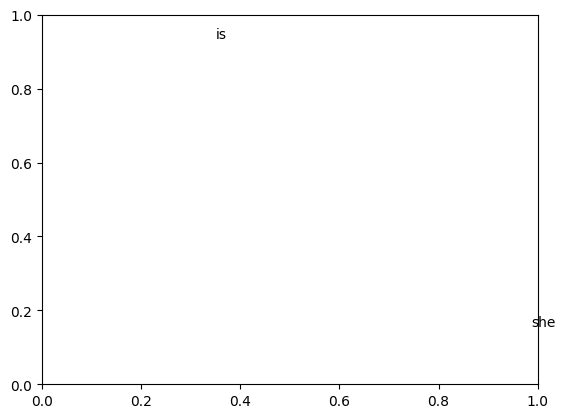

In [47]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
for word in words:
    print(word, vectors[word2int[word]][1])
    ax.annotate(word, (vectors[word2int[word]][0],vectors[word2int[word]][1] ))
plt.show()